#### The steps to project demand of Sales using historical data from Sample Superstore. 

1. [Cleaning and sanitizing](#Cleaning-and-sanitizing-the-Sample-Superstore-data)

2. [Exploratory Data Analysis](#Exploratory-Data-Analysis)
    - [Univariate Analysis](#Univariate-Analysis)   
    - [Bivariate and Mulitivariate Analysis](#Bivariate-and-Mulitivariate-Analysis)
 
3. [Preprocessing for Time Series Analysis](#Preprocessing-for-Time-Series-Analysis)
    - [Check for Stationarity](#Check-for-Stationarity)
    - [ACF & PACF](#AutoCorrelation-Function-and-Partial-AutoCorrelation-Function)
    
4. [Time Series Analysis Models](#Time-Series-Models)
    - [AR model](#AR-Model)
    - [ARMA model](#ARMA-model)
    - [ARIMA model](#ARIMA-Model)
    - [SARIMA model](#SARIMA-Model)
    - [Exponential Smoothing model](#Exponential-Smoothing-Model)
    - [LSTM model](#LSTM-model)
    - [Fb Prophet model](#Fb-Prophet-model)

### Cleaning and sanitizing the Sample Superstore data

In [1]:
# import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# load dataset
store_data = pd.read_excel(r'C:\Users\JINCY\Desktop\Study Material\DSA\TCS internship\datasets\sample superstore\Sample - Superstore (2).xls')

In [3]:
pd.set_option('display.max_columns', None)

#### Study the dataset

In [4]:
# display the data
store_data

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9989,9990,CA-2014-110422,2014-01-21,2014-01-23,Second Class,TB-21400,Tom Boeckenhauer,Consumer,United States,Miami,Florida,33180,South,FUR-FU-10001889,Furniture,Furnishings,Ultra Door Pull Handle,25.2480,3,0.20,4.1028
9990,9991,CA-2017-121258,2017-02-26,2017-03-03,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,California,92627,West,FUR-FU-10000747,Furniture,Furnishings,Tenex B1-RE Series Chair Mats for Low Pile Car...,91.9600,2,0.00,15.6332
9991,9992,CA-2017-121258,2017-02-26,2017-03-03,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,California,92627,West,TEC-PH-10003645,Technology,Phones,Aastra 57i VoIP phone,258.5760,2,0.20,19.3932
9992,9993,CA-2017-121258,2017-02-26,2017-03-03,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,California,92627,West,OFF-PA-10004041,Office Supplies,Paper,"It's Hot Message Books with Stickers, 2 3/4"" x 5""",29.6000,4,0.00,13.3200


In [5]:
# size of the dataset
store_data.shape

(9994, 21)

Dataset contains 9994 rows and 21 columns.

In [6]:
# info about data
store_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9994 non-null   int64         
 1   Order ID       9994 non-null   object        
 2   Order Date     9994 non-null   datetime64[ns]
 3   Ship Date      9994 non-null   datetime64[ns]
 4   Ship Mode      9994 non-null   object        
 5   Customer ID    9994 non-null   object        
 6   Customer Name  9994 non-null   object        
 7   Segment        9994 non-null   object        
 8   Country        9994 non-null   object        
 9   City           9994 non-null   object        
 10  State          9994 non-null   object        
 11  Postal Code    9994 non-null   int64         
 12  Region         9994 non-null   object        
 13  Product ID     9994 non-null   object        
 14  Category       9994 non-null   object        
 15  Sub-Category   9994 n

The columns are mix of datetime, float, int and object datatype.

In [7]:
# display column names
store_data.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')

In [8]:
# check number of unique values of Row ID column
store_data['Row ID'].nunique()

9994

#### Handling inconsistent , irrelevant and duplicate values

The Row ID column is an identifier and doesn't contribute to model building. Hence it can be dropped.

In [9]:
# drop row id
clean_store_data = store_data.drop('Row ID', axis=1)

In [10]:
clean_store_data

,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9989,CA-2014-110422,2014-01-21,2014-01-23,Second Class,TB-21400,Tom Boeckenhauer,Consumer,United States,Miami,Florida,33180,South,FUR-FU-10001889,Furniture,Furnishings,Ultra Door Pull Handle,25.2480,3,0.20,4.1028
9990,CA-2017-121258,2017-02-26,2017-03-03,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,California,92627,West,FUR-FU-10000747,Furniture,Furnishings,Tenex B1-RE Series Chair Mats for Low Pile Car...,91.9600,2,0.00,15.6332
9991,CA-2017-121258,2017-02-26,2017-03-03,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,California,92627,West,TEC-PH-10003645,Technology,Phones,Aastra 57i VoIP phone,258.5760,2,0.20,19.3932
9992,CA-2017-121258,2017-02-26,2017-03-03,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,California,92627,West,OFF-PA-10004041,Office Supplies,Paper,"It's Hot Message Books with Stickers, 2 3/4"" x 5""",29.6000,4,0.00,13.3200


In [11]:
# change datatype of postal code to object
clean_store_data['Postal Code'] = clean_store_data['Postal Code'].astype('object')

In [12]:
clean_store_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Order ID       9994 non-null   object        
 1   Order Date     9994 non-null   datetime64[ns]
 2   Ship Date      9994 non-null   datetime64[ns]
 3   Ship Mode      9994 non-null   object        
 4   Customer ID    9994 non-null   object        
 5   Customer Name  9994 non-null   object        
 6   Segment        9994 non-null   object        
 7   Country        9994 non-null   object        
 8   City           9994 non-null   object        
 9   State          9994 non-null   object        
 10  Postal Code    9994 non-null   object        
 11  Region         9994 non-null   object        
 12  Product ID     9994 non-null   object        
 13  Category       9994 non-null   object        
 14  Sub-Category   9994 non-null   object        
 15  Product Name   9994 n

In [13]:
# display summary statistics
clean_store_data.describe()

,Sales,Quantity,Discount,Profit
count,9994.000000,9994.000000,9994.000000,9994.000000
mean,229.858001,3.789574,0.156203,28.656896
std,623.245101,2.225110,0.206452,234.260108
min,0.444000,1.000000,0.000000,-6599.978000
25%,17.280000,2.000000,0.000000,1.728750
50%,54.490000,3.000000,0.200000,8.666500
75%,209.940000,5.000000,0.200000,29.364000
max,22638.480000,14.000000,0.800000,8399.976000


-ve value in Profit indicating loss.

In [14]:
# object columns summary statistics
clean_store_data.describe(include='O')

,Order ID,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name
count,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994
unique,5009,4,793,793,3,1,531,49,631,4,1862,3,17,1850
top,CA-2017-100111,Standard Class,WB-21850,William Brown,Consumer,United States,New York City,California,10035,West,OFF-PA-10001970,Office Supplies,Binders,Staple envelope
freq,14,5968,37,37,5191,9994,915,2001,263,3203,19,6026,1523,48


In [15]:
# check for null values 
clean_store_data.isna().sum()

Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64

There are no null values in the dataset.

In [16]:
# check for any duplicated values
clean_store_data.duplicated().sum()

1

In [17]:
clean_store_data[clean_store_data.duplicated()]

,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
3406,US-2014-150119,2014-04-23,2014-04-27,Standard Class,LB-16795,Laurel Beltran,Home Office,United States,Columbus,Ohio,43229,East,FUR-CH-10002965,Furniture,Chairs,Global Leather Highback Executive Chair with P...,281.372,2,0.3,-12.0588


In [18]:
#locate the duplicate row
clean_store_data[3400:3410]

,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
3400,CA-2014-102274,2014-11-21,2014-11-26,Standard Class,DH-13075,Dave Hallsten,Corporate,United States,Richmond,Kentucky,40475,South,OFF-ST-10001511,Office Supplies,Storage,Space Solutions Commercial Steel Shelving,193.950,3,0.0,9.6975
3401,CA-2014-102274,2014-11-21,2014-11-26,Standard Class,DH-13075,Dave Hallsten,Corporate,United States,Richmond,Kentucky,40475,South,OFF-AR-10002833,Office Supplies,Art,Newell 322,5.460,3,0.0,1.4742
3402,CA-2015-129700,2015-05-04,2015-05-05,First Class,LA-16780,Laura Armstrong,Corporate,United States,Tinley Park,Illinois,60477,Central,FUR-FU-10001940,Furniture,Furnishings,Staple-based wall hangings,22.288,7,0.6,-8.9152
3403,CA-2017-168739,2017-05-29,2017-06-05,Standard Class,HZ-14950,Henia Zydlo,Consumer,United States,Houston,Texas,77095,Central,FUR-FU-10003919,Furniture,Furnishings,Eldon Executive Woodline II Cherry Finish Desk...,65.424,4,0.6,-52.3392
3404,CA-2015-152527,2015-10-17,2015-10-17,Same Day,CM-12190,Charlotte Melton,Consumer,United States,Los Angeles,California,90004,West,OFF-ST-10003479,Office Supplies,Storage,"Eldon Base for stackable storage shelf, platinum",77.880,2,0.0,3.8940
3405,US-2014-150119,2014-04-23,2014-04-27,Standard Class,LB-16795,Laurel Beltran,Home Office,United States,Columbus,Ohio,43229,East,FUR-CH-10002965,Furniture,Chairs,Global Leather Highback Executive Chair with P...,281.372,2,0.3,-12.0588
3406,US-2014-150119,2014-04-23,2014-04-27,Standard Class,LB-16795,Laurel Beltran,Home Office,United States,Columbus,Ohio,43229,East,FUR-CH-10002965,Furniture,Chairs,Global Leather Highback Executive Chair with P...,281.372,2,0.3,-12.0588
3407,US-2014-150119,2014-04-23,2014-04-27,Standard Class,LB-16795,Laurel Beltran,Home Office,United States,Columbus,Ohio,43229,East,OFF-BI-10000145,Office Supplies,Binders,Zipper Ring Binder Pockets,7.488,8,0.7,-5.2416
3408,US-2014-150119,2014-04-23,2014-04-27,Standard Class,LB-16795,Laurel Beltran,Home Office,United States,Columbus,Ohio,43229,East,FUR-FU-10002191,Furniture,Furnishings,G.E. Halogen Desk Lamp Bulbs,22.336,4,0.2,7.8176
3409,US-2017-150847,2017-04-30,2017-05-06,Standard Class,JF-15490,Jeremy Farry,Consumer,United States,Columbus,Ohio,43229,East,OFF-PA-10004451,Office Supplies,Paper,Xerox 222,10.368,2,0.2,3.6288


In [19]:
# drop duplicate row
clean_store_data.drop_duplicates(inplace=True)

In [20]:
clean_store_data.shape

(9993, 20)

In [21]:
clean_store_data.columns

Index(['Order ID', 'Order Date', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Customer Name', 'Segment', 'Country', 'City', 'State', 'Postal Code',
       'Region', 'Product ID', 'Category', 'Sub-Category', 'Product Name',
       'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')

In [22]:
# drop all the columns that do not contribute to forecasting

clean_store_data1 = clean_store_data.drop(['Order ID','Customer ID','Customer Name','Postal Code','Product ID','Product Name'], axis=1)

In [23]:
clean_store_data1

,Order Date,Ship Date,Ship Mode,Segment,Country,City,State,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,2016-11-08,2016-11-11,Second Class,Consumer,United States,Henderson,Kentucky,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,2016-11-08,2016-11-11,Second Class,Consumer,United States,Henderson,Kentucky,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,2016-06-12,2016-06-16,Second Class,Corporate,United States,Los Angeles,California,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,2015-10-11,2015-10-18,Standard Class,Consumer,United States,Fort Lauderdale,Florida,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,2015-10-11,2015-10-18,Standard Class,Consumer,United States,Fort Lauderdale,Florida,South,Office Supplies,Storage,22.3680,2,0.20,2.5164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9989,2014-01-21,2014-01-23,Second Class,Consumer,United States,Miami,Florida,South,Furniture,Furnishings,25.2480,3,0.20,4.1028
9990,2017-02-26,2017-03-03,Standard Class,Consumer,United States,Costa Mesa,California,West,Furniture,Furnishings,91.9600,2,0.00,15.6332
9991,2017-02-26,2017-03-03,Standard Class,Consumer,United States,Costa Mesa,California,West,Technology,Phones,258.5760,2,0.20,19.3932
9992,2017-02-26,2017-03-03,Standard Class,Consumer,United States,Costa Mesa,California,West,Office Supplies,Paper,29.6000,4,0.00,13.3200


#### Addition of new columns

In [24]:
# create Cost column from sales and profit
clean_store_data1['Cost'] = clean_store_data1['Sales'] - clean_store_data1['Profit']

In [25]:
# extract year, month from order date and shipment date
clean_store_data1['Order Year'] = clean_store_data1['Order Date'].dt.year
clean_store_data1['Order Month'] = clean_store_data1['Order Date'].dt.month
clean_store_data1['Ship Year'] = clean_store_data1['Ship Date'].dt.year
clean_store_data1['Ship Month'] = clean_store_data1['Ship Date'].dt.month

In [26]:
# cleaned data
clean_store_data1

,Order Date,Ship Date,Ship Mode,Segment,Country,City,State,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,Cost,Order Year,Order Month,Ship Year,Ship Month
0,2016-11-08,2016-11-11,Second Class,Consumer,United States,Henderson,Kentucky,South,Furniture,Bookcases,261.9600,2,0.00,41.9136,220.0464,2016,11,2016,11
1,2016-11-08,2016-11-11,Second Class,Consumer,United States,Henderson,Kentucky,South,Furniture,Chairs,731.9400,3,0.00,219.5820,512.3580,2016,11,2016,11
2,2016-06-12,2016-06-16,Second Class,Corporate,United States,Los Angeles,California,West,Office Supplies,Labels,14.6200,2,0.00,6.8714,7.7486,2016,6,2016,6
3,2015-10-11,2015-10-18,Standard Class,Consumer,United States,Fort Lauderdale,Florida,South,Furniture,Tables,957.5775,5,0.45,-383.0310,1340.6085,2015,10,2015,10
4,2015-10-11,2015-10-18,Standard Class,Consumer,United States,Fort Lauderdale,Florida,South,Office Supplies,Storage,22.3680,2,0.20,2.5164,19.8516,2015,10,2015,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9989,2014-01-21,2014-01-23,Second Class,Consumer,United States,Miami,Florida,South,Furniture,Furnishings,25.2480,3,0.20,4.1028,21.1452,2014,1,2014,1
9990,2017-02-26,2017-03-03,Standard Class,Consumer,United States,Costa Mesa,California,West,Furniture,Furnishings,91.9600,2,0.00,15.6332,76.3268,2017,2,2017,3
9991,2017-02-26,2017-03-03,Standard Class,Consumer,United States,Costa Mesa,California,West,Technology,Phones,258.5760,2,0.20,19.3932,239.1828,2017,2,2017,3
9992,2017-02-26,2017-03-03,Standard Class,Consumer,United States,Costa Mesa,California,West,Office Supplies,Paper,29.6000,4,0.00,13.3200,16.2800,2017,2,2017,3


### Exploratory Data Analysis

In [27]:
# check the number of unique values
clean_store_data1.nunique()

Order Date      1237
Ship Date       1334
Ship Mode          4
Segment            3
Country            1
City             531
State             49
Region             4
Category           3
Sub-Category      17
Sales           6144
Quantity          14
Discount          12
Profit          7545
Cost            6854
Order Year         4
Order Month       12
Ship Year          5
Ship Month        12
dtype: int64

#### Univariate Analysis

In [28]:
clean_store_data1['Order Year'].value_counts()

2017    3312
2016    2587
2015    2102
2014    1992
Name: Order Year, dtype: int64

##### Total Orders by Year, Month and Day of the Week

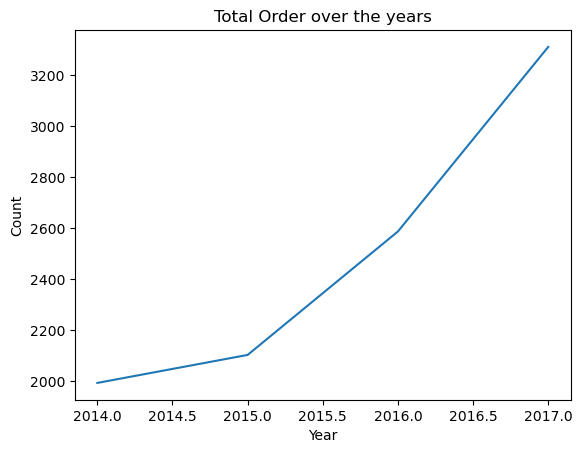

In [29]:
## find the total number of orders over the years
sns.lineplot(clean_store_data1['Order Year'].value_counts().sort_index())
plt.title('Total Order over the years')
plt.xlabel('Year')
plt.ylabel("Count")
plt.show()


Total number of orders have increased over the years.

In [30]:
clean_store_data1['Order Month'].value_counts()

11    1471
12    1408
9     1383
10     819
5      735
6      717
7      710
8      706
3      696
4      667
1      381
2      300
Name: Order Month, dtype: int64

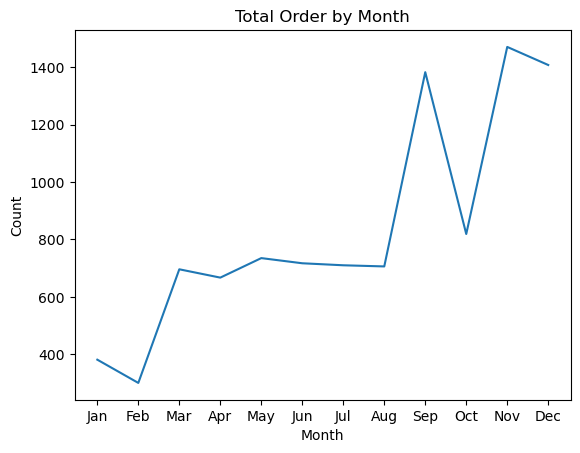

In [31]:
## find the total number of orders by month
sns.lineplot(clean_store_data1['Order Month'].value_counts().sort_index())
plt.title('Total Order by Month')
plt.xticks(range(1,13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.xlabel('Month')
plt.ylabel("Count")
plt.show()

Holiday season - November , December has the highest number of orders.

In [32]:
np.sort(clean_store_data1['Order Year'].unique())

array([2014, 2015, 2016, 2017], dtype=int64)

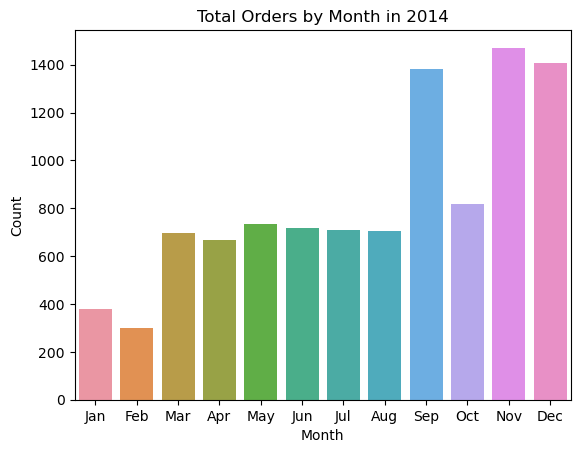

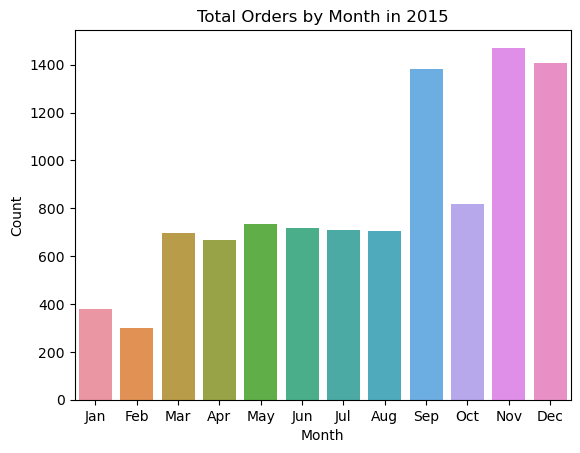

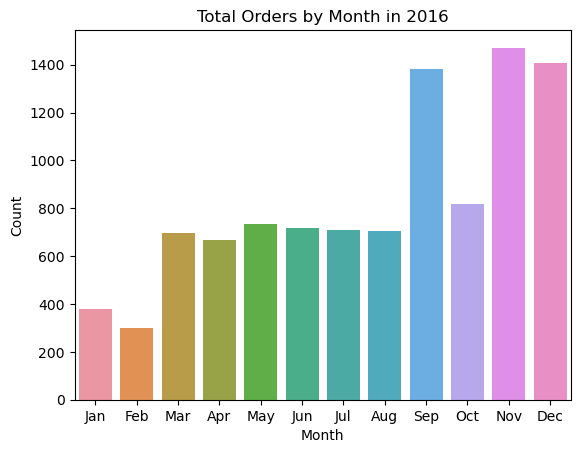

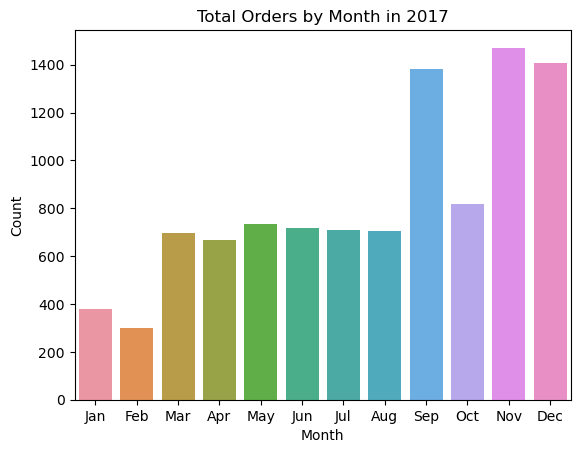

In [33]:
# plot total orders by month for each year
years = np.sort(clean_store_data1['Order Year'].unique())

# Loop over the years and plot the number of orders by month for each year
for year in years:
    data = clean_store_data1[clean_store_data1['Order Year'] == year]
    plt.figure()
    sns.countplot(x='Order Month', data=clean_store_data1)
    plt.title(f"Total Orders by Month in {year}")
    plt.xlabel("Month")
    plt.ylabel("Count")
    plt.xticks(range(12), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.show()

The orders follow a similar pattern in each year. There are less number of orders in the beginning of the year and then it gradually increases.

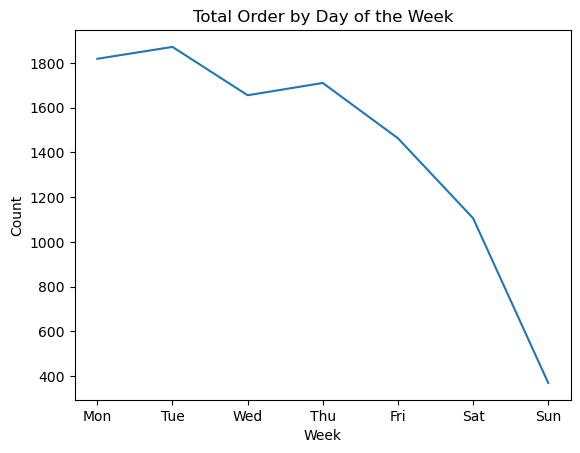

In [34]:
# find the total number of orders by day of the week

# create Day of the week column
clean_store_data1['Order_Week'] = clean_store_data1['Order Date'].dt.day_name()
sns.lineplot(clean_store_data1['Order_Week'].value_counts().sort_index())
plt.title('Total Order by Day of the Week')
plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.xlabel('Week')
plt.ylabel("Count")
plt.show()

Mondays and Tuesdays seems to have very high count of orders.

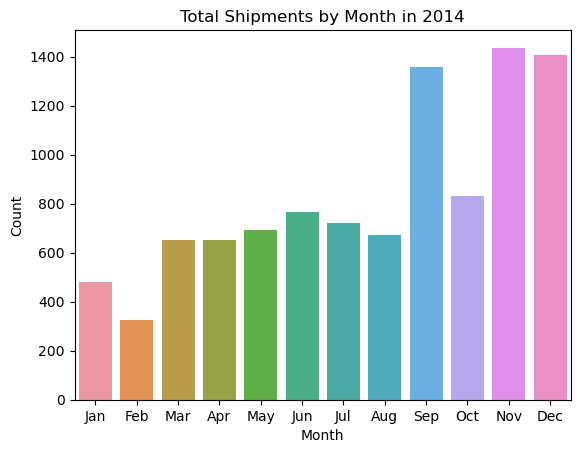

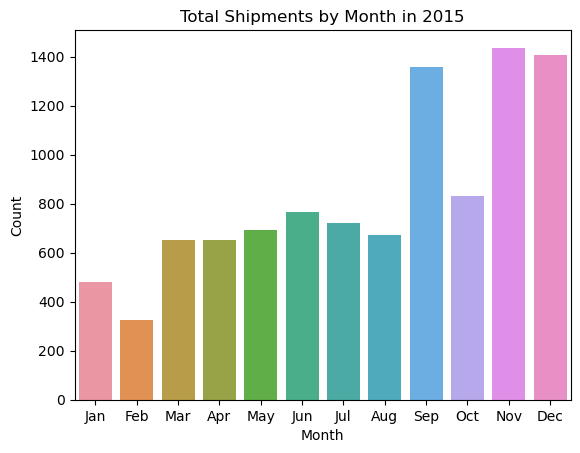

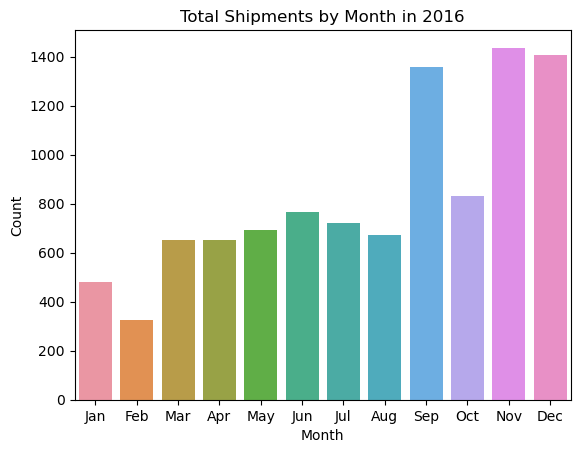

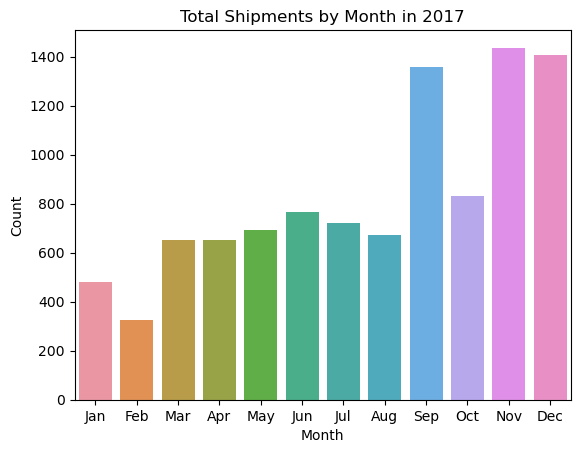

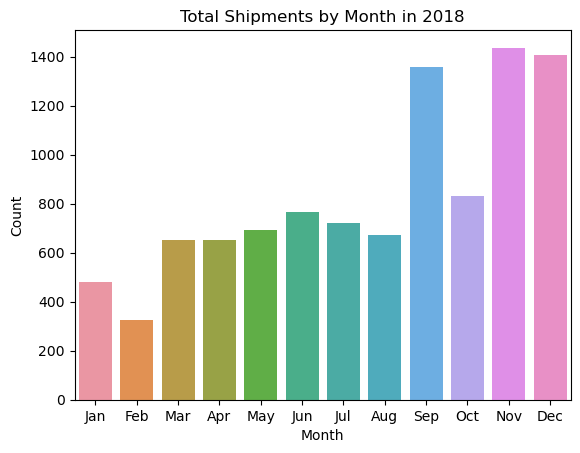

In [35]:
# plot total shipments by month for each year
years = np.sort(clean_store_data1['Ship Year'].unique())

# Loop over the years and plot the number of shipments by month for each year
for year in years:
    data = clean_store_data1[clean_store_data1['Ship Year'] == year]
    plt.figure()
    sns.countplot(x='Ship Month', data=clean_store_data1)
    plt.title(f"Total Shipments by Month in {year}")
    plt.xlabel("Month")
    plt.ylabel("Count")
    plt.xticks(range(12), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.show()

Total number of Shipments by month follow a similar pattern as that of Orders.

##### Distribution of Customer Segment

In [36]:
clean_store_data1['Segment'].value_counts()

Consumer       5191
Corporate      3020
Home Office    1782
Name: Segment, dtype: int64

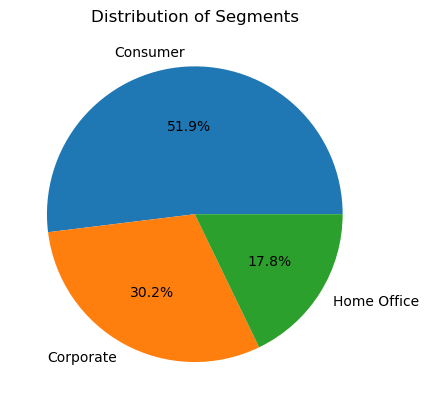

In [37]:
# plot a pie chart showing distribution of Customer Segment
labels = ['Consumer', 'Corporate', 'Home Office']
plt.pie(clean_store_data1['Segment'].value_counts().sort_index(),labels=labels, autopct='%1.1f%%')
plt.title('Distribution of Segments')
plt.show()


Major Segment of Customers are Consumers (51.9%).

##### Distribution of Category


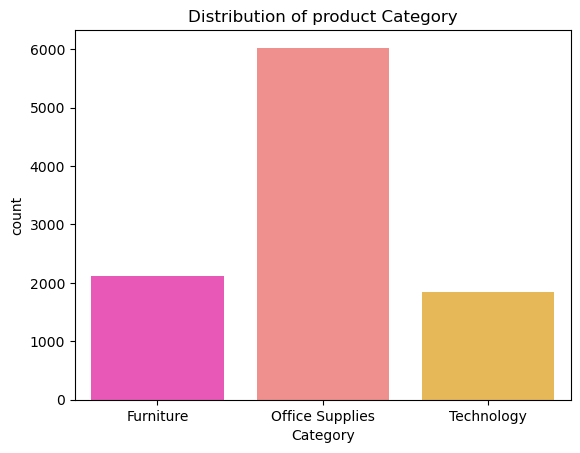

In [38]:
sns.countplot(x=clean_store_data1['Category'], palette="spring")
plt.title('Distribution of product Category')
plt.show()

In [39]:
clean_store_data1['Category'].value_counts()

Office Supplies    6026
Furniture          2120
Technology         1847
Name: Category, dtype: int64

Most of the Customers order from Office Supplies Category.

##### Distribution of Sub Category


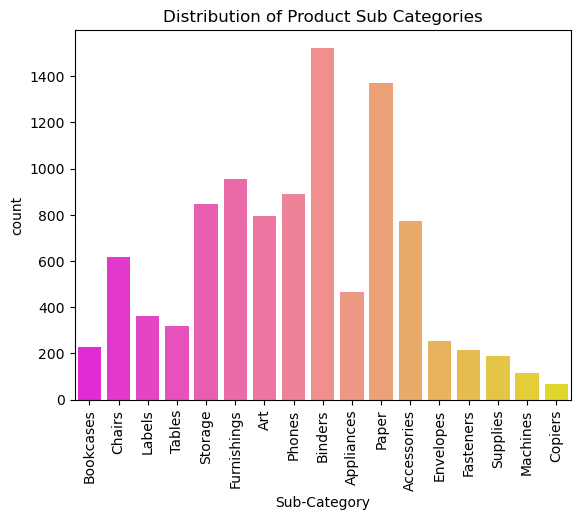

In [40]:
sns.countplot(x=clean_store_data1['Sub-Category'], palette="spring")
plt.title('Distribution of Product Sub Categories')
plt.xticks(rotation=90)
plt.show()

In [41]:
clean_store_data1['Sub-Category'].value_counts()

Binders        1523
Paper          1370
Furnishings     957
Phones          889
Storage         846
Art             796
Accessories     775
Chairs          616
Appliances      466
Labels          364
Tables          319
Envelopes       254
Bookcases       228
Fasteners       217
Supplies        190
Machines        115
Copiers          68
Name: Sub-Category, dtype: int64

Binders are the most frequently ordered product, followed by paper.

##### Orders by Location

In [42]:
clean_store_data1['Region'].value_counts().sort_values(ascending=False)

West       3203
East       2847
Central    2323
South      1620
Name: Region, dtype: int64

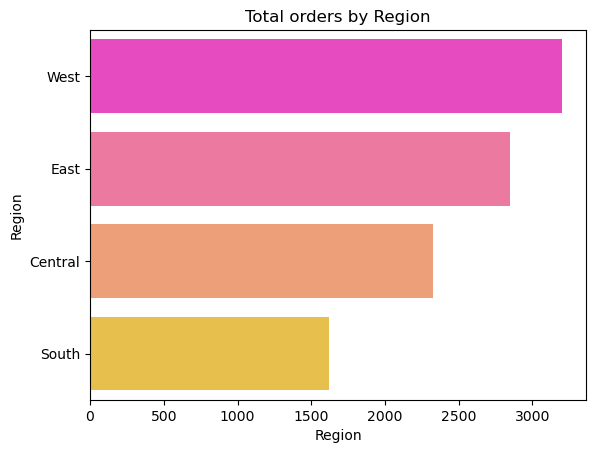

In [43]:
# total orders by Region
sns.barplot(y =clean_store_data1['Region'].value_counts().index, x=clean_store_data1['Region'].value_counts().sort_values(ascending=False),palette="spring")
plt.title('Total orders by Region')
plt.ylabel('Region')
plt.show()

Most orders are from West Region.

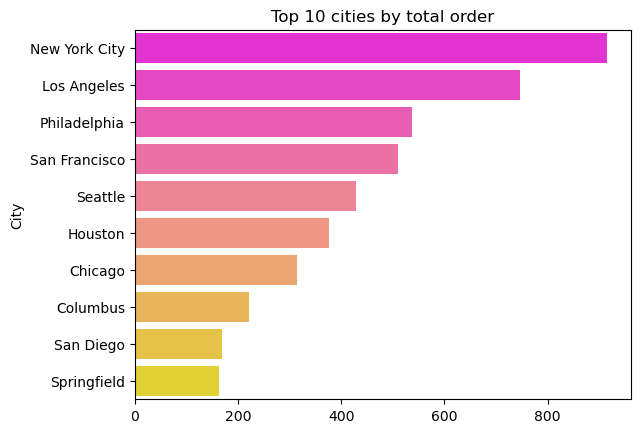

In [44]:
# Top 10 cities by total order
top_cities = clean_store_data1['City'].value_counts().sort_values(ascending=False).head(10)
sns.barplot(x =top_cities.values,y=top_cities.index,palette="spring")
plt.title('Top 10 cities by total order')
plt.ylabel('City')
plt.show()

Most number of orders are from New York City followed by Los Angeles.

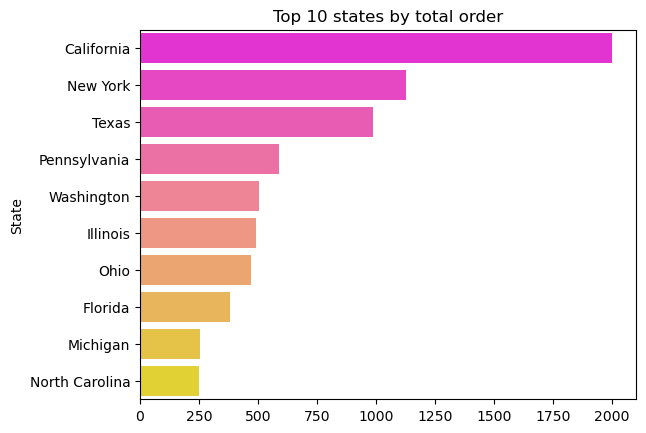

In [45]:
# Top 10 states by total order
top_states = clean_store_data1['State'].value_counts().sort_values(ascending=False).head(10)
sns.barplot(x =top_states.values,y=top_states.index,palette="spring")
plt.title('Top 10 states by total order')
plt.ylabel('State')
plt.show()

California has the most orders of around 2000 , followed by New York around 1250.

#### Bivariate and Mulitivariate Analysis

In [46]:
clean_store_data1.columns

Index(['Order Date', 'Ship Date', 'Ship Mode', 'Segment', 'Country', 'City',
       'State', 'Region', 'Category', 'Sub-Category', 'Sales', 'Quantity',
       'Discount', 'Profit', 'Cost', 'Order Year', 'Order Month', 'Ship Year',
       'Ship Month', 'Order_Week'],
      dtype='object')

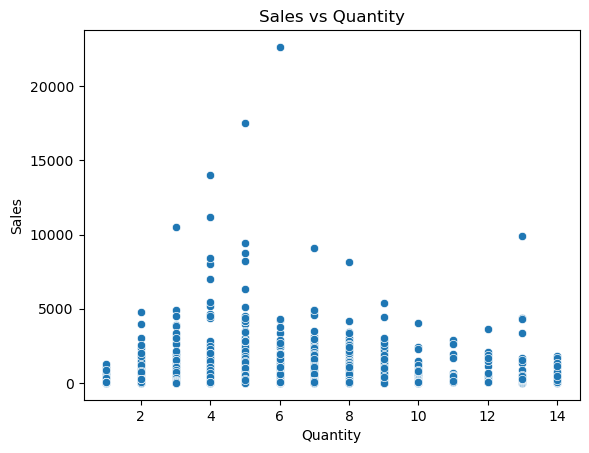

In [47]:
# Sales vs Quantity
sns.scatterplot(y=clean_store_data1['Sales'], x = clean_store_data1['Quantity'])
plt.title('Sales vs Quantity')
plt.show()

Products bought at a quantity below 7 seem to have higher sales.

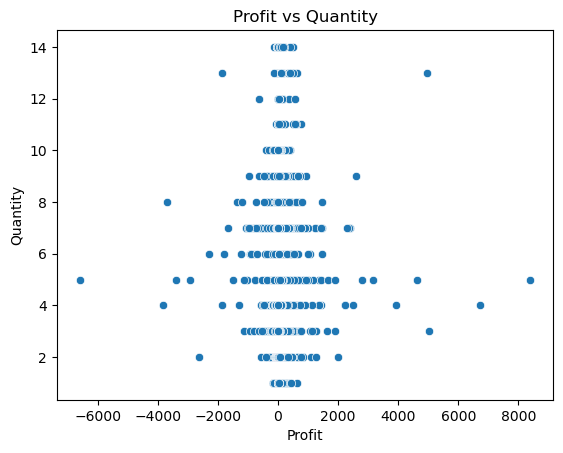

In [48]:
# Profit vs Quantity
sns.scatterplot(x=clean_store_data1['Profit'], y = clean_store_data1['Quantity'])
plt.title('Profit vs Quantity')
plt.show()

Irrespective of the quantity, majority of orders seem to earn very less profit.

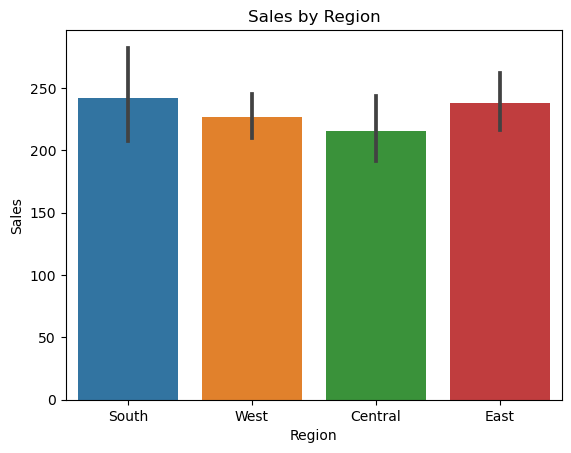

In [49]:
# Sales by Region
sns.barplot(x = clean_store_data1['Region'], y=clean_store_data1['Sales'])
plt.title('Sales by Region')
plt.show()

All the regions have almost equal sales.

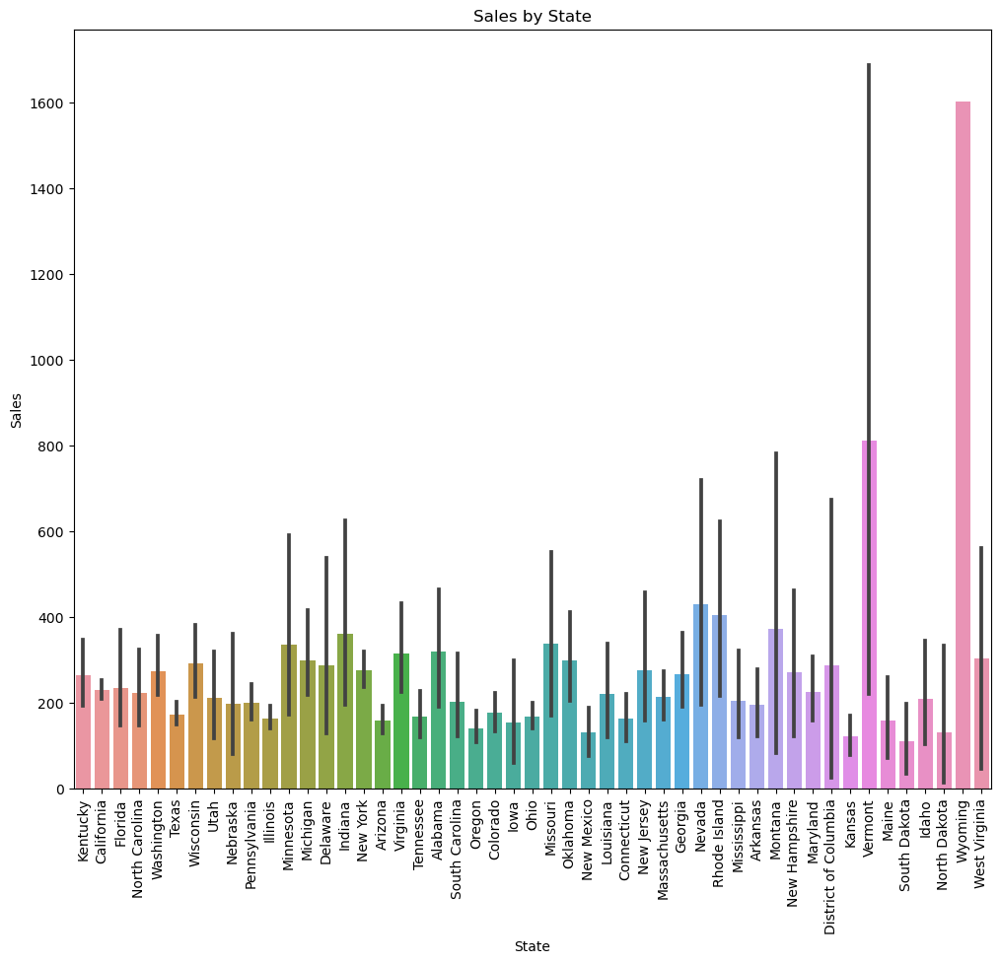

In [50]:
# Sales by State
plt.figure(figsize=(12,10))
sns.barplot(x = clean_store_data1['State'], y=clean_store_data1['Sales'])
plt.xticks(rotation=90)
plt.title('Sales by State')
plt.show()

Wyoming has the most amount of sales, followed by Vermont.

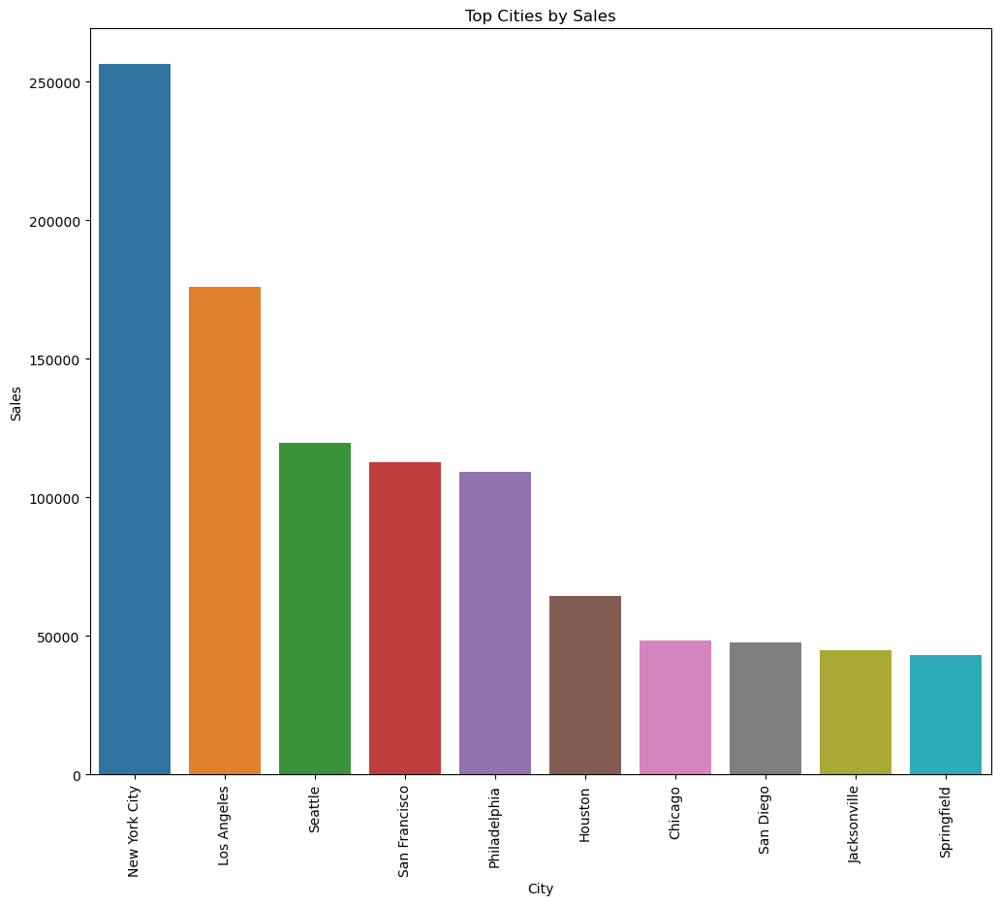

In [51]:
# Sales by City
top_city_sales = clean_store_data1.groupby(['City'])['Sales'].sum().reset_index().sort_values(by='Sales', ascending=False).head(10)

plt.figure(figsize=(12,10))
sns.barplot(x = top_city_sales.City, y=top_city_sales.Sales)
plt.xticks(rotation=90)
plt.title('Top Cities by Sales')
plt.show()

New York City followed by Los Angeles has the highest sales.

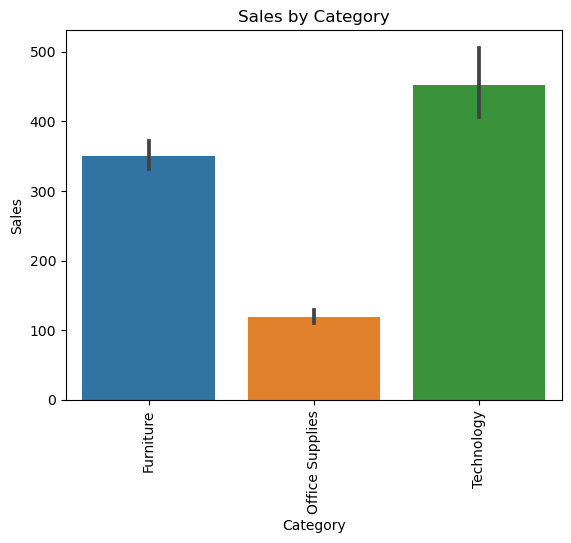

In [52]:
# Sales by Category

sns.barplot(x = clean_store_data1['Category'], y=clean_store_data1['Sales'])
plt.xticks(rotation=90)
plt.title('Sales by Category')
plt.show()


Technology products are making the highest sales.

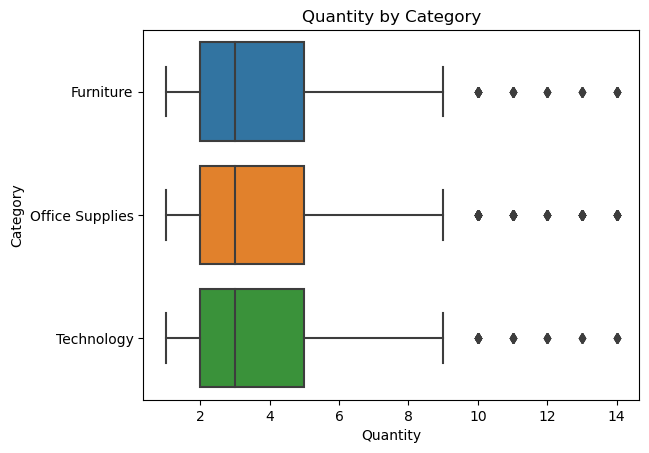

In [53]:
# Quantity by Category

sns.boxplot(y = clean_store_data1['Category'], x=clean_store_data1['Quantity'])
plt.title('Quantity by Category')
plt.show()

Quantity is equally distributed for each Category.

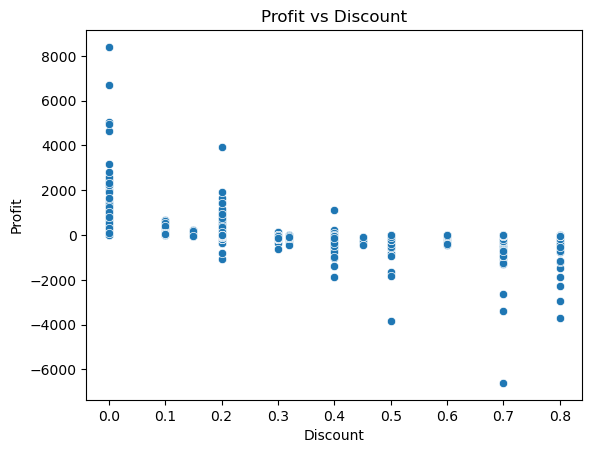

In [54]:
# Profit vs Discount
sns.scatterplot(y=clean_store_data1['Profit'], x = clean_store_data1['Discount'])
plt.title('Profit vs Discount')
plt.show()

Higher the discount, lower the profit.

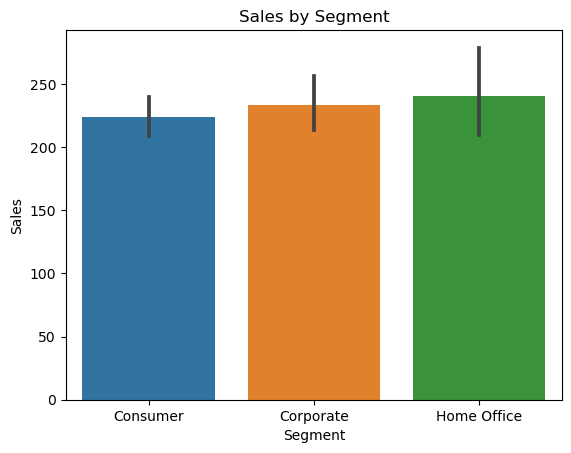

In [55]:
# Sales by Segment
sns.barplot(y = clean_store_data1['Sales'], x=clean_store_data1['Segment'])
plt.title('Sales by Segment')
plt.show()

Sales don't vary much by Segment.

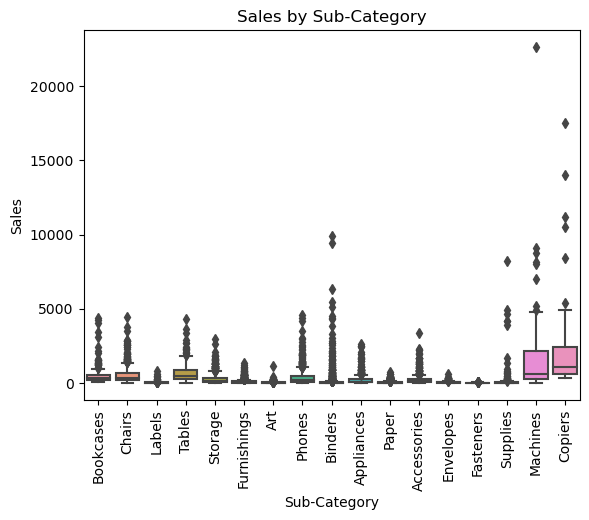

In [56]:
# Sales by Sub-Category
sns.boxplot(y = clean_store_data1['Sales'], x=clean_store_data1['Sub-Category'])
plt.xticks(rotation=90)
plt.title('Sales by Sub-Category')
plt.show()

Copiers followed by machines seem to be making the most sales.

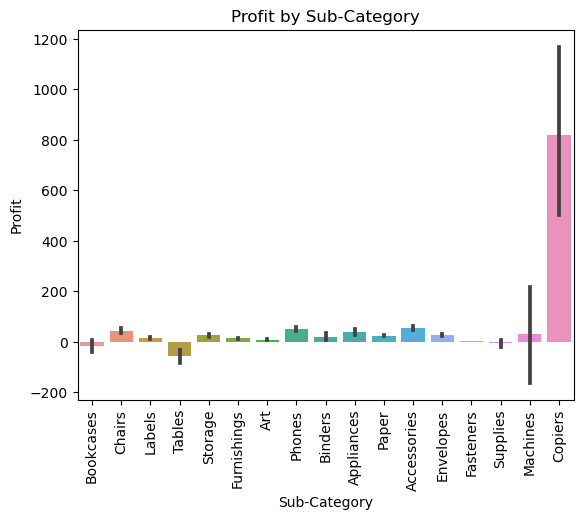

In [57]:
# Profit by Sub-Category
sns.barplot(y = clean_store_data1['Profit'], x=clean_store_data1['Sub-Category'])
plt.xticks(rotation=90)
plt.title('Profit by Sub-Category')
plt.show()

Copiers are making vary large profits. While, tables are causing the most loss.

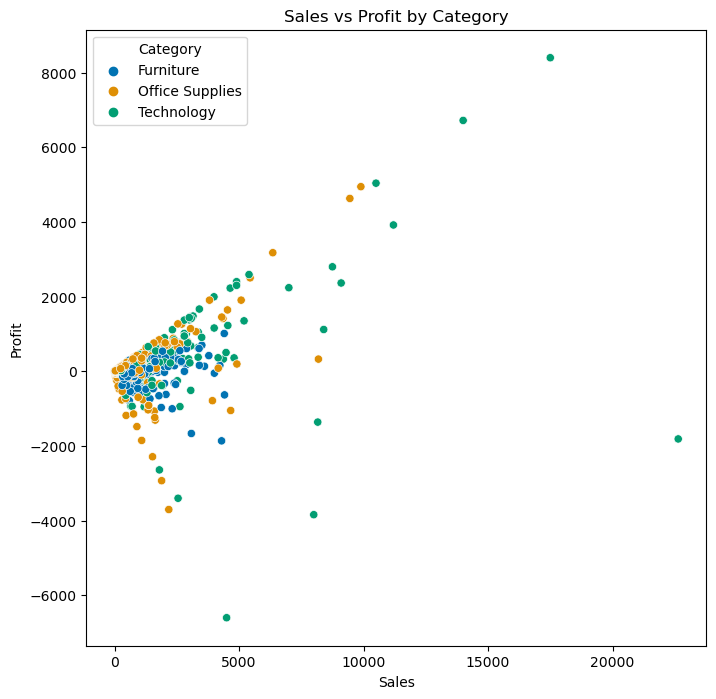

In [58]:
# Sales vs Profit over Category
plt.figure(figsize=(8,8))
sns.scatterplot(x=clean_store_data1['Sales'], y=clean_store_data1['Profit'], hue=clean_store_data1['Category'], palette='colorblind',  sizes=(40,400))
plt.title('Sales vs Profit by Category')
plt.show()

Profit is increasing with Sales for Technology products.

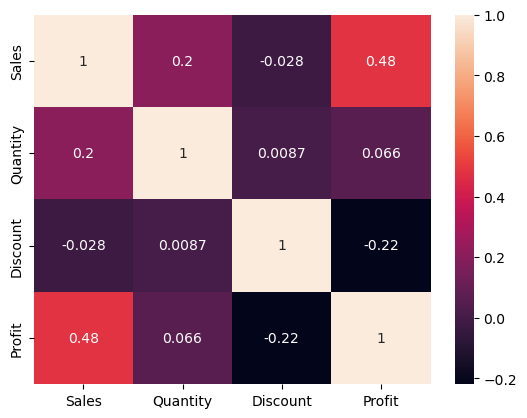

In [59]:
# plot the correlation 
sns.heatmap(clean_store_data1[['Sales', 'Quantity',
       'Discount', 'Profit']].corr(), annot=True)
plt.show()

In [60]:
clean_store_data1.groupby('Sub-Category')['Quantity'].sum()

Sub-Category
Accessories    2976
Appliances     1729
Art            3000
Binders        5974
Bookcases       868
Chairs         2354
Copiers         234
Envelopes       906
Fasteners       914
Furnishings    3563
Labels         1400
Machines        440
Paper          5178
Phones         3289
Storage        3158
Supplies        647
Tables         1241
Name: Quantity, dtype: int64

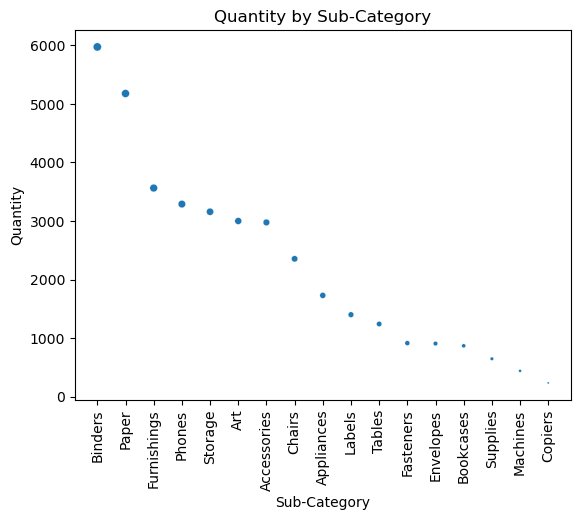

In [61]:
# Quantity by sub-category
grouped_data = clean_store_data1.groupby('Sub-Category')['Quantity'].sum().sort_values(ascending=False)
sns.scatterplot(grouped_data,s=range(34,1,-2))
plt.xticks(rotation=90)
plt.title('Quantity by Sub-Category')
plt.show()

Binders were sold in highest quantity followed by paper.

### Preprocessing for Time Series Analysis

In [62]:
import warnings
warnings.filterwarnings('ignore')

In [63]:
# identify the minimum and maximum Order date
clean_store_data1['Order Date'].describe()

count                    9993
unique                   1237
top       2016-09-05 00:00:00
freq                       38
first     2014-01-03 00:00:00
last      2017-12-30 00:00:00
Name: Order Date, dtype: object

Order data starts from January 3rd 2014 to December 30 2017.

In [64]:
# create a copy of clean_store_data1 for time series analysis

time_series_df = clean_store_data1.copy()


In [65]:
# set the Order Date as index
time_series_df.set_index('Order Date', inplace=True)

In [66]:
time_series_df

,Ship Date,Ship Mode,Segment,Country,City,State,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,Cost,Order Year,Order Month,Ship Year,Ship Month,Order_Week
Order Date,,,,,,,,,,,,,,,,,,,
2016-11-08,2016-11-11,Second Class,Consumer,United States,Henderson,Kentucky,South,Furniture,Bookcases,261.9600,2,0.00,41.9136,220.0464,2016,11,2016,11,Tuesday
2016-11-08,2016-11-11,Second Class,Consumer,United States,Henderson,Kentucky,South,Furniture,Chairs,731.9400,3,0.00,219.5820,512.3580,2016,11,2016,11,Tuesday
2016-06-12,2016-06-16,Second Class,Corporate,United States,Los Angeles,California,West,Office Supplies,Labels,14.6200,2,0.00,6.8714,7.7486,2016,6,2016,6,Sunday
2015-10-11,2015-10-18,Standard Class,Consumer,United States,Fort Lauderdale,Florida,South,Furniture,Tables,957.5775,5,0.45,-383.0310,1340.6085,2015,10,2015,10,Sunday
2015-10-11,2015-10-18,Standard Class,Consumer,United States,Fort Lauderdale,Florida,South,Office Supplies,Storage,22.3680,2,0.20,2.5164,19.8516,2015,10,2015,10,Sunday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-01-21,2014-01-23,Second Class,Consumer,United States,Miami,Florida,South,Furniture,Furnishings,25.2480,3,0.20,4.1028,21.1452,2014,1,2014,1,Tuesday
2017-02-26,2017-03-03,Standard Class,Consumer,United States,Costa Mesa,California,West,Furniture,Furnishings,91.9600,2,0.00,15.6332,76.3268,2017,2,2017,3,Sunday
2017-02-26,2017-03-03,Standard Class,Consumer,United States,Costa Mesa,California,West,Technology,Phones,258.5760,2,0.20,19.3932,239.1828,2017,2,2017,3,Sunday


In [67]:
time_series_df.columns

Index(['Ship Date', 'Ship Mode', 'Segment', 'Country', 'City', 'State',
       'Region', 'Category', 'Sub-Category', 'Sales', 'Quantity', 'Discount',
       'Profit', 'Cost', 'Order Year', 'Order Month', 'Ship Year',
       'Ship Month', 'Order_Week'],
      dtype='object')

In [68]:
# make sure the date is in chronological order
time_series_df.sort_index(inplace=True)

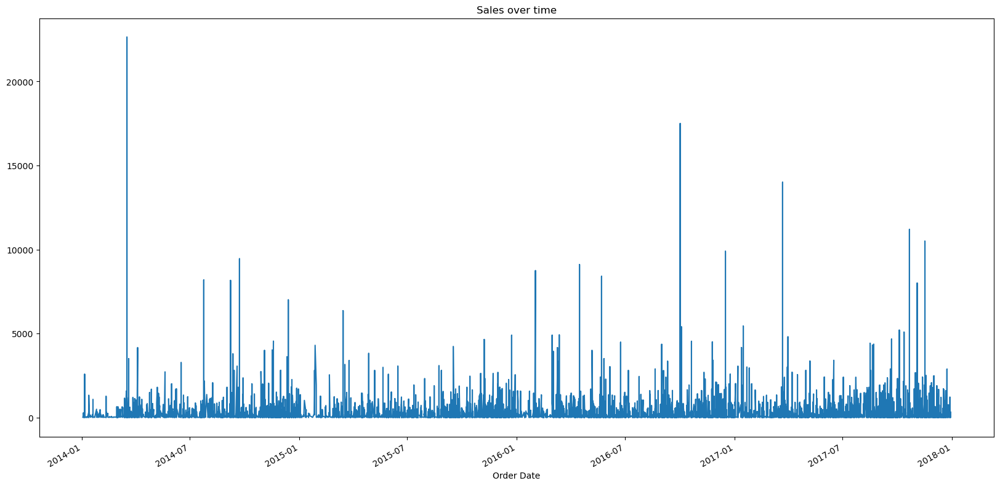

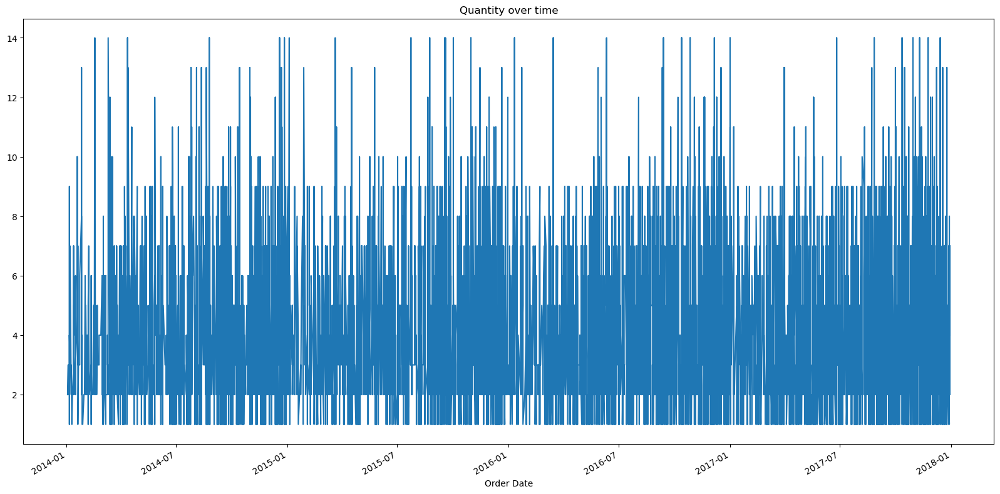

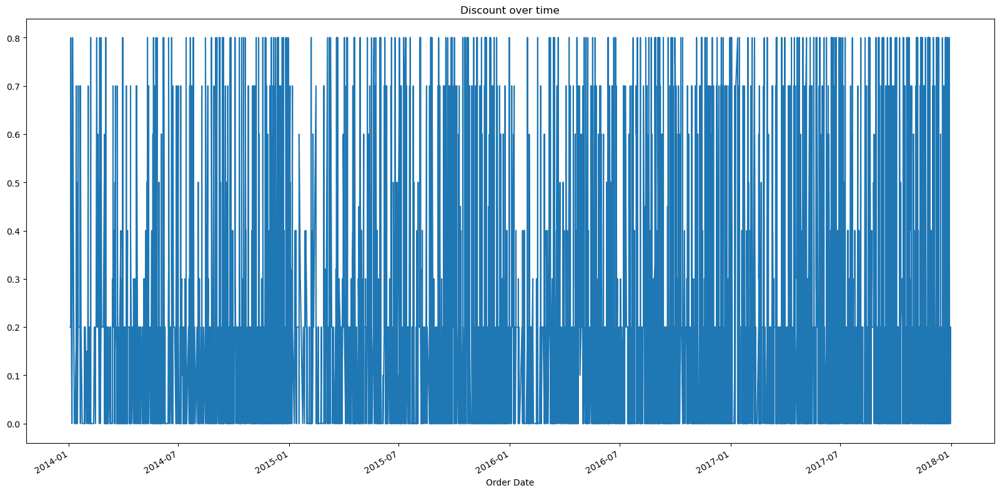

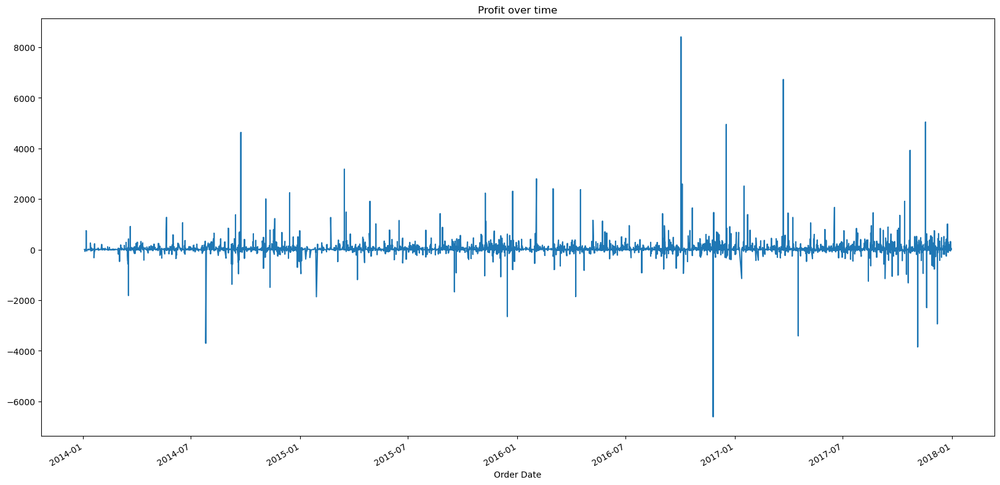

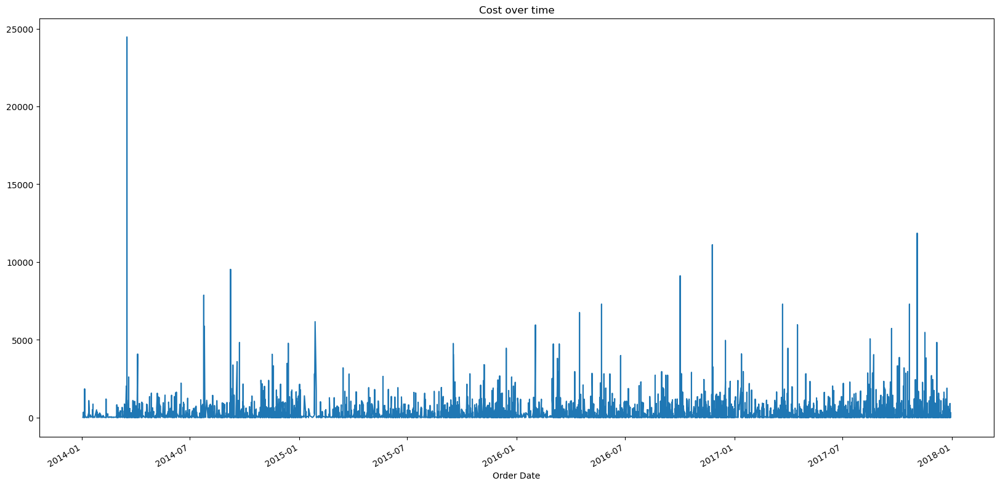

In [69]:
# plot the numerical columns against time

num_cols = ['Sales', 'Quantity', 'Discount',
       'Profit', 'Cost']

for col in num_cols:
    plt.figure(figsize=(20,10))
    time_series_df[col].plot()
    plt.title(f"{col} over time")
    plt.show()

In [70]:
# simplify the dataset by dropping columns
cols = ['Ship Date', 'Ship Mode', 'Segment', 'Country', 'City', 'State',
       'Region', 'Sub-Category', 'Quantity', 'Discount',
       'Profit', 'Cost', 'Order Year', 'Order Month', 'Ship Year',
       'Ship Month', 'Order_Week']
time_series_df = time_series_df.drop(cols, axis=1)

In [71]:
time_series_df

,Category,Sales
Order Date,,
2014-01-03,Office Supplies,16.448
2014-01-04,Office Supplies,11.784
2014-01-04,Office Supplies,272.736
2014-01-04,Office Supplies,3.540
2014-01-05,Office Supplies,19.536
...,...,...
2017-12-30,Office Supplies,3.024
2017-12-30,Office Supplies,52.776
2017-12-30,Technology,90.930


In [72]:
# split the dataset by category
officesupply_sales = time_series_df[time_series_df['Category']=='Office Supplies']
tech_sales = time_series_df[time_series_df['Category']=='Technology']
furniture_sales = time_series_df[time_series_df['Category']=='Furniture']

In [73]:
officesupply_sales.shape

(6026, 2)

In [74]:
print(officesupply_sales.head())
print(tech_sales.head())
print(furniture_sales.head())

                   Category    Sales
Order Date                          
2014-01-03  Office Supplies   16.448
2014-01-04  Office Supplies   11.784
2014-01-04  Office Supplies  272.736
2014-01-04  Office Supplies    3.540
2014-01-05  Office Supplies   19.536
              Category   Sales
Order Date                    
2014-01-06  Technology  391.98
2014-01-06  Technology  755.96
2014-01-09  Technology   31.20
2014-01-13  Technology  646.74
2014-01-15  Technology  149.95
             Category     Sales
Order Date                     
2014-01-06  Furniture  2573.820
2014-01-07  Furniture    76.728
2014-01-10  Furniture    51.940
2014-01-11  Furniture     9.940
2014-01-13  Furniture   333.999


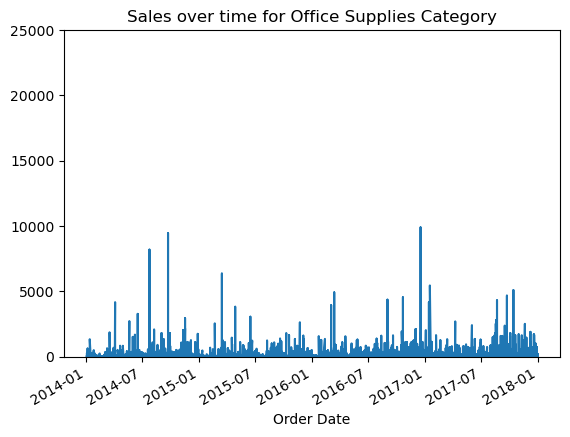

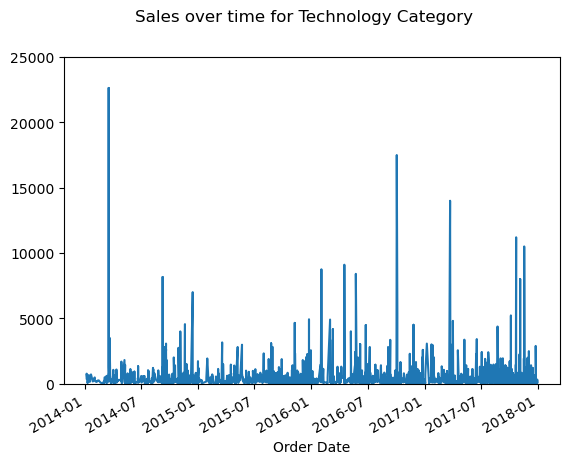

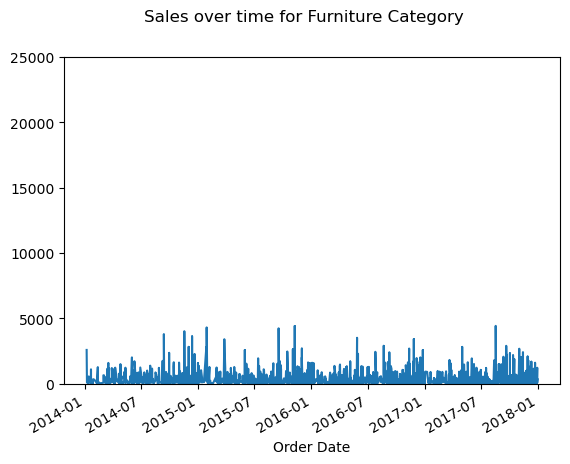

In [75]:
# plot sales against for each category

officesupply_sales['Sales'].plot()
plt.title("Sales over time for Office Supplies Category")
plt.ylim(0,25000)
plt.show()

tech_sales['Sales'].plot()
plt.suptitle("Sales over time for Technology Category")
plt.ylim(0,25000)
plt.show()

furniture_sales['Sales'].plot()
plt.suptitle("Sales over time for Furniture Category")
plt.ylim(0,25000)
plt.show()


Of all the three categories, Furnitures have the lowest sales.

In [76]:
# setting the frequency
# monthly data
officesupp_monthly = officesupply_sales.resample('MS').mean()
tech_monthly = tech_sales.resample('MS').mean()
furniture_monthly = furniture_sales.resample('MS').mean()

In [77]:
print(officesupp_monthly.head())
print(tech_monthly.head())
print(furniture_monthly.head())

                 Sales
Order Date            
2014-01-01   97.021600
2014-02-01   34.571742
2014-03-01   84.371363
2014-04-01  134.398482
2014-05-01  100.501746
                  Sales
Order Date             
2014-01-01   349.254444
2014-02-01   201.063750
2014-03-01  1477.780636
2014-04-01   353.670538
2014-05-01   355.550963
                 Sales
Order Date            
2014-01-01  312.126250
2014-02-01  262.808286
2014-03-01  441.635030
2014-04-01  306.538600
2014-05-01  288.032792


In [78]:
# weekly data
officesupp_weekly = officesupply_sales.resample('W').mean()
tech_weekly = tech_sales.resample('W').mean()
furniture_weekly = furniture_sales.resample('W').mean()

In [79]:
print(officesupp_weekly.head())
print(tech_weekly.head())
print(furniture_weekly.head())

                 Sales
Order Date            
2014-01-05   64.808800
2014-01-12   78.667111
2014-01-19  166.983143
2014-01-26   67.245294
2014-02-02   52.683429
                 Sales
Order Date            
2014-01-12  393.046667
2014-01-19  306.963333
2014-01-26  347.753333
2014-02-02  324.930000
2014-02-09  140.640000
                 Sales
Order Date            
2014-01-12  678.107000
2014-01-19  250.094600
2014-01-26  183.995333
2014-02-02  311.833000
2014-02-09   14.560000


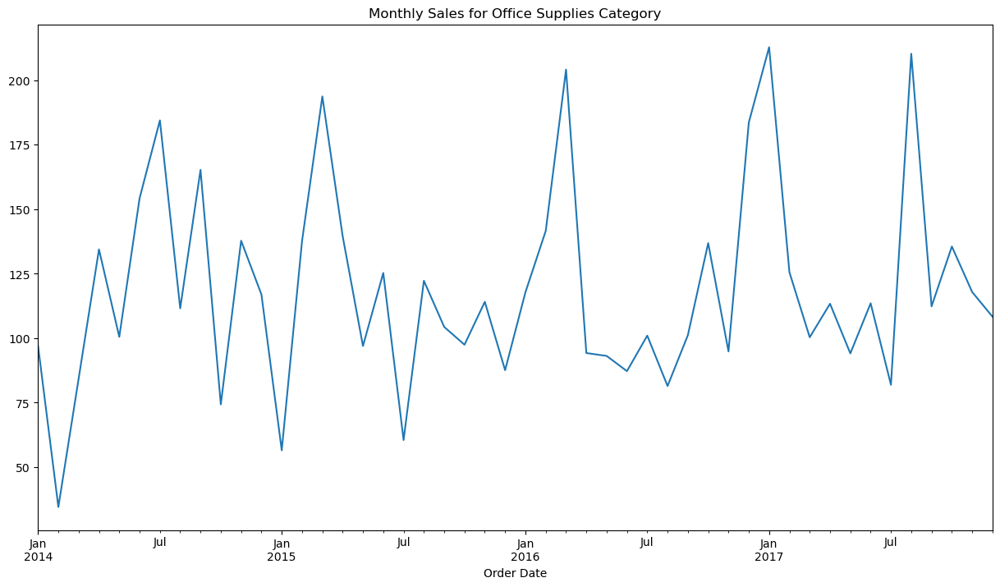

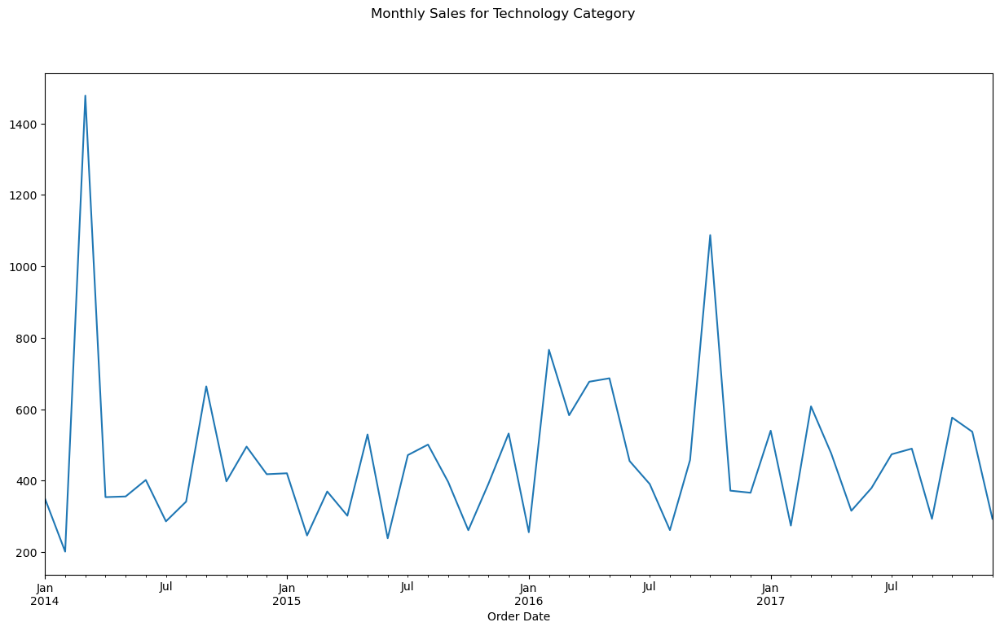

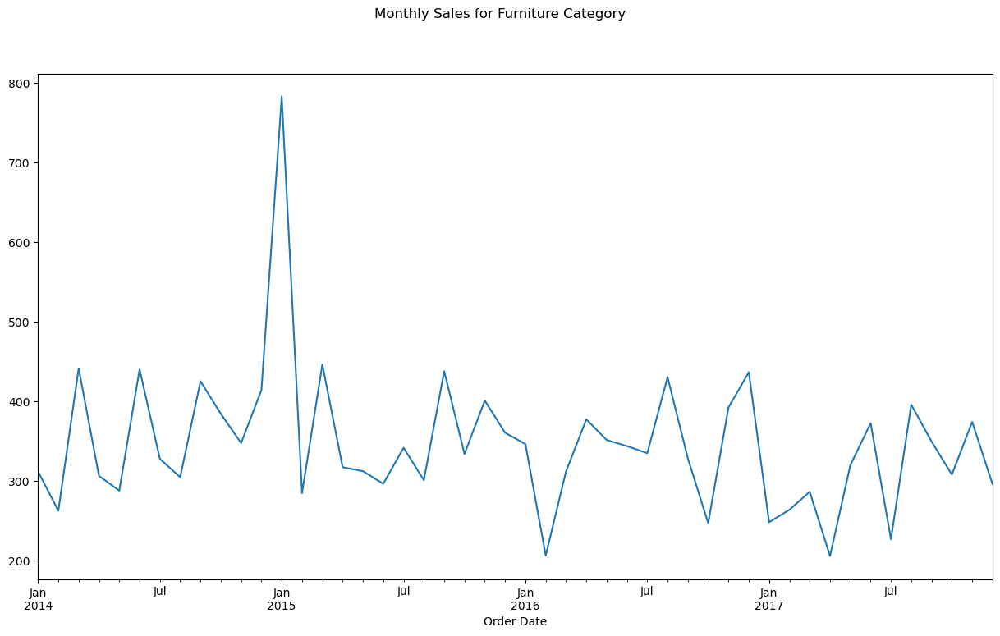

In [80]:
# visualize the monthly data
plt.figure(figsize=(15,8))
officesupp_monthly['Sales'].plot()
plt.title("Monthly Sales for Office Supplies Category")
plt.show()

plt.figure(figsize=(15,8))
tech_monthly['Sales'].plot()
plt.suptitle("Monthly Sales for Technology Category")
plt.show()

plt.figure(figsize=(15,8))
furniture_monthly['Sales'].plot()
plt.suptitle("Monthly Sales for Furniture Category")
plt.show()

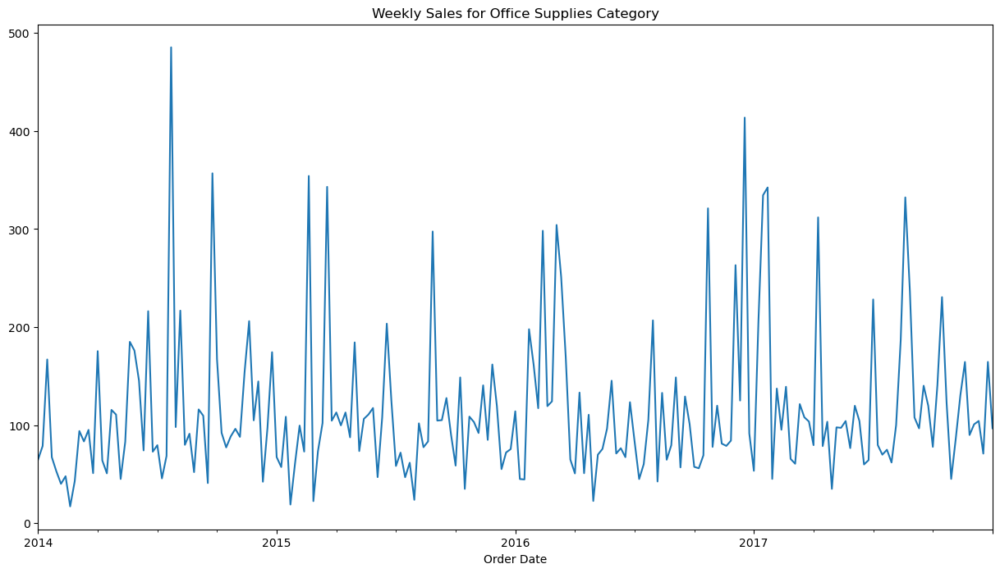

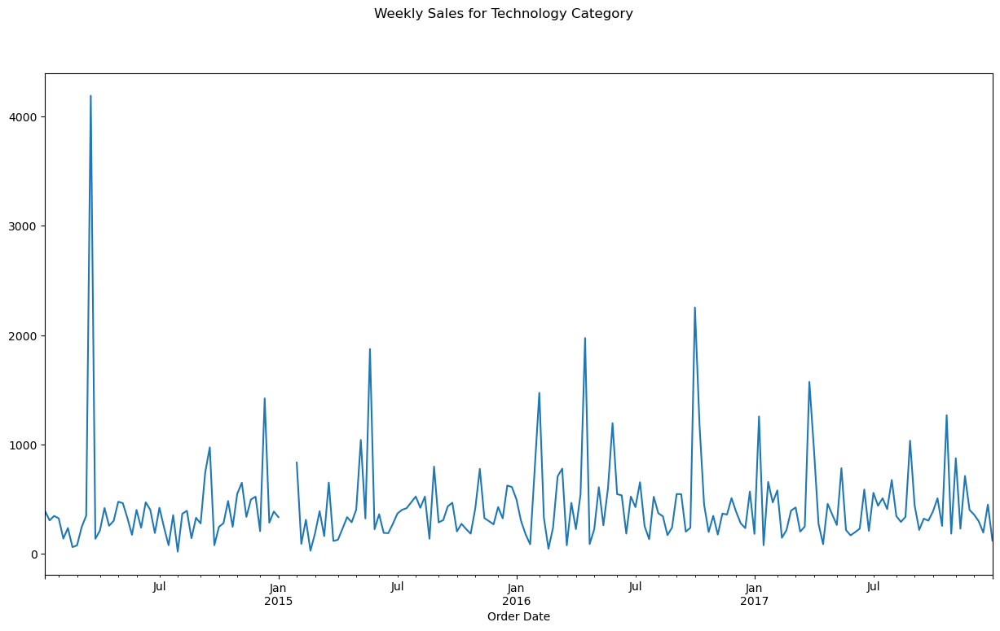

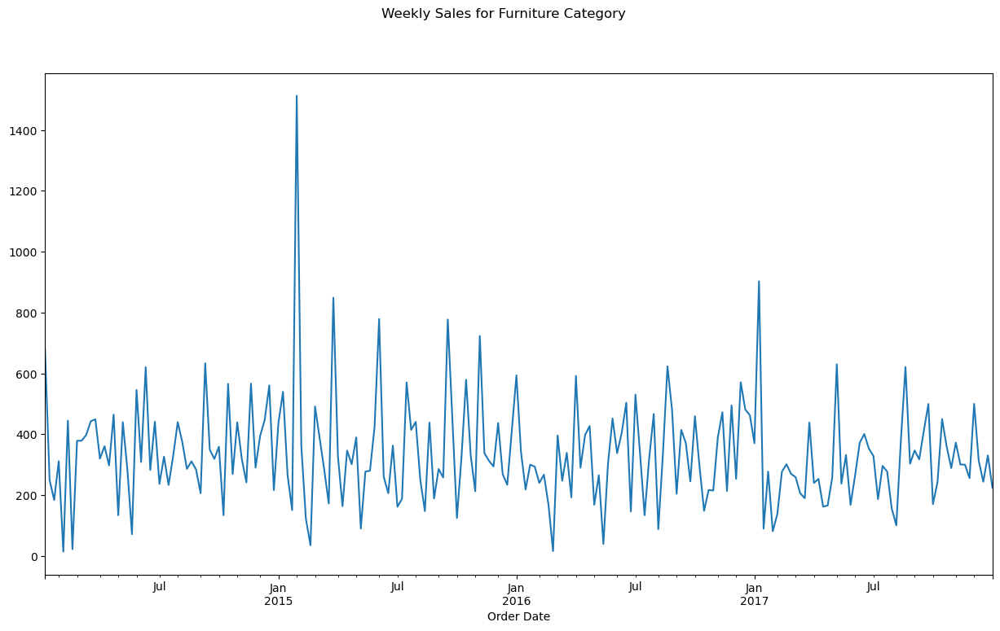

In [81]:
# visualize the weekly data
plt.figure(figsize=(15,8))
officesupp_weekly['Sales'].plot()
plt.title("Weekly Sales for Office Supplies Category")
plt.show()

plt.figure(figsize=(15,8))
tech_weekly['Sales'].plot()
plt.suptitle("Weekly Sales for Technology Category")
plt.show()

plt.figure(figsize=(15,8))
furniture_weekly['Sales'].plot()
plt.suptitle("Weekly Sales for Furniture Category")
plt.show()

In [82]:
# check for any missing values in monthly and quarterly data
officesupp_monthly.isna().sum()

Sales    0
dtype: int64

In [83]:
tech_monthly.isna().sum()

Sales    0
dtype: int64

In [84]:
furniture_monthly.isna().sum()

Sales    0
dtype: int64

In [85]:
print(officesupp_weekly.isna().sum())
print(tech_weekly.isna().sum())
print(furniture_weekly.isna().sum())

Sales    0
dtype: int64
Sales    2
dtype: int64
Sales    0
dtype: int64


In [86]:
tech_weekly['Sales'] = tech_weekly['Sales'].fillna(method='ffill')

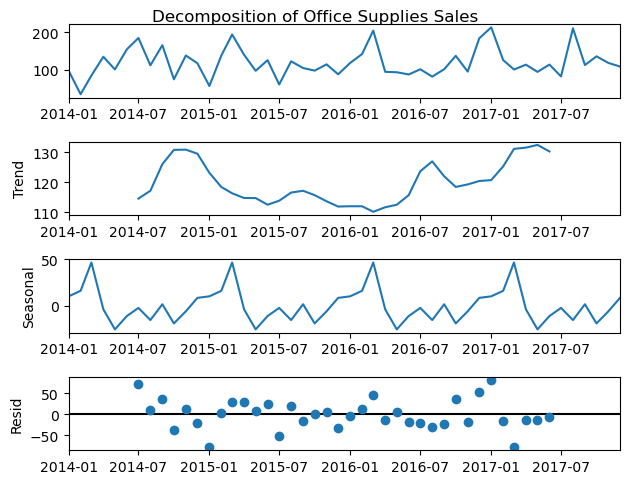

In [87]:
##Check for Seasonality
# decompose the time series - Additive
from statsmodels.tsa.seasonal import seasonal_decompose

office_supp_additive = seasonal_decompose(officesupp_monthly, model='additive')
office_supp_additive.plot()
plt.suptitle('Decomposition of Office Supplies Sales',y=1.0)
plt.show()

There appears to be Seasonality (repeated patterns) in Office Supplies sales.

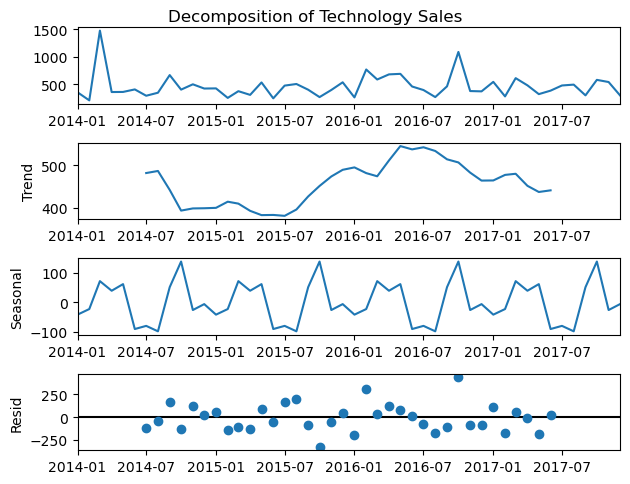

In [88]:
tech_additive = seasonal_decompose(tech_monthly, model='additive')
tech_additive.plot()
plt.suptitle('Decomposition of Technology Sales',y=1.0)
plt.show()

There appears to be Seasonality (repeated patterns) in Technology sales.

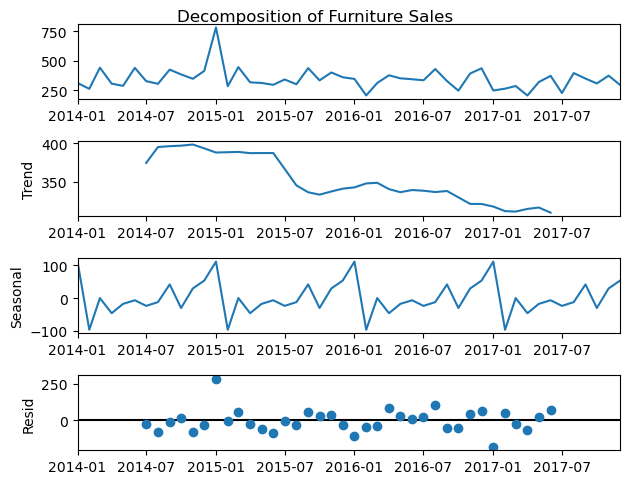

In [89]:
furniture_additive = seasonal_decompose(furniture_monthly, model='additive')
furniture_additive.plot()
plt.suptitle('Decomposition of Furniture Sales',y=1.0)
plt.show()

There appears to be Seasonality (repeated patterns) in Furniture sales as well.

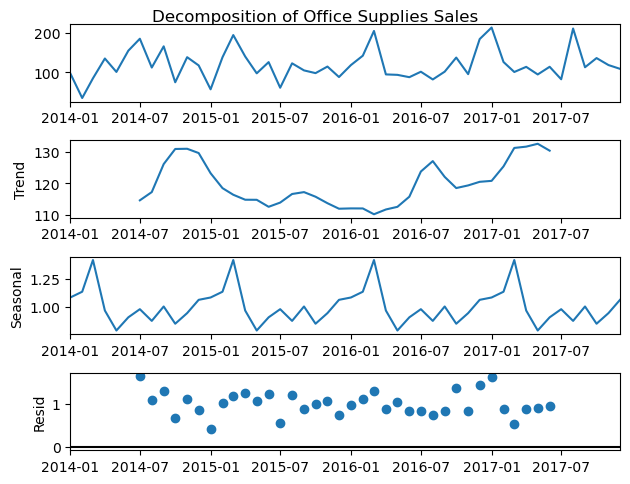

In [90]:
# decompose the time series - Multiplicative
office_supp_mult = seasonal_decompose(officesupp_monthly, model='multiplicative')
office_supp_mult.plot()
plt.suptitle('Decomposition of Office Supplies Sales',y=1.0)
plt.show()

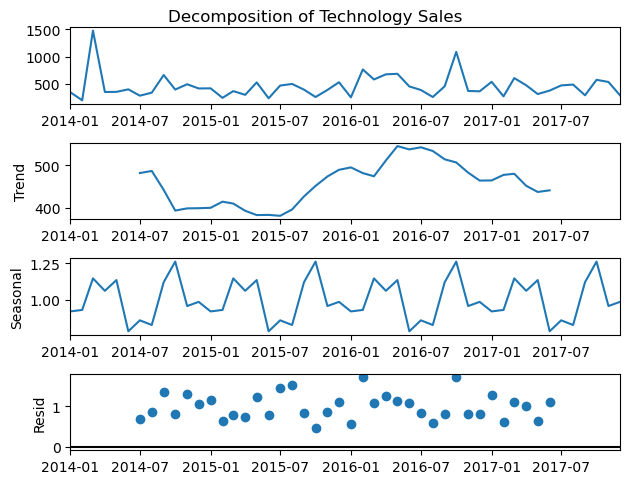

In [91]:
tech_mult = seasonal_decompose(tech_monthly, model='multiplicative')
tech_mult.plot()
plt.suptitle('Decomposition of Technology Sales',y=1.0)
plt.show()

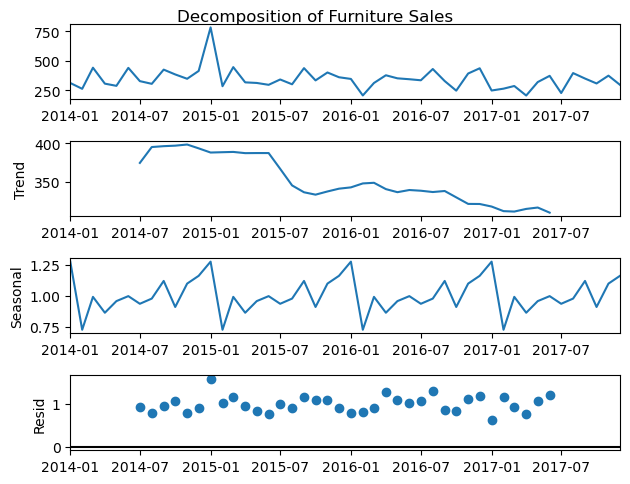

In [92]:
furniture_mult = seasonal_decompose(furniture_monthly, model='multiplicative')
furniture_mult.plot()
plt.suptitle('Decomposition of Furniture Sales',y=1.0)
plt.show()

Seasonal plots are same for Multiplicative decomposition compared to additive, but the errors are far from 0.

Additive decomposition residual looks random hence it seems to be preferred choice for this time series.

#### Check for Stationarity

In [93]:
# determine the rolling statistics

office_rolmean = officesupp_monthly.rolling(window=12).mean()
office_rolstd = officesupp_monthly.rolling(window=12).std()

print(office_rolmean)
print(office_rolstd)

                 Sales
Order Date            
2014-01-01         NaN
2014-02-01         NaN
2014-03-01         NaN
2014-04-01         NaN
2014-05-01         NaN
2014-06-01         NaN
2014-07-01         NaN
2014-08-01         NaN
2014-09-01         NaN
2014-10-01         NaN
2014-11-01         NaN
2014-12-01  116.271613
2015-01-01  112.896845
2015-02-01  121.486095
2015-03-01  130.595948
2015-04-01  131.024369
2015-05-01  130.728776
2015-06-01  128.317509
2015-07-01  117.993097
2015-08-01  118.882877
2015-09-01  113.812452
2015-10-01  115.738496
2015-11-01  113.765153
2015-12-01  111.319448
2016-01-01  116.423309
2016-02-01  116.748827
2016-03-01  117.614822
2016-04-01  113.838627
2016-05-01  113.518123
2016-06-01  110.347029
2016-07-01  113.718710
2016-08-01  110.319666
2016-09-01  110.052266
2016-10-01  113.332912
2016-11-01  111.730624
2016-12-01  119.729499
2017-01-01  127.643847
2017-02-01  126.311055
2017-03-01  117.666494
2017-04-01  119.258123
2017-05-01  119.339807
2017-06-01 

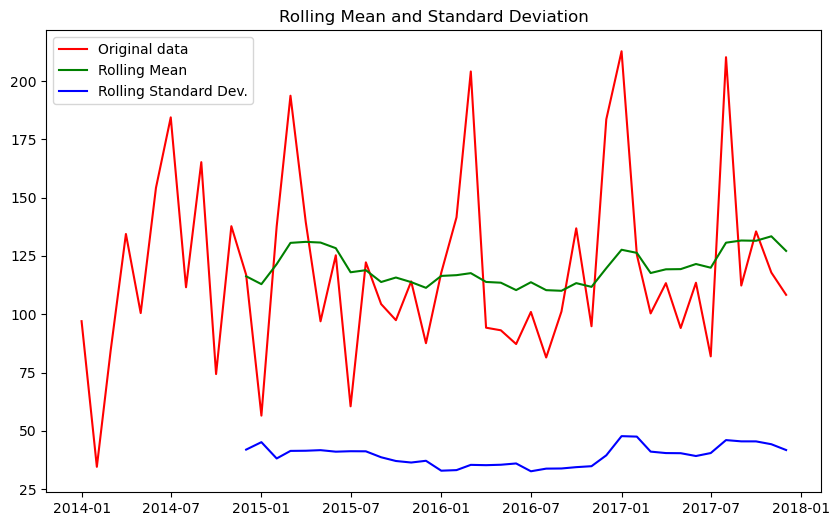

In [94]:
# plot the rolling statistics for office supplies sales
plt.figure(figsize=(10,6))
plt.plot(officesupp_monthly, color='red', label='Original data')
plt.plot(office_rolmean, color='green', label="Rolling Mean")
plt.plot(office_rolstd, color='blue', label= 'Rolling Standard Dev.')
plt.legend()
plt.title('Rolling Mean and Standard Deviation')
plt.show()

Rolling mean and standard deviation varies slightly. It is not possible to make definite conclusion visually, needs statistical approach to test further.

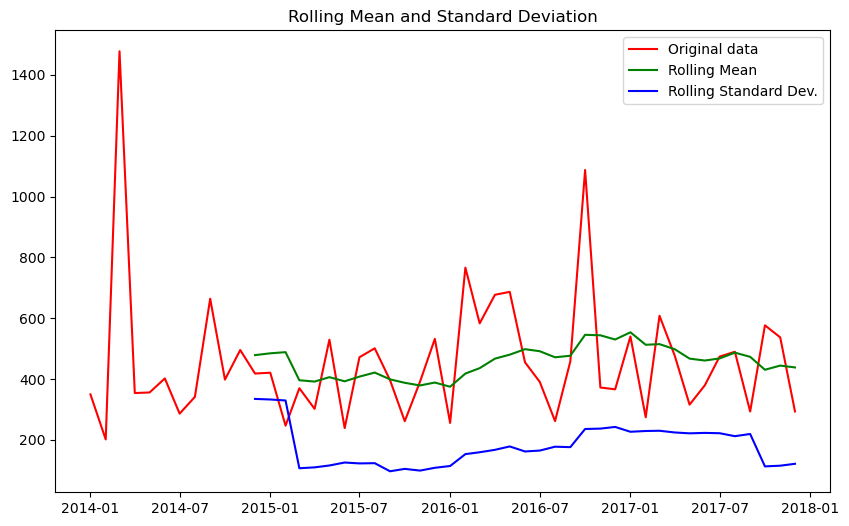

In [95]:
# determine rolling statistics plot it for tech sales

tech_rolmean = tech_monthly.rolling(window=12).mean()
tech_rolstd = tech_monthly.rolling(window=12).std()

plt.figure(figsize=(10,6))
plt.plot(tech_monthly, color='red', label='Original data')
plt.plot(tech_rolmean, color='green', label="Rolling Mean")
plt.plot(tech_rolstd, color='blue', label= 'Rolling Standard Dev.')
plt.legend()
plt.title('Rolling Mean and Standard Deviation')
plt.show()

The data is not stationary. There is variation in rolling mean and std.

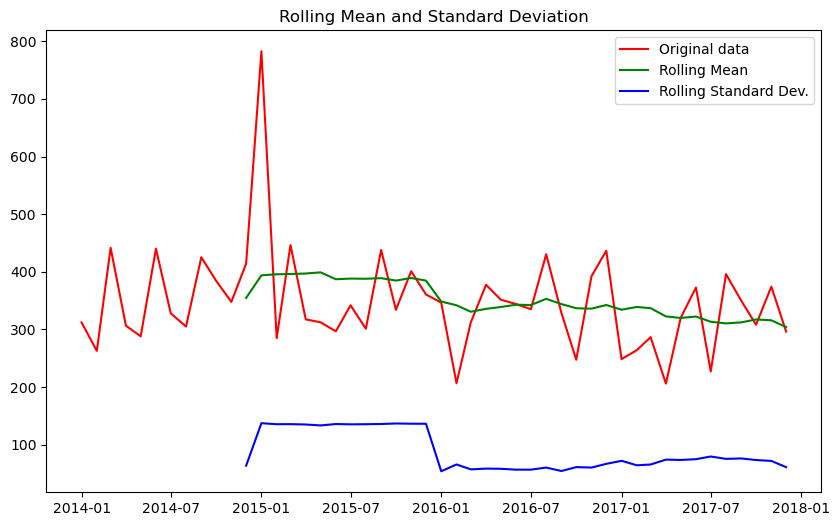

In [96]:
# determine rolling statistics plot it for furniture sales

furn_rolmean = furniture_monthly.rolling(window=12).mean()
furn_rolstd = furniture_monthly.rolling(window=12).std()

plt.figure(figsize=(10,6))
plt.plot(furniture_monthly, color='red', label='Original data')
plt.plot(furn_rolmean, color='green', label="Rolling Mean")
plt.plot(furn_rolstd, color='blue', label= 'Rolling Standard Dev.')
plt.legend()
plt.title('Rolling Mean and Standard Deviation')
plt.show()

The data is not stationary. There is variation in standard deviation.

In [97]:
# Dickey-Fuller test on office_supplies data

from statsmodels.tsa.stattools import adfuller

dftest_office = adfuller(officesupp_monthly['Sales'], autolag='AIC')

dftest_officeout = pd.Series(dftest_office[0:4], index = ['Test statistic','p-value', 'Number of lags','Number of observations'])
for key,value in dftest_office[4].items():
    dftest_officeout['Critical value (%s)'%key] = value
print(dftest_officeout)

Test statistic           -6.100365e+00
p-value                   9.869101e-08
Number of lags            0.000000e+00
Number of observations    4.700000e+01
Critical value (1%)      -3.577848e+00
Critical value (5%)      -2.925338e+00
Critical value (10%)     -2.600774e+00
dtype: float64


p-value is significantly less than 0.05, hence the null statistics can be rejected. The data is stationary.

In [98]:
# Dickey-Fuller test on tech data

dftest_tech = adfuller(tech_monthly['Sales'], autolag='AIC')

dftest_techout = pd.Series(dftest_tech[0:4], index = ['Test statistic','p-value', 'Number of lags','Number of observations'])
for key,value in dftest_tech[4].items():
    dftest_techout['Critical value (%s)'%key] = value
print(dftest_techout)

Test statistic           -7.872567e+00
p-value                   4.940207e-12
Number of lags            0.000000e+00
Number of observations    4.700000e+01
Critical value (1%)      -3.577848e+00
Critical value (5%)      -2.925338e+00
Critical value (10%)     -2.600774e+00
dtype: float64


p-value is significantly less than 0.05, hence the null statistics can be rejected. The data is stationary.

In [99]:
# Dickey-Fuller test on furniture data

dftest_furn = adfuller(furniture_monthly['Sales'], autolag='AIC')

dftest_furnout = pd.Series(dftest_furn[0:4], index = ['Test statistic','p-value', 'Number of lags','Number of observations'])
for key,value in dftest_furn[4].items():
    dftest_furnout['Critical value (%s)'%key] = value
print(dftest_furnout)

Test statistic           -6.961830e+00
p-value                   9.122782e-10
Number of lags            0.000000e+00
Number of observations    4.700000e+01
Critical value (1%)      -3.577848e+00
Critical value (5%)      -2.925338e+00
Critical value (10%)     -2.600774e+00
dtype: float64


p-value is significantly less than 0.05, hence the null statistics can be rejected. The data is stationary.

All the three category's Sales data is Stationary.

In [100]:
# Phillips-Perron (PP) test on Office_supplies data

from arch.unitroot import PhillipsPerron

pptest_office = PhillipsPerron(officesupp_monthly['Sales'])

print('PP test statistic: ', pptest_office.stat)
print('p-value: ', pptest_office.pvalue)



PP test statistic:  -6.740339418319044
p-value:  3.130492322747086e-09


p-value is significantly less than 0.05, hence the null statistics can be rejected. The data is stationary.

In [101]:
# Phillips-Perron (PP) test on tech data

pptest_tech= PhillipsPerron(tech_monthly['Sales'])

print('PP test statistic: ', pptest_tech.stat)
print('p-value: ', pptest_tech.pvalue)



PP test statistic:  -8.052606240874137
p-value:  1.725891867896475e-12


p-value is significantly less than 0.05, hence the null statistics can be rejected. The data is stationary.

In [102]:
# Phillips-Perron (PP) test on furniture data

pptest_furn= PhillipsPerron(furniture_monthly['Sales'])

print('PP test statistic: ', pptest_furn.stat)
print('p-value: ', pptest_furn.pvalue)


PP test statistic:  -6.995976097402261
p-value:  7.532140529975557e-10


p-value is significantly less than 0.05, hence the null statistics can be rejected. The data is stationary.

### AutoCorrelation Function and Partial AutoCorrelation Function

In [103]:
# import acf and pacf plots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [104]:
# find ACF
def find_acf(df,name):
    acf_plot = plot_acf(df.Sales, lags= 40)
    plt.title(f"Autocorrelation of {name}")  

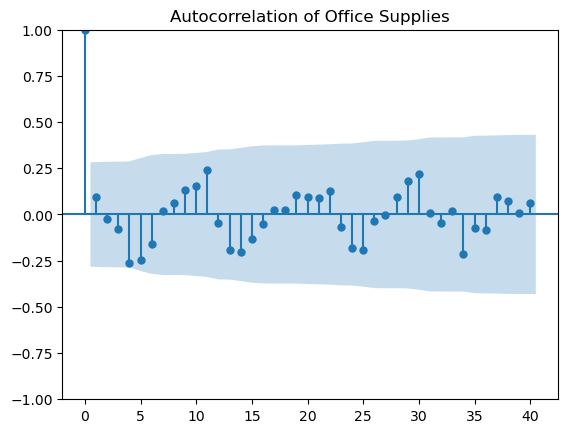

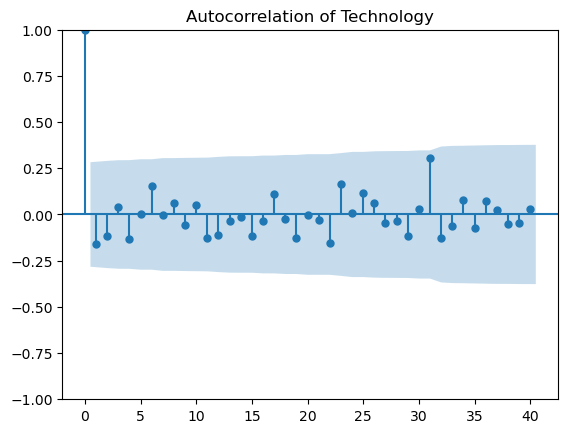

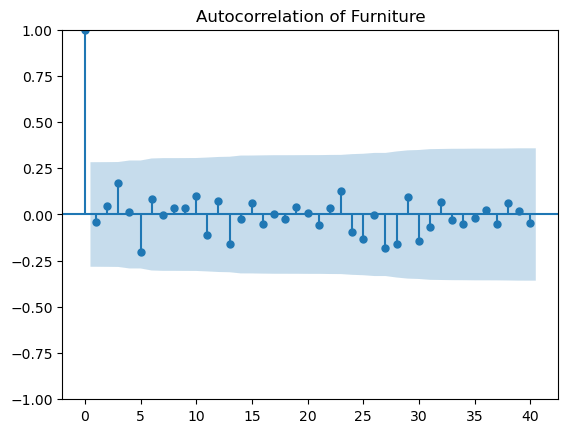

In [105]:
# ACF for all three product categories
dfs = [officesupp_monthly, tech_monthly, furniture_monthly]
categories = ['Office Supplies', 'Technology', 'Furniture']
for df,name in zip(dfs, categories):
    find_acf(df, name)

ACF plots aren't that informative.There is very low autocorrelation present.

In [106]:
# find PACF
def find_pacf(df,name):
    pacf_plot = plot_pacf(df.Sales)
    plt.title(f"Partial Autocorrelation of {name}")  

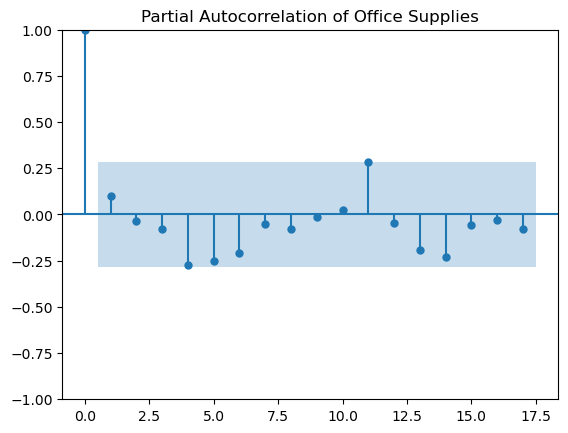

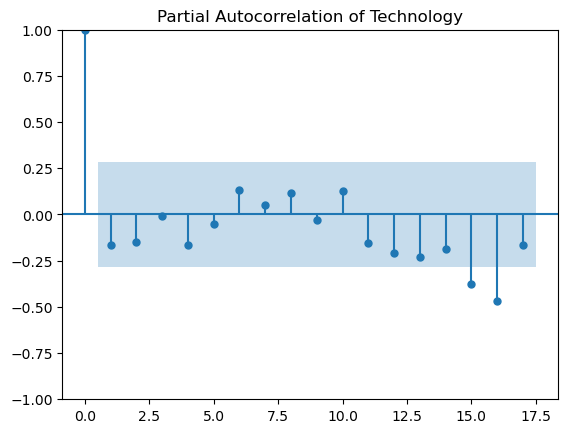

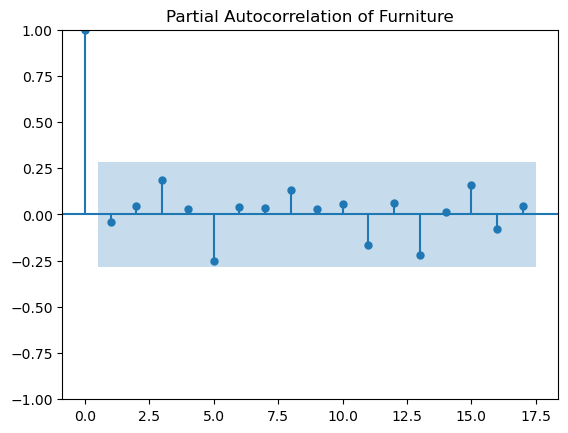

In [107]:
# PACF for all three product categories
dfs = [officesupp_monthly, tech_monthly, furniture_monthly]
categories = ['Office Supplies', 'Technology', 'Furniture']
for df,name in zip(dfs, categories):
    find_pacf(df, name)

Only for Technology, there is correlation at lag 15,16.

### Time Series Models

In [108]:
# split data into testing and training

split_date= pd.to_datetime('2016-12-31')
train_data_off = officesupp_monthly.loc[officesupp_monthly.index <= split_date]
test_data_off  = officesupp_monthly.loc[officesupp_monthly.index > split_date]
train_data_tech = tech_monthly.loc[tech_monthly.index <= split_date]
test_data_tech  = tech_monthly.loc[tech_monthly.index > split_date]
train_data_furn = furniture_monthly.loc[furniture_monthly.index <= split_date]
test_data_furn = furniture_monthly.loc[furniture_monthly.index > split_date]

In [109]:
print(train_data_off.tail())
print(test_data_off.head())

                 Sales
Order Date            
2016-08-01   81.452182
2016-09-01  101.146687
2016-10-01  136.821798
2016-11-01   94.848509
2016-12-01  183.563121
                 Sales
Order Date            
2017-01-01  212.742890
2017-02-01  125.555458
2017-03-01  100.346800
2017-04-01  113.324744
2017-05-01   94.088795


#### AR Model

                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   36
Model:                 ARIMA(6, 0, 0)   Log Likelihood                -178.681
Date:                Thu, 23 Feb 2023   AIC                            373.361
Time:                        12:15:34   BIC                            386.029
Sample:                    01-01-2014   HQIC                           377.783
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        116.8770      3.681     31.755      0.000     109.663     124.091
ar.L1         -0.0538      0.234     -0.230      0.818      -0.513       0.405
ar.L2         -0.1125      0.207     -0.543      0.5

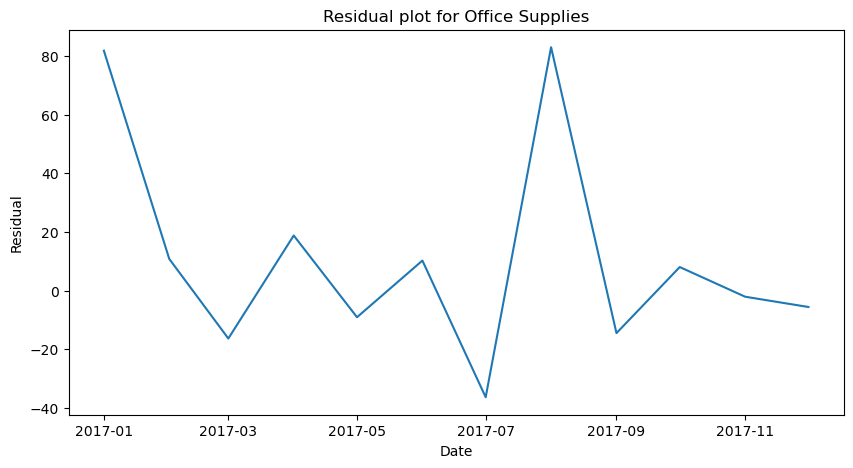

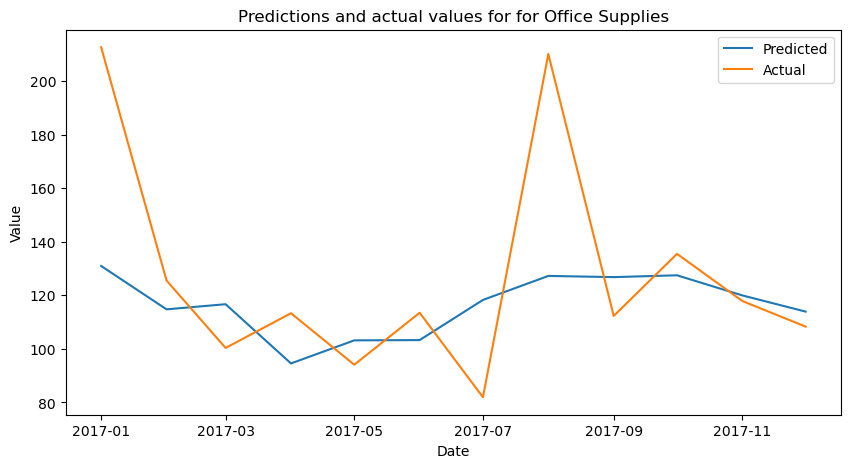

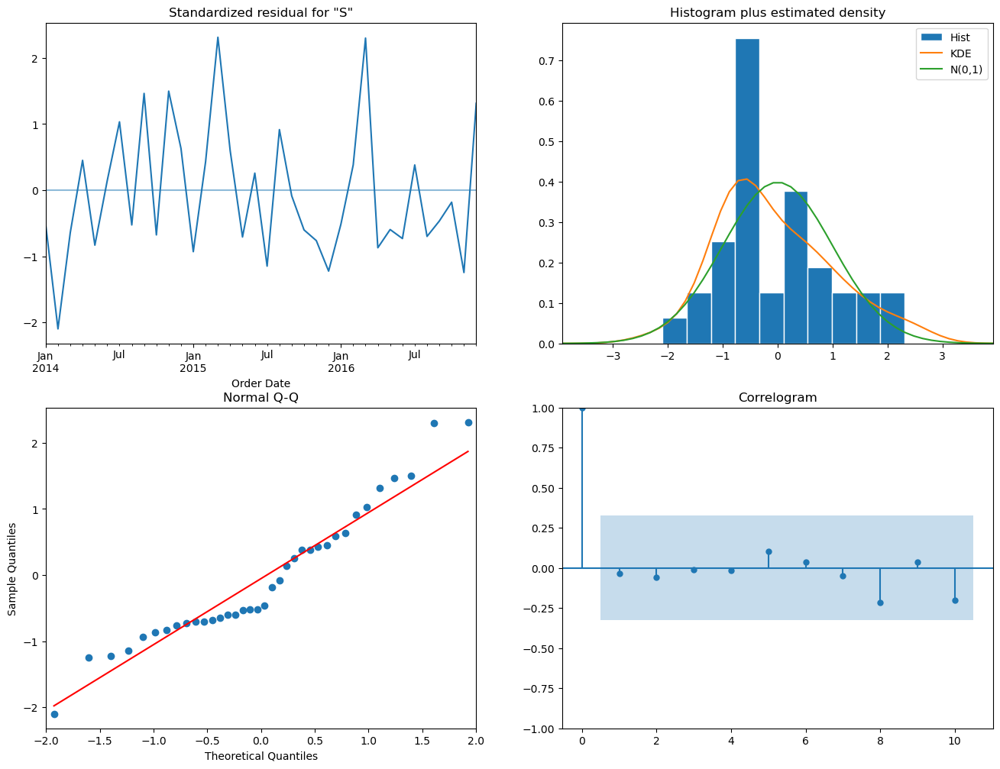

MAPE for Office Supplies Category: 17.35%

RMSE for Office Supplies Category: 36.65


                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   36
Model:                 ARIMA(6, 0, 0)   Log Likelihood                -246.649
Date:                Thu, 23 Feb 2023   AIC                            509.299
Time:                        12:15:36   BIC                            521.967
Sample:                    01-01-2014   HQIC                           513.720
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        463.9302     43.723     10.611      0.000     378.235     549.625
ar.L1         -0.1561      0.368     -0.424  

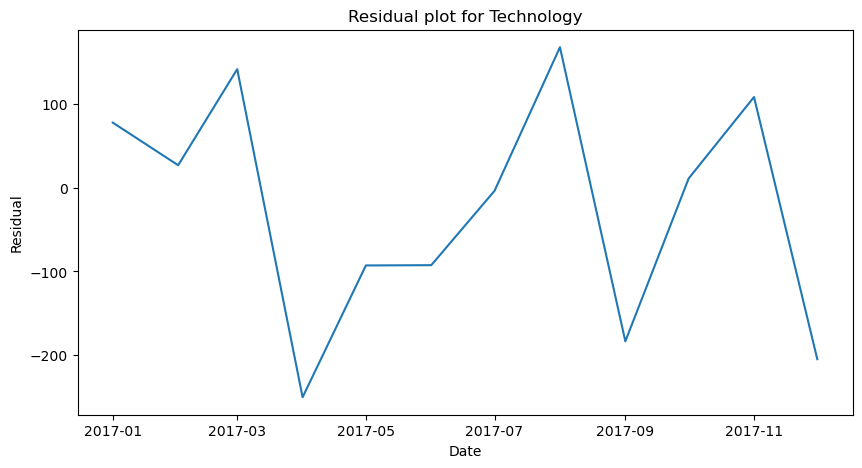

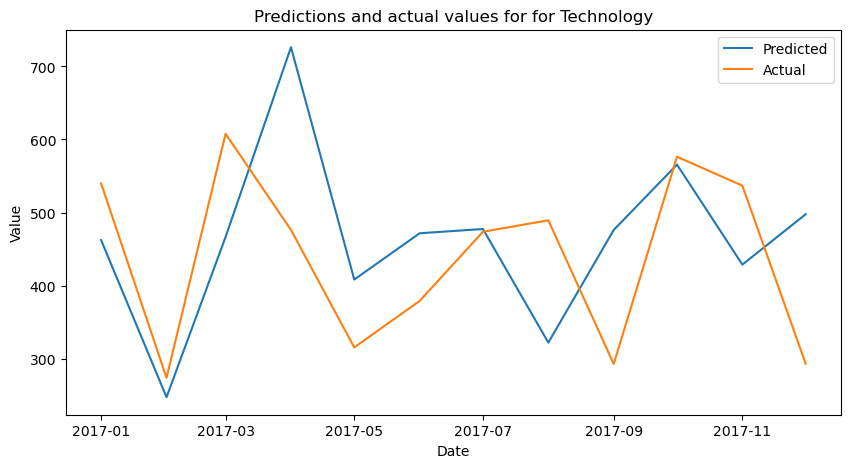

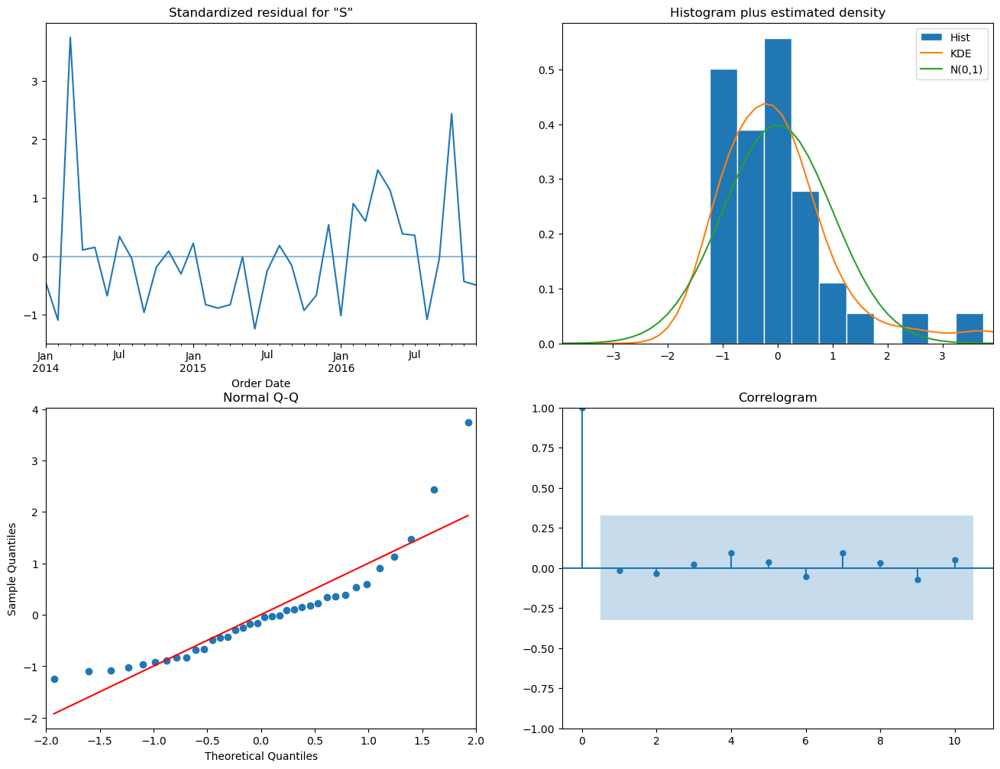

MAPE for Technology Category: 28.58%

RMSE for Technology Category: 135.88


                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   36
Model:                 ARIMA(6, 0, 0)   Log Likelihood                -212.249
Date:                Thu, 23 Feb 2023   AIC                            440.498
Time:                        12:15:37   BIC                            453.166
Sample:                    01-01-2014   HQIC                           444.919
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        361.3145     20.804     17.367      0.000     320.539     402.090
ar.L1         -0.0974      0.519     -0.188      0.851

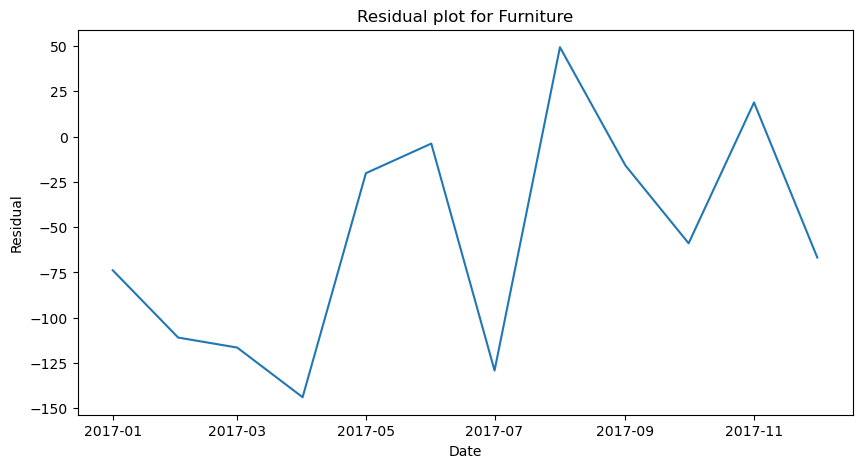

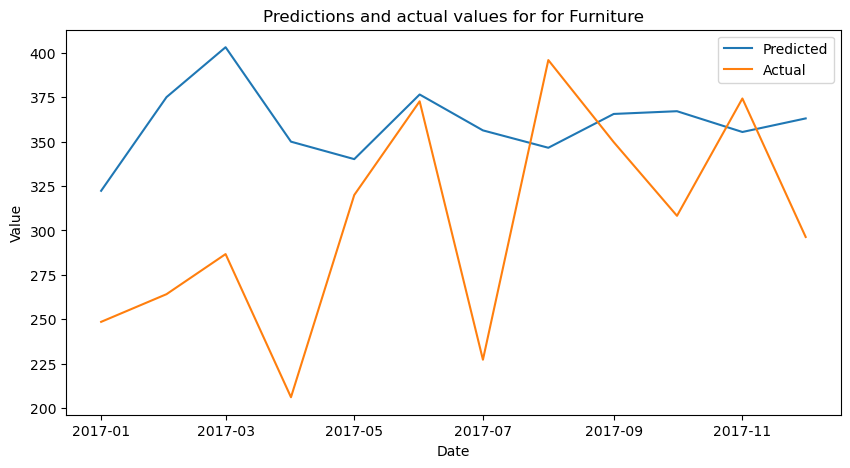

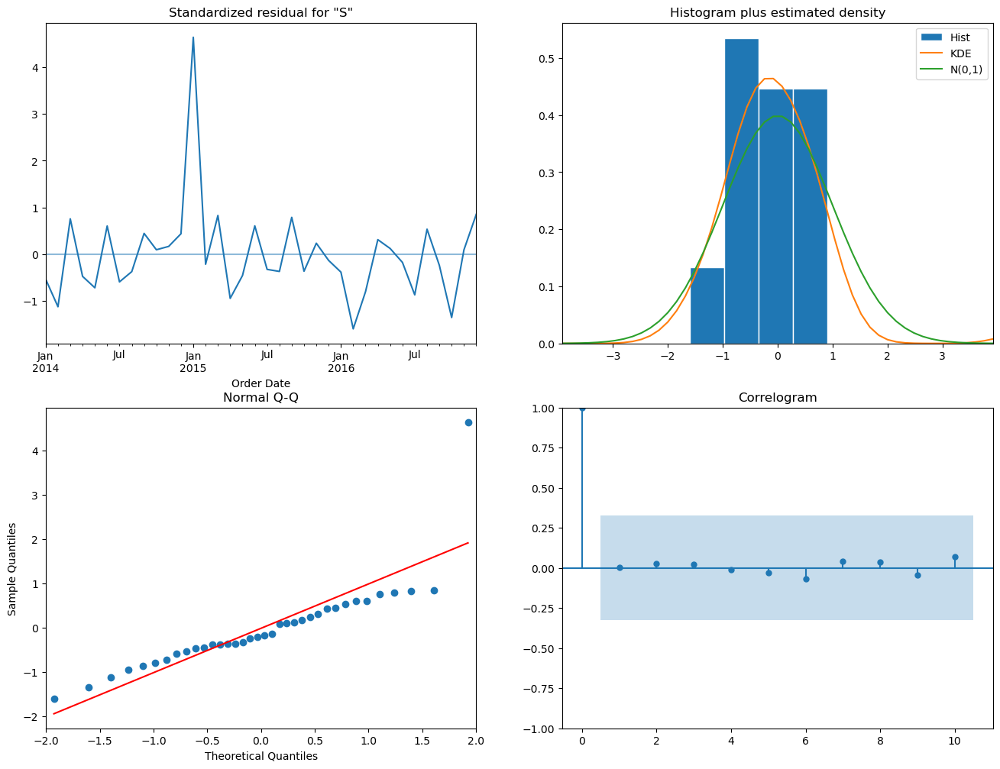

MAPE for Furniture Category: 25.85%

RMSE for Furniture Category: 81.73




In [110]:
# create AR model and plot diagnostics

from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error

train_data = [train_data_off, train_data_tech, train_data_furn]
test_data = [test_data_off, test_data_tech , test_data_furn]

for data1,data2, name in zip(train_data,test_data, categories):
    model = ARIMA(data1, order=(6,0,0))
    result = model.fit()
    print(result.summary())
    
    # make predictions on test data
    pred_start_date = data2.index[0]
    pred_end_date = data2.index[-1]
    predictions = result.predict(start=pred_start_date, end=pred_end_date)
    
    #find residuals
    residuals = data2['Sales'] - predictions

    
    # plot
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(residuals.index, residuals)
    ax.set_title(f'Residual plot for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Residual')
    plt.show()
    
     # Plot the predictions and actual values
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(predictions, label='Predicted')
    ax.plot(data2, label='Actual')
    ax.set_title(f'Predictions and actual values for for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')
    ax.legend()
    plt.show()
    
        
    # plot diagnostics 
    result.plot_diagnostics(figsize=(16,12))
    plt.show()
    
    # Evaluate the AR model
    # calculate MAPE and RMSE
    mape = mean_absolute_percentage_error(data2['Sales'], predictions) * 100
    rmse = np.sqrt(mean_squared_error(data2['Sales'], predictions))
    print(f"MAPE for {name} Category: {mape:.2f}%\n")
    print(f"RMSE for {name} Category: {rmse:.2f}\n\n")

For Technology and Office Supplies , AR Model is giving results close to original value.

Diagnostics AR Model : 

    1. Office Supplies 
        - Higher residuals are present at certain points in the Residual graph indicating possible outliers. 
        - There is slight right skewness in the distribution.
        - Q-Q plot shows some points away from the straight line, indicating deviation from normality.
        - Correlogram shows all the correlation values below the confidence interval(shaded blue part).
        
    2. Technology
        - Very high residuals present in the Standardized residual graph at the beginning of the time series.
        - Slightly left skewed distribution.
        - At the beginning and end of time series the points are away from the normality, while at the middle time period, the points are normal.
        - No significant correlation.
        
    3. Furniture
        - Very high residuals shown at the end of 2014.
        - Distribution is close to normal.
        - Q-Q plot shows that majority of the points form a normal distribution.
        - No significant autocorrelation.

#### ARMA model

C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   36
Model:                 ARIMA(4, 0, 4)   Log Likelihood                -175.297
Date:                Thu, 23 Feb 2023   AIC                            370.593
Time:                        12:15:39   BIC                            386.428
Sample:                    01-01-2014   HQIC                           376.120
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        116.9230      1.803     64.852      0.000     113.389     120.457
ar.L1          1.3862      0.267      5.189      0.000       0.863       1.910
ar.L2         -0.1153      0.433     -0.267      0.7

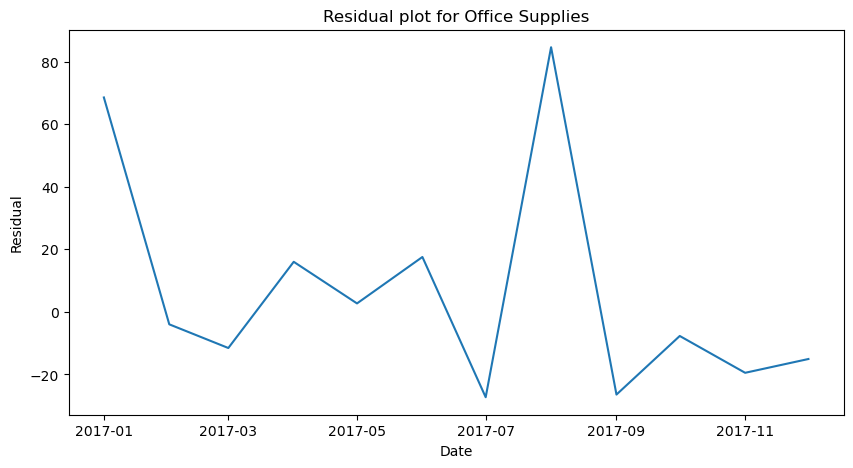

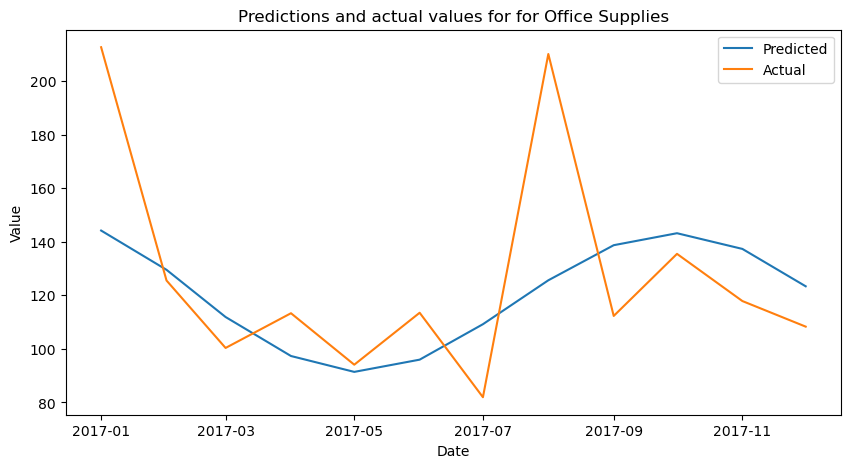

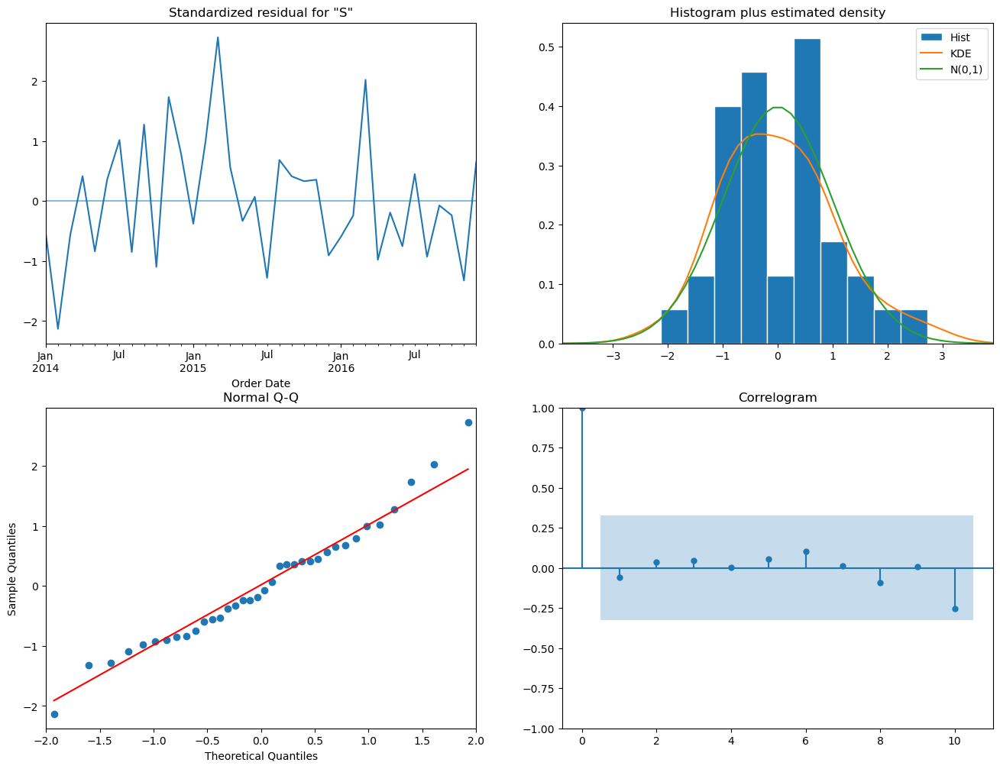

MAPE for Office Supplies Category: 17.71%

RMSE for Office Supplies Category: 34.97




C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   36
Model:                 ARIMA(5, 0, 5)   Log Likelihood                -244.085
Date:                Thu, 23 Feb 2023   AIC                            512.171
Time:                        12:15:46   BIC                            531.173
Sample:                    01-01-2014   HQIC                           518.803
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        465.3888     43.295     10.749      0.000     380.532     550.246
ar.L1         -0.1422      0.328     -0.433      0.665      -0.785       0.501
ar.L2         -0.3921      0.322     -1.218      0.2

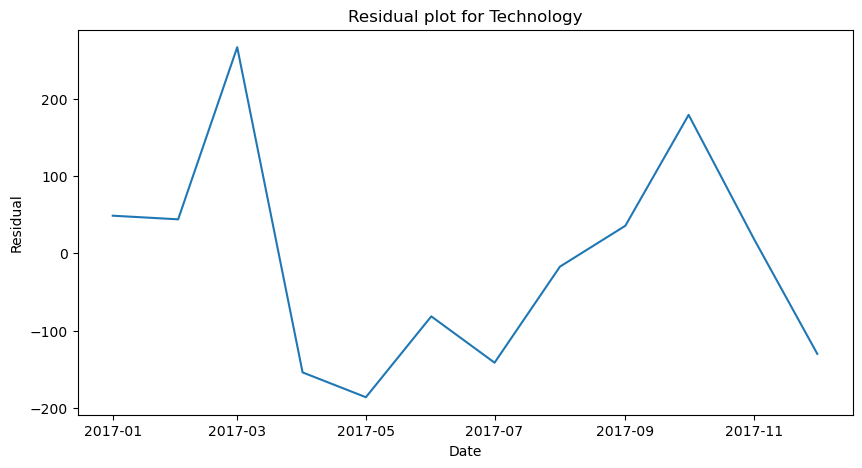

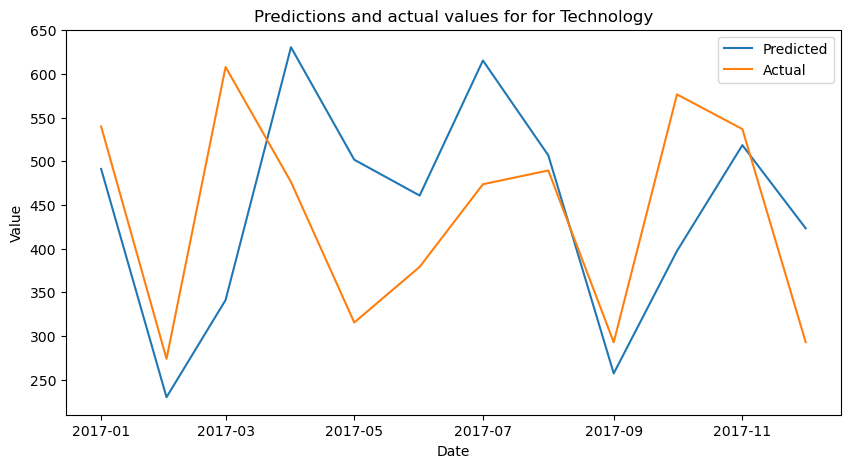

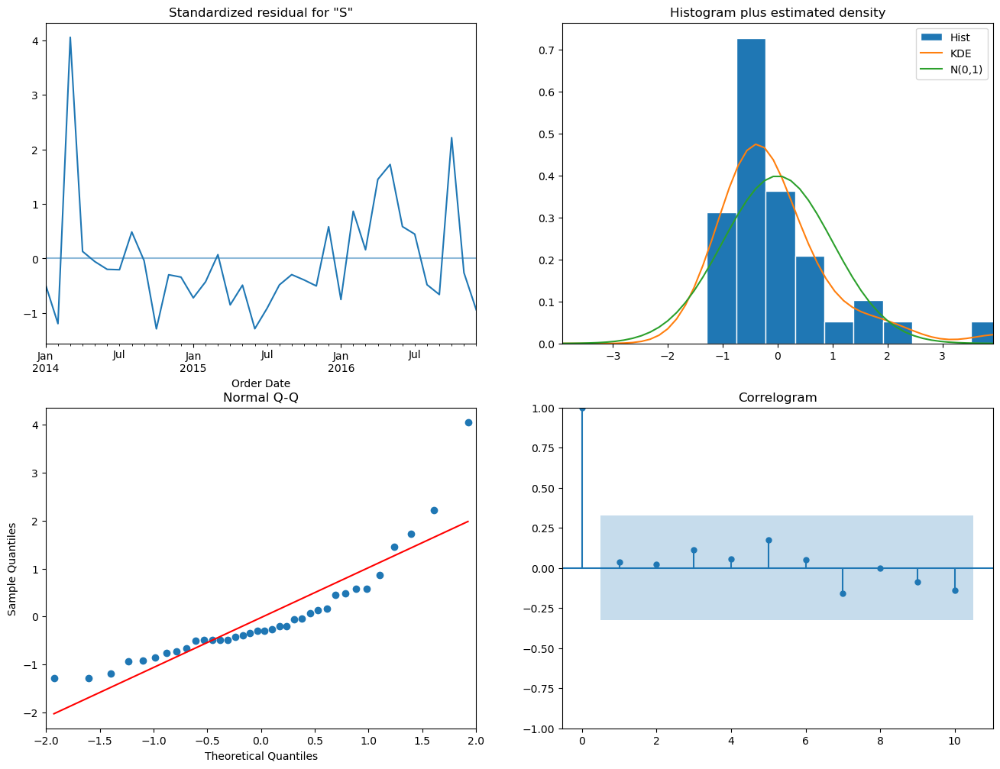

MAPE for Technology Category: 25.52%

RMSE for Technology Category: 132.71




C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   36
Model:                 ARIMA(5, 0, 3)   Log Likelihood                -211.570
Date:                Thu, 23 Feb 2023   AIC                            443.140
Time:                        12:15:51   BIC                            458.975
Sample:                    01-01-2014   HQIC                           448.667
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        361.1212     23.290     15.505      0.000     315.473     406.769
ar.L1          0.7828      9.647      0.081      0.935     -18.126      19.691
ar.L2         -0.4695      9.867     -0.048      0.9

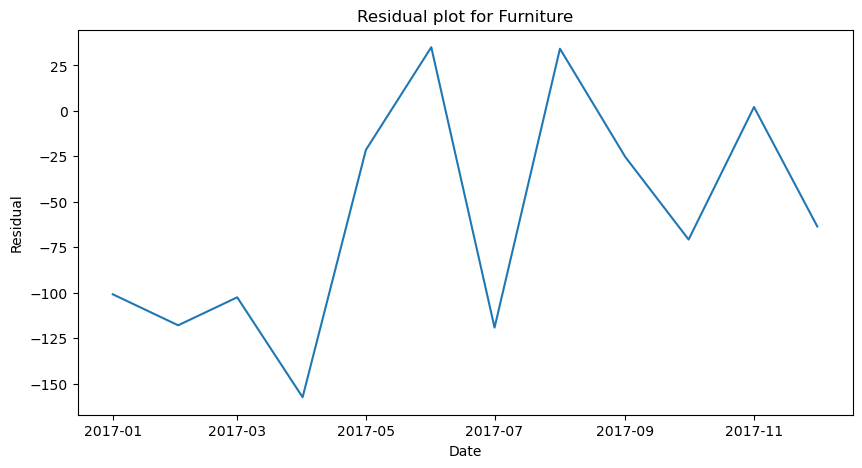

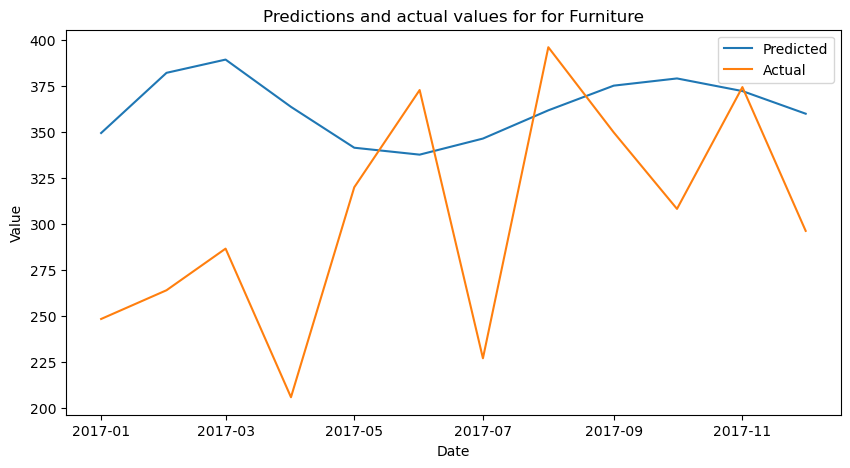

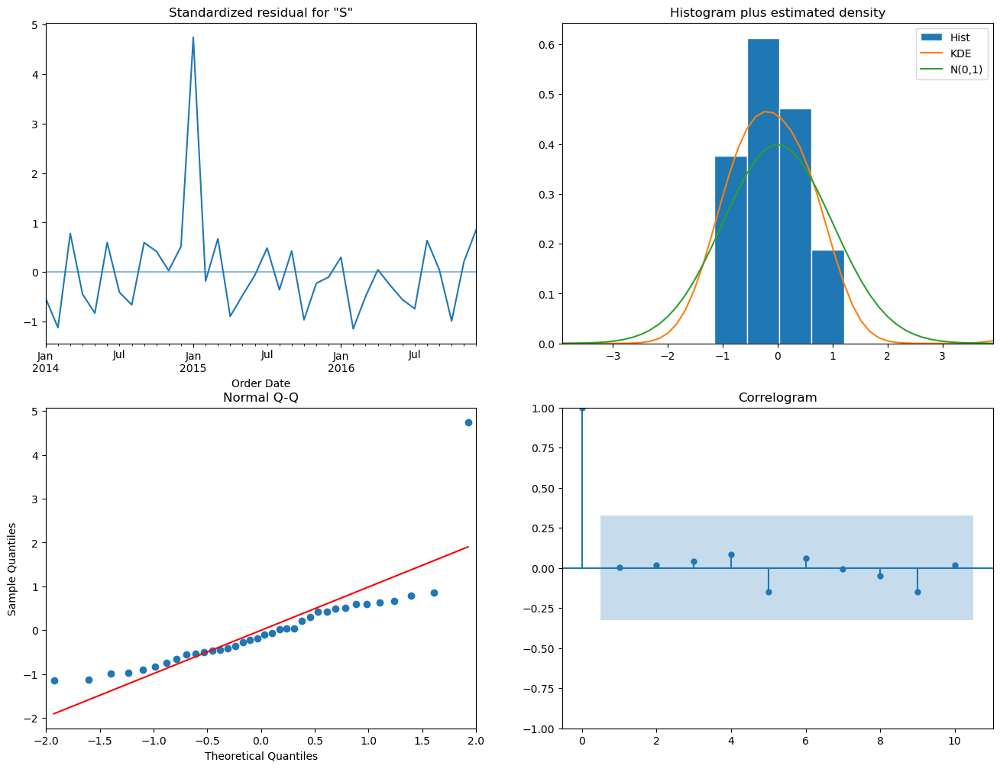

MAPE for Furniture Category: 27.25%

RMSE for Furniture Category: 84.76




In [111]:
# ARMA model

train_data = [train_data_off, train_data_tech, train_data_furn]
test_data = [test_data_off, test_data_tech , test_data_furn]
orders = [(4,0,4),(5,0,5),(5,0,3)]
for data1,data2, name, order in zip(train_data,test_data, categories, orders):
    model = ARIMA(data1, order=order)
    result = model.fit()
    print(result.summary())
    # make predictions on test data
    pred_start_date = data2.index[0]
    pred_end_date = data2.index[-1]
    predictions = result.predict(start=pred_start_date, end=pred_end_date)
    
    #find residuals
    residuals = data2['Sales'] - predictions
    
    # plot
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(residuals.index, residuals)
    ax.set_title(f'Residual plot for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Residual')
    plt.show()
    
     # Plot the predictions and actual values
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(predictions, label='Predicted')
    ax.plot(data2, label='Actual')
    ax.set_title(f'Predictions and actual values for for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')
    ax.legend()
    plt.show()
    
    # plot diagnostics 
    result.plot_diagnostics(figsize=(16,12))
    plt.show()
    
    # Evaluate the ARMA model
    # calculate MAPE and RMSE
    mape = mean_absolute_percentage_error(data2['Sales'], predictions) * 100
    rmse = np.sqrt(mean_squared_error(data2['Sales'], predictions))
    print(f"MAPE for {name} Category: {mape:.2f}%\n")
    print(f"RMSE for {name} Category: {rmse:.2f}\n\n")


Diagnostics ARMA model : 

    1. Office Supplies 
        - Higher residuals are present at certain points in the Residual graph indicating possible outliers. 
        - There is slight right skewness in the distribution.
        - Q-Q plot shows some points at the beginning and end away from the straight line, indicating deviation from normality.
        - Correlogram shows all the correlation values below the confidence interval(shaded blue part). The maximum correlation is at lag 10.
        
    2. Technology
        - Very high residuals present in the Standardized residual graph at the beginning of the time series.
        - Slightly right skewed distribution.
        - Most of the points are away from the normality.
        - No significant correlation.
        
    3. Furniture
        - Very high residuals shown at the end of 2014.
        - Distribution is close to normal.
        - Q-Q plot shows that majority of the points form a normal distribution.
        - No significant autocorrelation.

#### ARIMA Model

C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   36
Model:                 ARIMA(4, 1, 4)   Log Likelihood                -176.531
Date:                Thu, 23 Feb 2023   AIC                            371.063
Time:                        12:15:57   BIC                            385.061
Sample:                    01-01-2014   HQIC                           375.895
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4441      0.355     -1.252      0.210      -1.139       0.251
ar.L2         -0.4258      0.375     -1.134      0.257      -1.162       0.310
ar.L3         -0.5918      0.342     -1.732      0.0

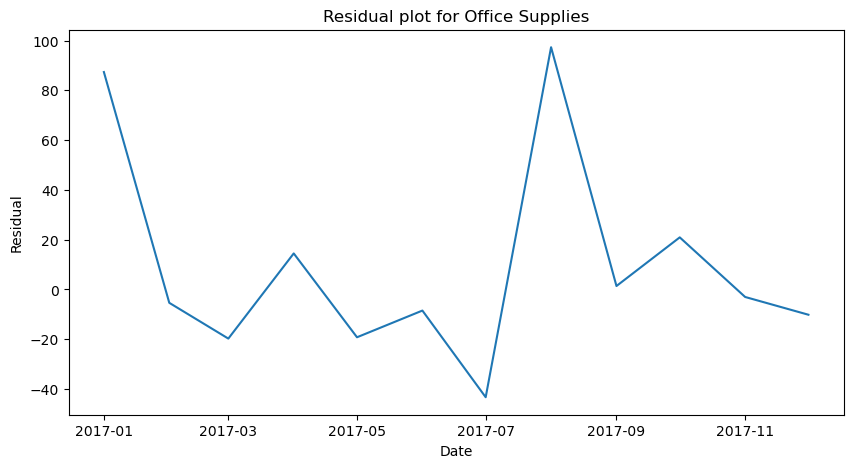

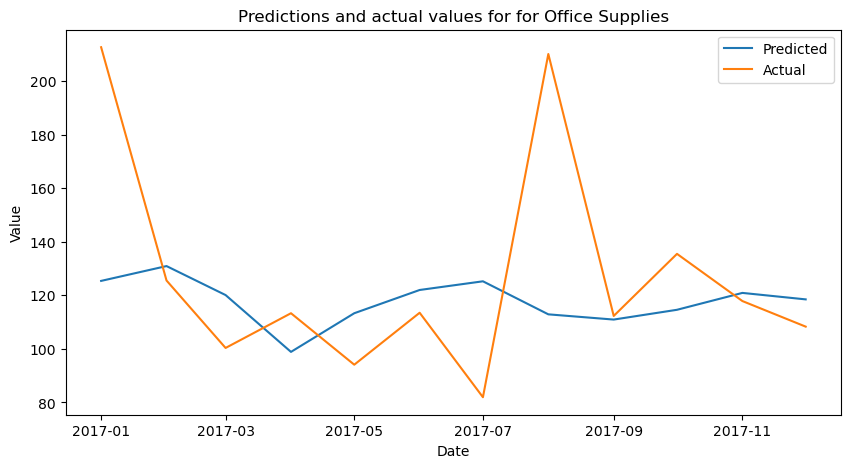

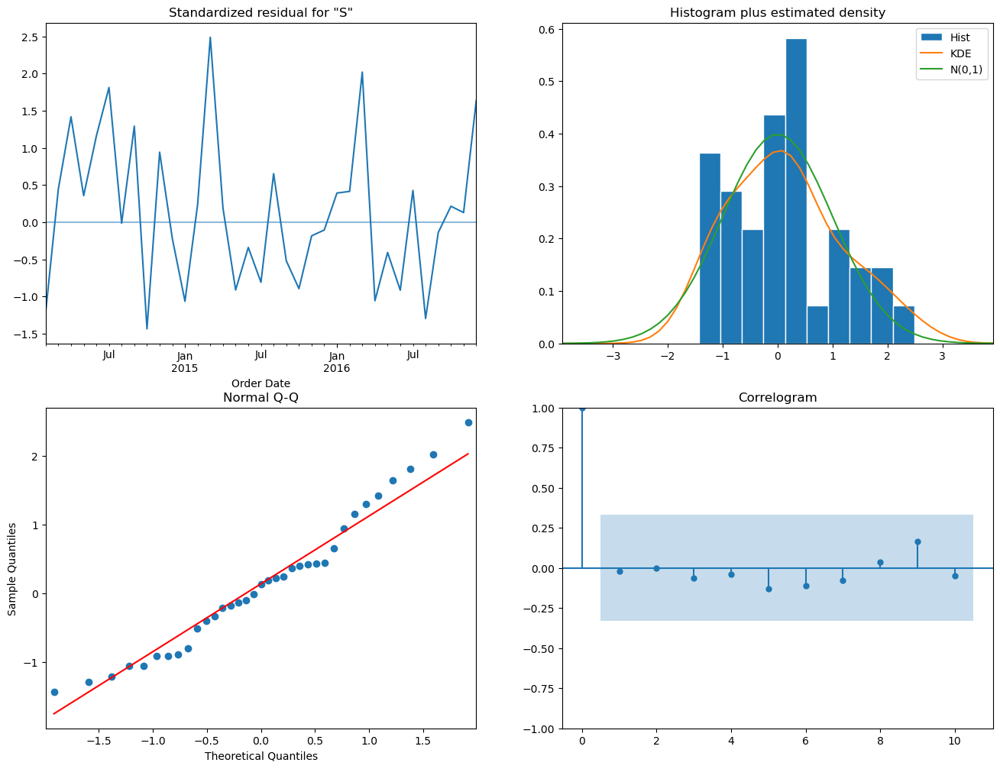

MAPE for Office Supplies Category: 19.46%

RMSE for Office Supplies Category: 41.43




C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   36
Model:                 ARIMA(5, 1, 5)   Log Likelihood                -239.631
Date:                Thu, 23 Feb 2023   AIC                            501.261
Time:                        12:15:59   BIC                            518.370
Sample:                    01-01-2014   HQIC                           507.167
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6941      0.472     -1.472      0.141      -1.618       0.230
ar.L2          0.3482      0.368      0.946      0.344      -0.374       1.070
ar.L3         -0.3310      0.365     -0.906      0.3

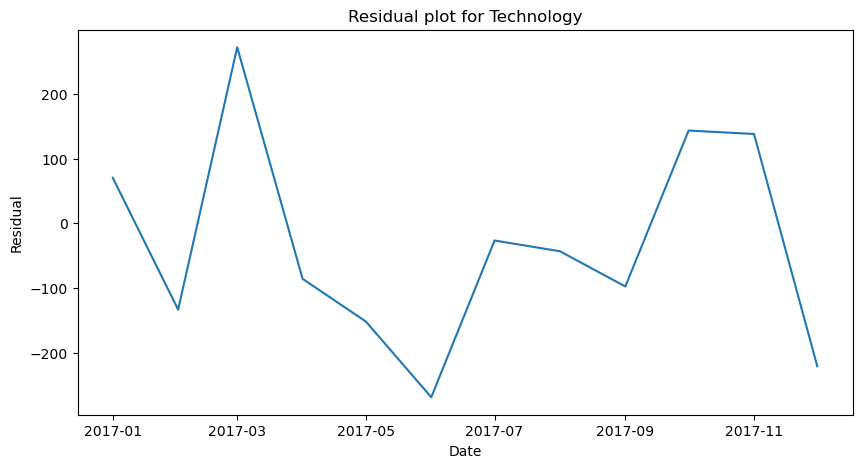

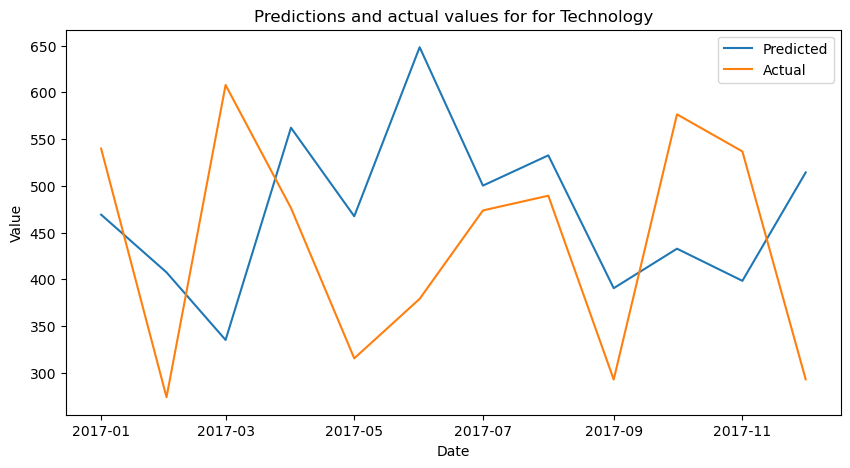

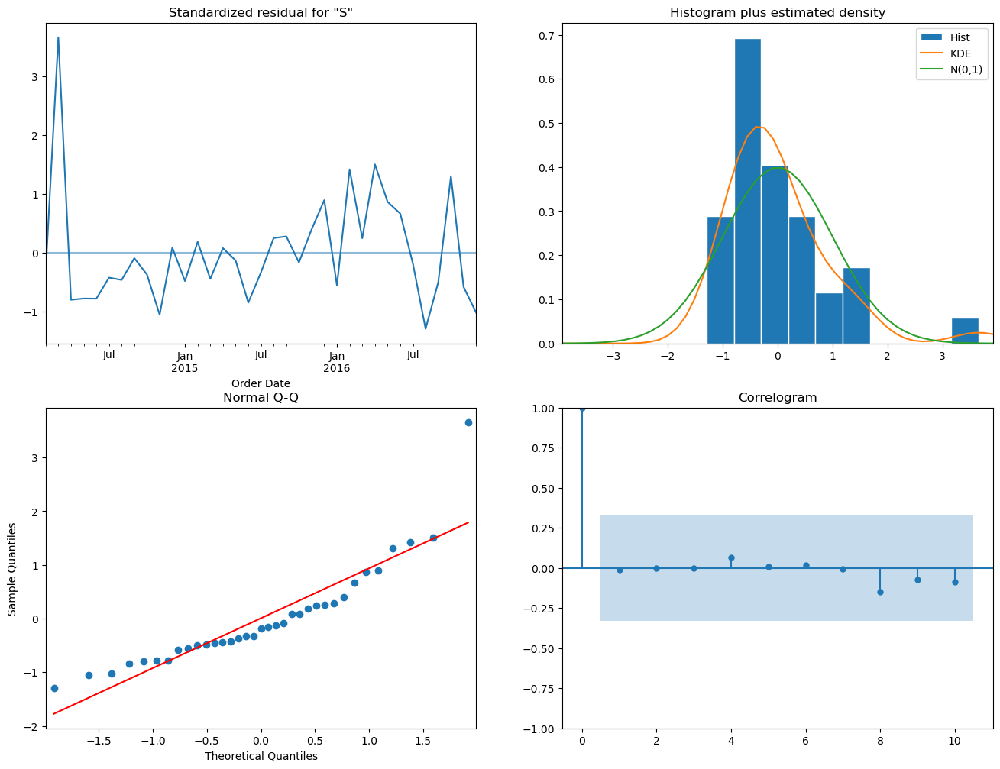

MAPE for Technology Category: 34.81%

RMSE for Technology Category: 158.32




C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   36
Model:                 ARIMA(5, 1, 3)   Log Likelihood                -208.200
Date:                Thu, 23 Feb 2023   AIC                            434.400
Time:                        12:16:01   BIC                            448.399
Sample:                    01-01-2014   HQIC                           439.233
                         - 12-01-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0225      0.454      2.254      0.024       0.133       1.912
ar.L2         -0.6889      0.615     -1.121      0.262      -1.893       0.516
ar.L3          0.0009      0.527      0.002      0.9

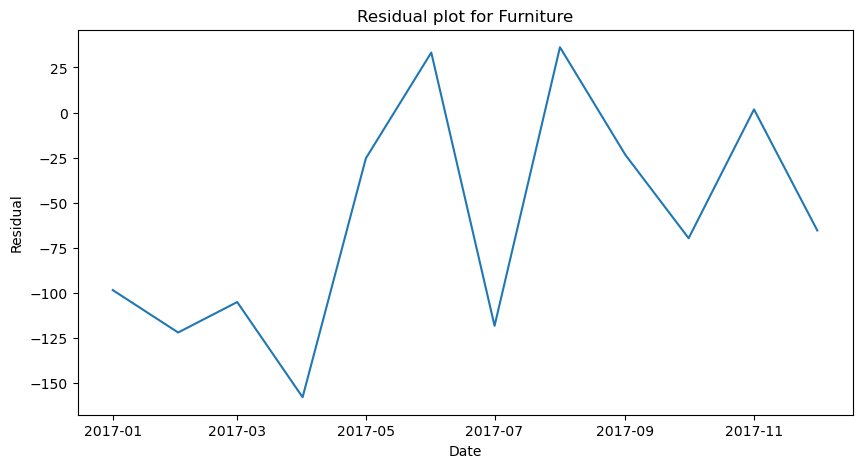

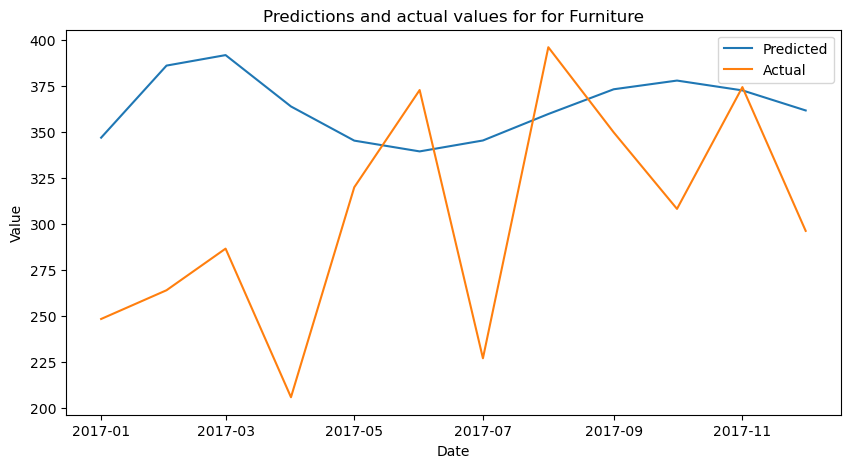

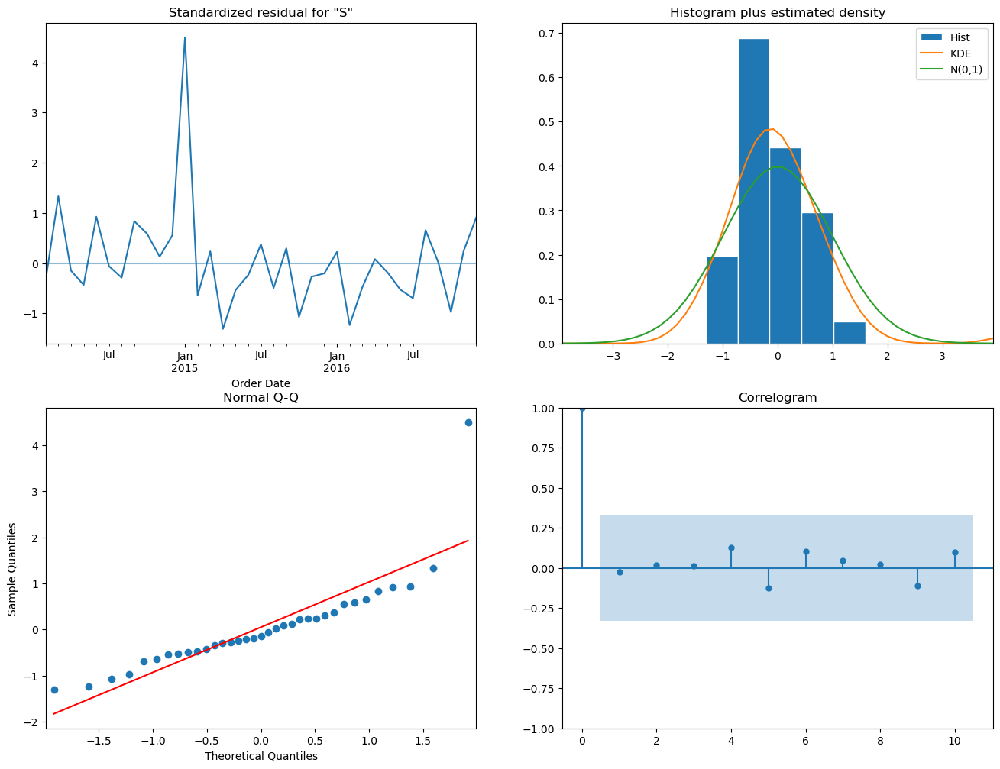

MAPE for Furniture Category: 27.40%

RMSE for Furniture Category: 85.22




In [112]:
train_data = [train_data_off, train_data_tech, train_data_furn]
test_data = [test_data_off, test_data_tech , test_data_furn]
orders = [(4,1,4),(5,1,5),(5,1,3)]
for data1,data2, name, order in zip(train_data,test_data, categories, orders):
    model = ARIMA(data1, order=order)
    result = model.fit()
    print(result.summary())
    # make predictions on test data
    pred_start_date = data2.index[0]
    pred_end_date = data2.index[-1]
    predictions = result.predict(start=pred_start_date, end=pred_end_date)
    
    #find residuals
    residuals = data2['Sales'] - predictions
    
    # plot
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(residuals.index, residuals)
    ax.set_title(f'Residual plot for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Residual')
    plt.show()
    
     # Plot the predictions and actual values
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(predictions, label='Predicted')
    ax.plot(data2, label='Actual')
    ax.set_title(f'Predictions and actual values for for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')
    ax.legend()
    plt.show()
    
    # plot diagnostics 
    result.plot_diagnostics(figsize=(16,12))
    plt.show()
    
    # Evaluate the ARIMA model
    # calculate MAPE and RMSE
    mape = mean_absolute_percentage_error(data2['Sales'], predictions) * 100
    rmse = np.sqrt(mean_squared_error(data2['Sales'], predictions))
    print(f"MAPE for {name} Category: {mape:.2f}%\n")
    print(f"RMSE for {name} Category: {rmse:.2f}\n\n")

ARIMA model is performing better for Office Supplies and Furniture.

Diagnostics ARIMA model : 

    1. Office Supplies 
        - Higher residuals are present at many points in the Residual graph indicating possible outliers. 
        - There is almost normal distribution.
        - Q-Q plot shows that some points at the beginning and end are away from the straight line, indicating slight deviation from normality.
        - Correlogram shows all the correlation values below the confidence interval(shaded blue part).
        
    2. Technology
        - Very high residuals present in the Standardized residual graph at the beginning of the time series.
        - Slightly right skewed distribution.
        - Most of the points are away from the normality.
        - No significant correlation.
        
    3. Furniture
        - Very high residuals shown at the end of 2014.
        - Distribution is close to normal.
        - Q-Q plot shows that majority of the points in the middle form a normal distribution.
        - No significant autocorrelation.

#### SARIMA Model

In [113]:
# perform grid search to find the optimum parameter value 
import itertools

from statsmodels.tsa.statespace.sarimax import SARIMAX

# Define the range of p, d, and q values
p = d = q = range(0, 2)

# Generate all possible combinations of p, d, and q
pdq = list(itertools.product(p, d, q))

# Generate all possible combinations of seasonal p, d, and q
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

# Define a function to fit the SARIMAX model with the given parameters and return the AIC score
def sarimax_aic(y, order, seasonal_order):
    model =SARIMAX(y, order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit()
    return results.aic

# Perform grid search and find the best model for each category
for category, train_data in [('Office Supplies', train_data_off), ('Technology', train_data_tech), ('Furniture', train_data_furn)]:
    best_aic = float("inf")
    best_params = None
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                current_aic = sarimax_aic(train_data, param, param_seasonal)
                if current_aic < best_aic:
                    best_aic = current_aic
                    best_params = (param, param_seasonal)
            except:
                continue

    # Print the best model's AIC score and parameters
    print("Best AIC for category", category, ": ", best_aic)
    print("Best Params for category", category, ": ", best_params)

C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Best AIC for category Office Supplies :  100.07003252783949
Best Params for category Office Supplies :  ((0, 1, 1), (0, 1, 1, 12))
Best AIC for category Technology :  135.1394938650745
Best Params for category Technology :  ((0, 1, 1), (0, 1, 1, 12))


C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Best AIC for category Furniture :  113.07242701646577
Best Params for category Furniture :  ((0, 1, 1), (0, 1, 1, 12))


                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                   36
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -125.965
Date:                            Thu, 23 Feb 2023   AIC                            257.929
Time:                                    12:16:29   BIC                            261.336
Sample:                                01-01-2014   HQIC                           258.786
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9992     44.625     -0.022      0.982     -88.462      86.463
ma.S.L12      -0.1660      0.612   

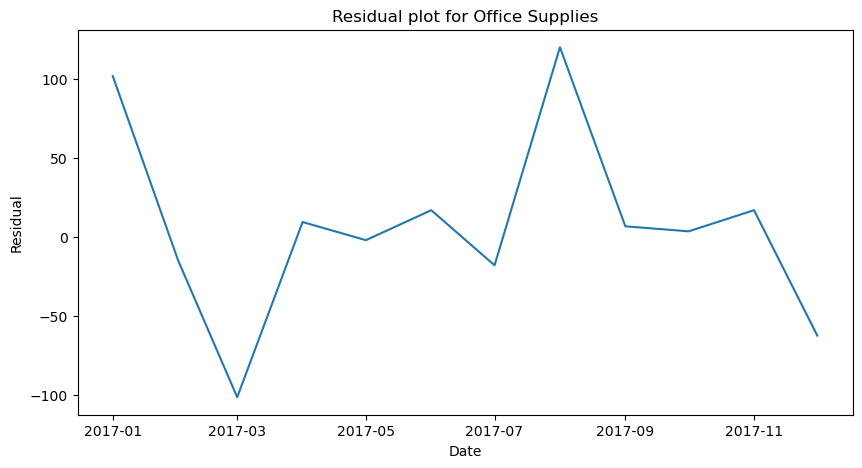

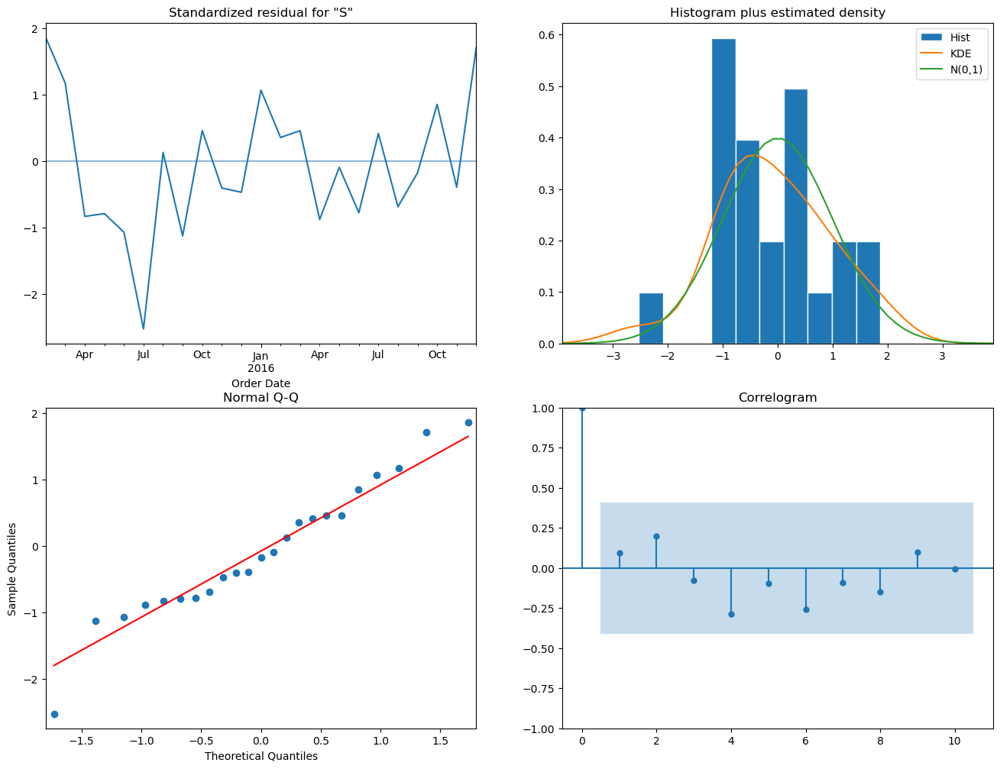

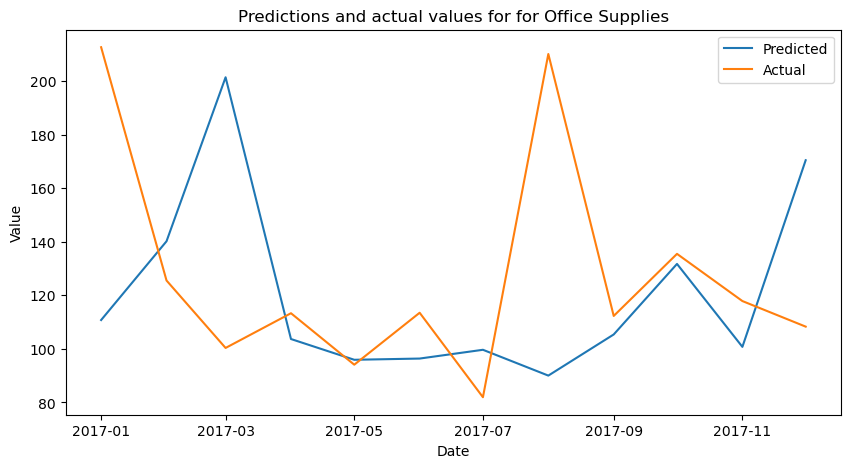

MAPE for Office Supplies Category: 28.80%

RMSE for Office Supplies Category: 57.89


                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                   36
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -167.276
Date:                            Thu, 23 Feb 2023   AIC                            340.552
Time:                                    12:16:32   BIC                            343.959
Sample:                                01-01-2014   HQIC                           341.409
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9979     13

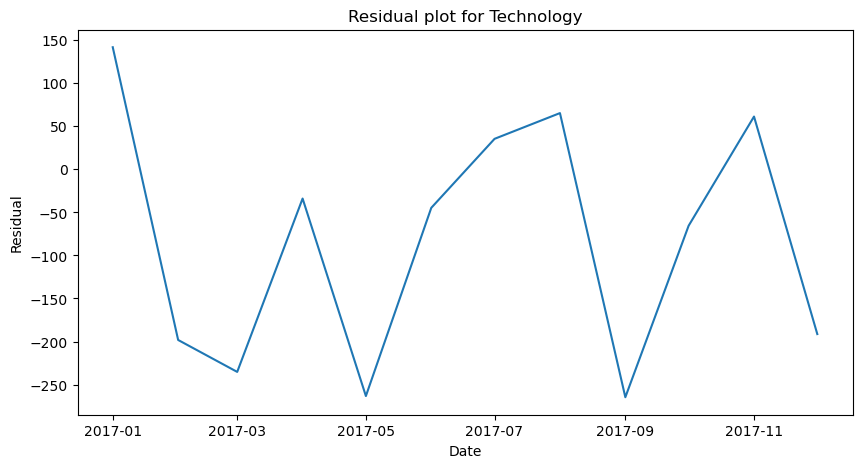

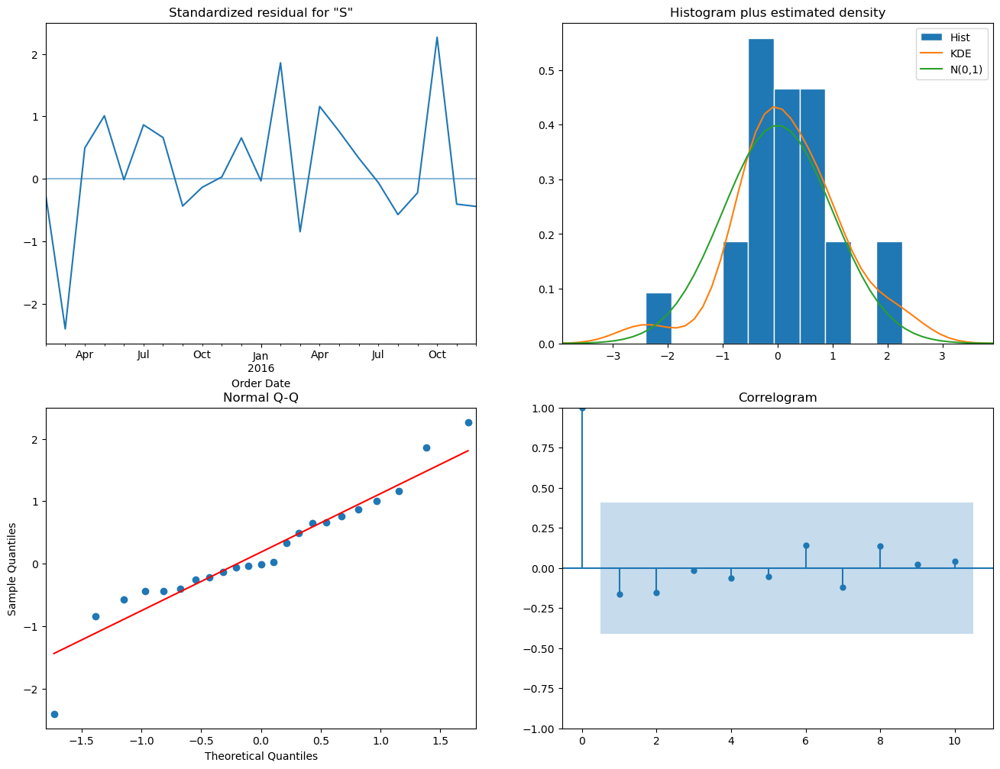

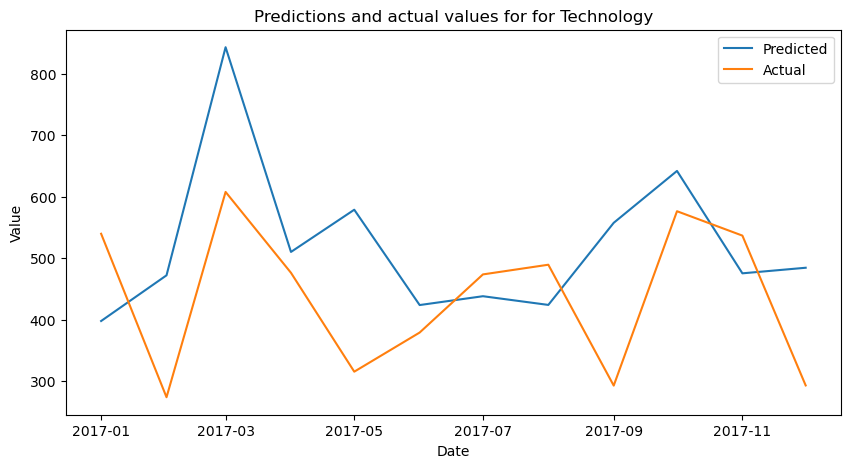

MAPE for Technology Category: 36.59%

RMSE for Technology Category: 160.10


                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                   36
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                -144.976
Date:                            Thu, 23 Feb 2023   AIC                            295.953
Time:                                    12:16:35   BIC                            299.359
Sample:                                01-01-2014   HQIC                           296.809
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8375      0.303     

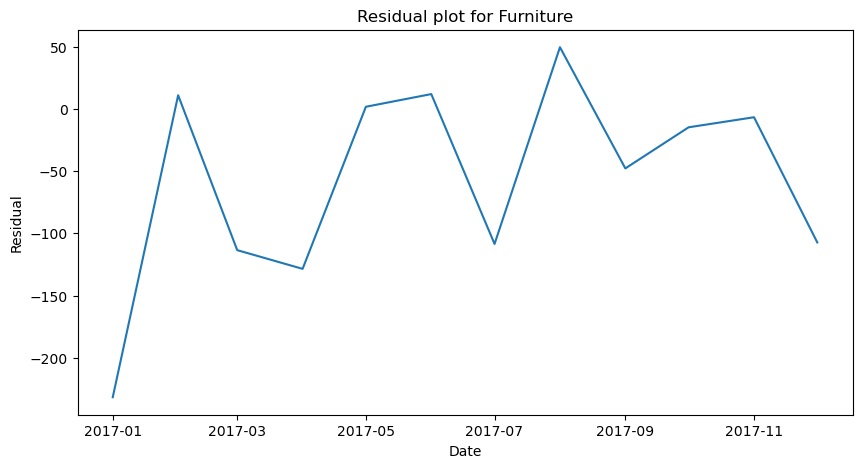

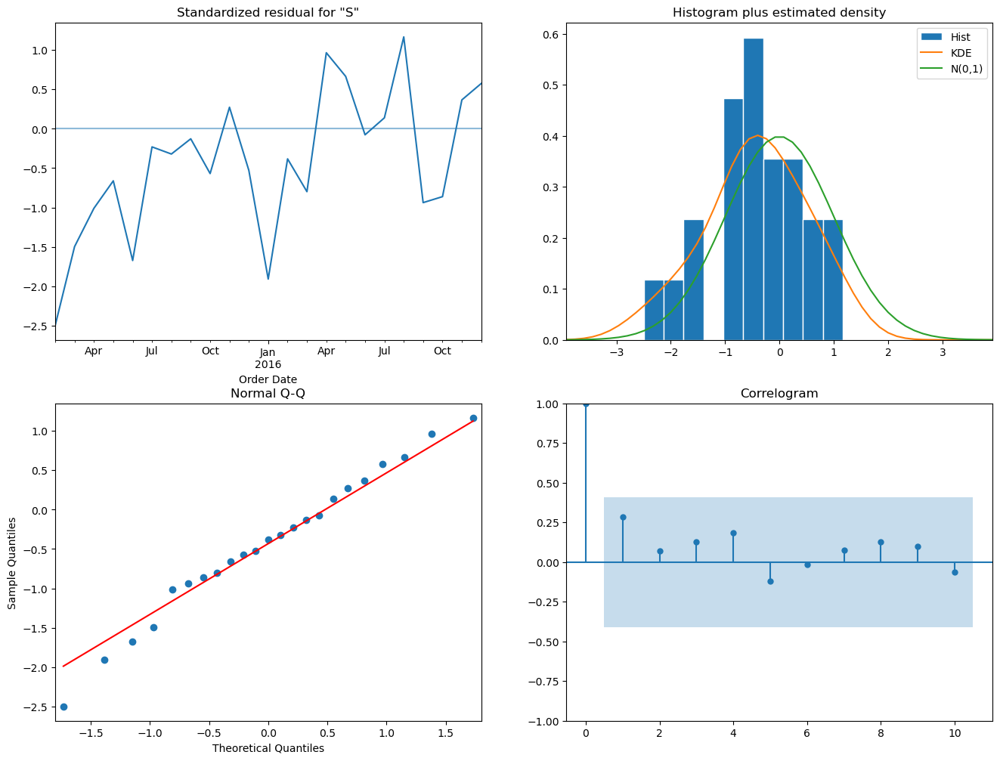

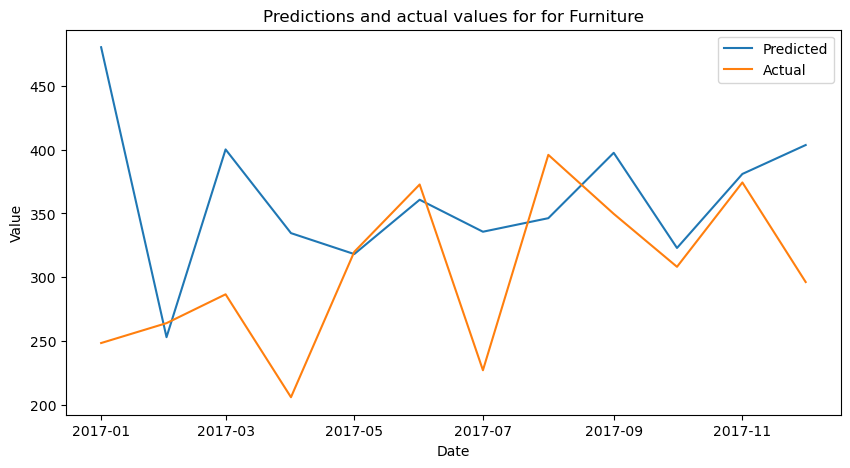

MAPE for Furniture Category: 26.66%

RMSE for Furniture Category: 96.48




In [114]:
# create model using optimum values from above
from statsmodels.tsa.statespace.sarimax import SARIMAX


train_data = [train_data_off, train_data_tech, train_data_furn]
test_data = [test_data_off, test_data_tech , test_data_furn]
orders = [(0,1,1),(0,1,1),(0,1,1)]



for data1,data2, name, order in zip(train_data,test_data, categories, orders):
    model = SARIMAX(data1, order=order,seasonal_order=(0,1,1,12))
    result = model.fit()
    print(result.summary())
    # make predictions on test data
    pred_start_date = data2.index[0]
    pred_end_date = data2.index[-1]
    predictions = result.predict(start=pred_start_date, end=pred_end_date)
    
    #find residuals
    residuals = data2['Sales'] - predictions
    
    # plot
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(residuals.index, residuals)
    ax.set_title(f'Residual plot for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Residual')
    plt.show()
    
    result.plot_diagnostics(figsize=(16, 12))
    plt.show()
    
     # Plot the predictions and actual values
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(predictions, label='Predicted')
    ax.plot(data2, label='Actual')
    ax.set_title(f'Predictions and actual values for for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')
    ax.legend()
    plt.show()
    
    # Evaluate the SARIMA model
    # calculate MAPE and RMSE
    mape = mean_absolute_percentage_error(data2['Sales'], predictions) * 100
    rmse = np.sqrt(mean_squared_error(data2['Sales'], predictions))
    print(f"MAPE for {name} Category: {mape:.2f}%\n")
    print(f"RMSE for {name} Category: {rmse:.2f}\n\n")

Diagnostics SARIMA model: 

    1. Office Supplies 
        - Higher residuals are present at  in the Residual graph indicating possible outliers. 
        - There is slight right skewness in the distribution.
        - Q-Q plot shows some points away from the straight line, indicating deviation from normality.
        - Correlogram shows all the correlation values below the confidence interval(shaded blue part).
        
    2. Technology
        - Very high residuals present in the Standardized residual graph at the beginning of the time series.
        - Slightly left skewed distribution with slight peak on left.
        - At the beginning and end of time series the points are away from the normality, while at the middle time period, the points are normal.
        - No significant correlation.
        
    3. Furniture
        - Very high residuals shown in the graph.
        - Dsitribution is slightly left skewed.
        - Q-Q plot shows that majority of the points form a normal distribution.
        - No significant autocorrelation.

#### Exponential Smoothing Model

                       ExponentialSmoothing Model Results                       
Dep. Variable:                    Sales   No. Observations:                   36
Model:             ExponentialSmoothing   SSE                          40854.681
Optimized:                         True   AIC                            281.233
Trend:                             None   BIC                            303.403
Seasonal:                      Additive   AICC                           309.865
Seasonal Periods:                    12   Date:                 Thu, 23 Feb 2023
Box-Cox:                          False   Time:                         12:16:39
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level              1.4901e-08                alpha                 True
smoothing_seasonal       

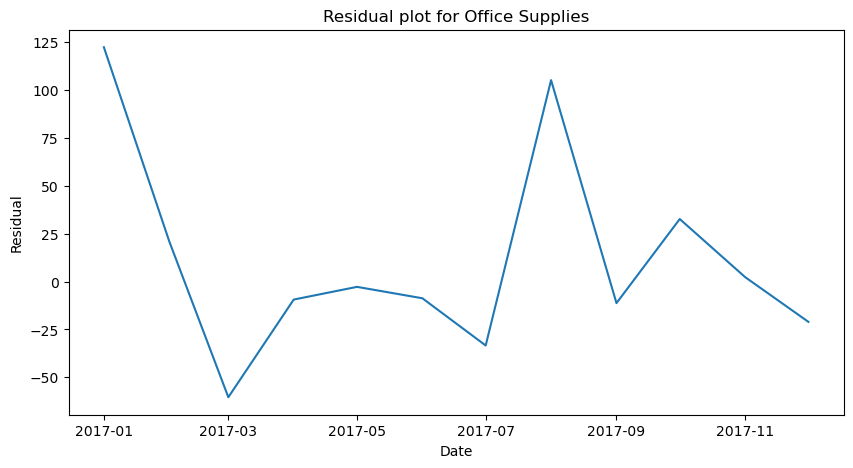

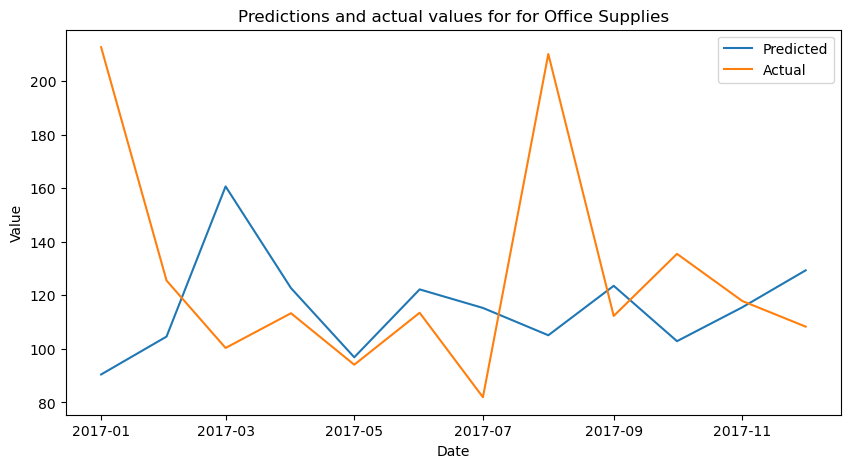

MAPE for Office Supplies Category: 24.96%

RMSE for Office Supplies Category: 52.45


                       ExponentialSmoothing Model Results                       
Dep. Variable:                    Sales   No. Observations:                   36
Model:             ExponentialSmoothing   SSE                        1859361.116
Optimized:                         True   AIC                            418.680
Trend:                             None   BIC                            440.849
Seasonal:                      Additive   AICC                           447.312
Seasonal Periods:                    12   Date:                 Thu, 23 Feb 2023
Box-Cox:                          False   Time:                         12:16:41
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level      

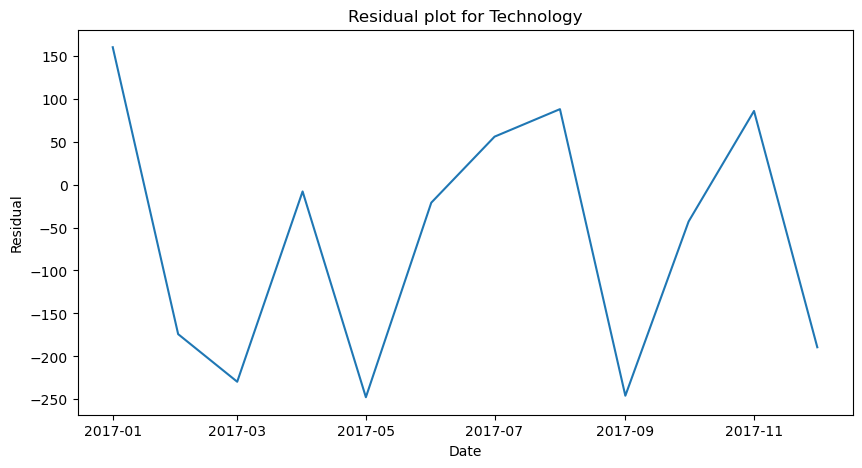

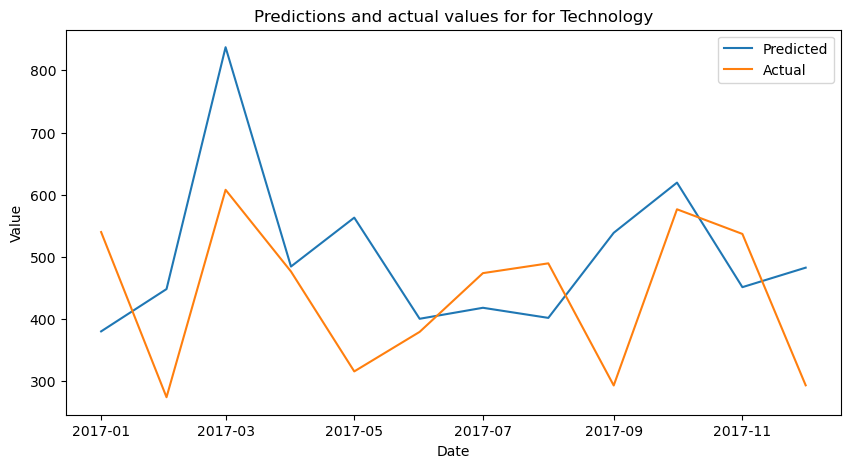

MAPE for Technology Category: 34.85%

RMSE for Technology Category: 154.51


                       ExponentialSmoothing Model Results                       
Dep. Variable:                    Sales   No. Observations:                   36
Model:             ExponentialSmoothing   SSE                         227494.818
Optimized:                         True   AIC                            343.049
Trend:                             None   BIC                            365.218
Seasonal:                      Additive   AICC                           371.681
Seasonal Periods:                    12   Date:                 Thu, 23 Feb 2023
Box-Cox:                          False   Time:                         12:16:42
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               

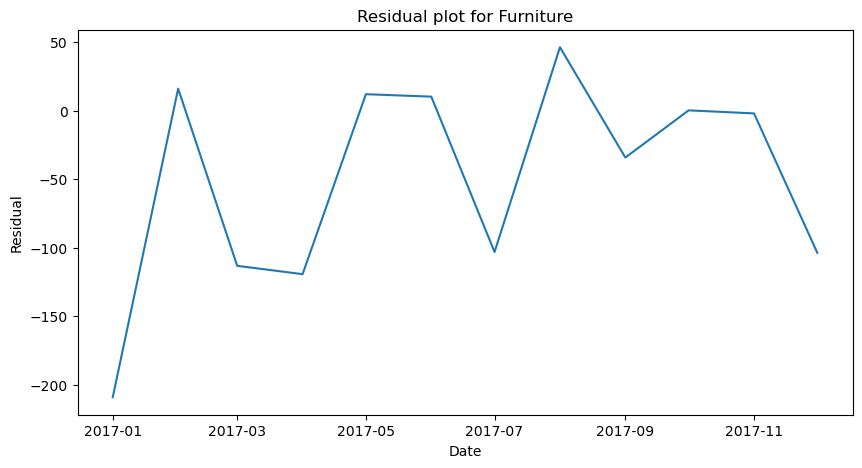

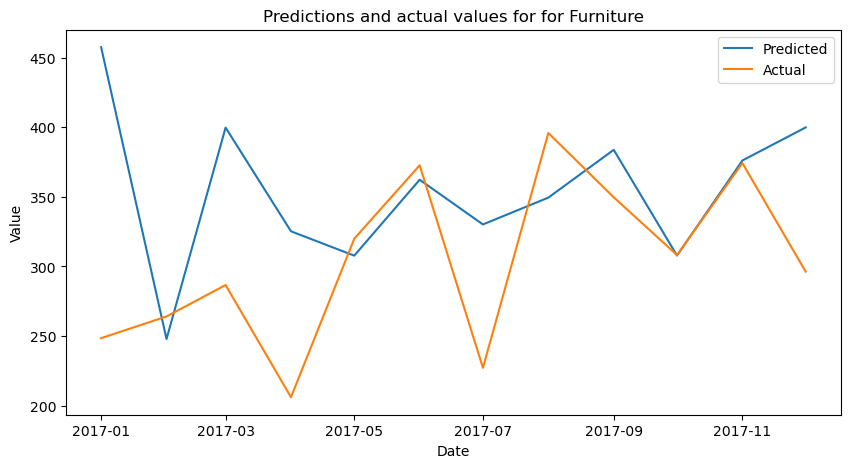

MAPE for Furniture Category: 24.72%

RMSE for Furniture Category: 89.42




In [115]:

from statsmodels.tsa.holtwinters import ExponentialSmoothing


train_data = [train_data_off, train_data_tech, train_data_furn]
test_data = [test_data_off, test_data_tech , test_data_furn]

for data1,data2, name in zip(train_data,test_data, categories):
    model = ExponentialSmoothing(data1 , seasonal='add',seasonal_periods=12)
    result = model.fit()
    print(result.summary())
    # make predictions on test data
    pred_start_date = data2.index[0]
    pred_end_date = data2.index[-1]
    predictions = result.predict(start=pred_start_date, end=pred_end_date)
    #find residuals
    residuals = data2['Sales'] - predictions
    
    # plot
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(residuals.index, residuals)
    ax.set_title(f'Residual plot for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Residual')
    plt.show()
     
     # Plot the predictions and actual values
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(predictions, label='Predicted')
    ax.plot(data2, label='Actual')
    ax.set_title(f'Predictions and actual values for for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')
    ax.legend()
    plt.show()
    
    # Evaluate the ExpSmoothing model
    # calculate MAPE and RMSE
    mape = mean_absolute_percentage_error(data2['Sales'], predictions) * 100
    rmse = np.sqrt(mean_squared_error(data2['Sales'], predictions))
    print(f"MAPE for {name} Category: {mape:.2f}%\n")
    print(f"RMSE for {name} Category: {rmse:.2f}\n\n")

Exponential Smoothing Model is performing better for Office Supplies and Furniture Category.

#### Exponential Smoothing Model for Weekly Data

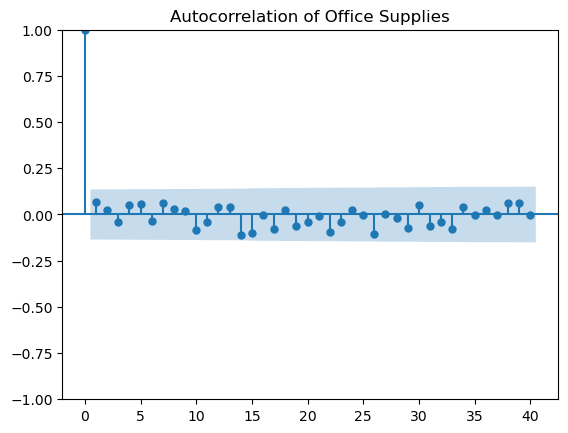

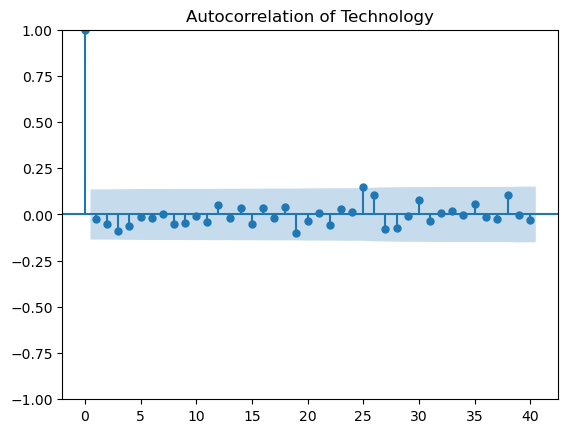

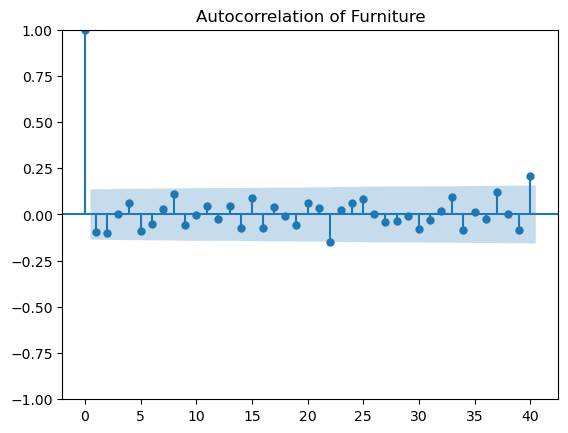

In [116]:
## ACF and PACF

# find ACF
def find_acf(df,name):
    acf_plot = plot_acf(df.Sales, lags= 40)
    plt.title(f"Autocorrelation of {name}")  

# ACF for all three product categories
dfs = [officesupp_weekly, tech_weekly, furniture_weekly]
categories = ['Office Supplies', 'Technology', 'Furniture']
for df,name in zip(dfs, categories):
    find_acf(df, name)


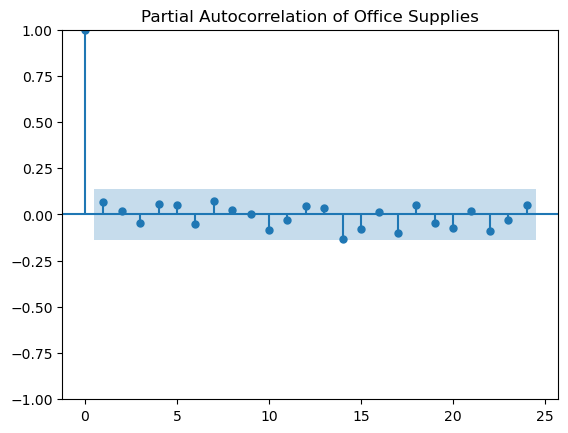

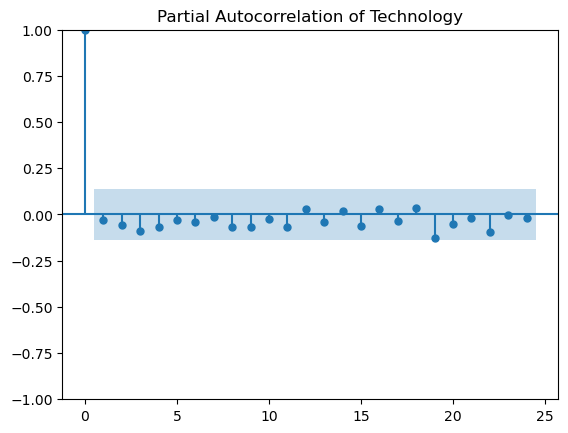

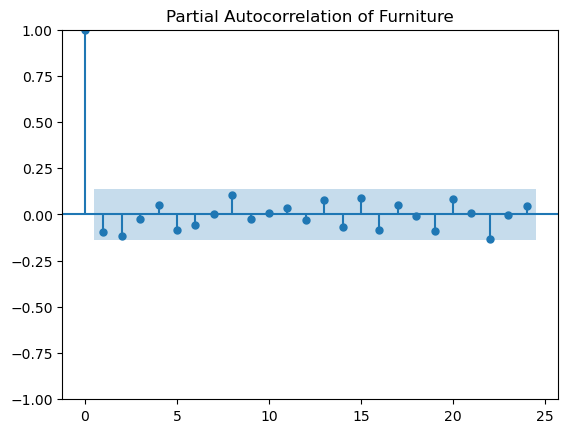

In [117]:

# find PACF
def find_pacf(df,name):
    pacf_plot = plot_pacf(df.Sales)
    plt.title(f"Partial Autocorrelation of {name}")  

# PACF for all three product categories
dfs = [officesupp_weekly, tech_weekly, furniture_weekly]
categories = ['Office Supplies', 'Technology', 'Furniture']
for df,name in zip(dfs, categories):
    find_pacf(df, name)

In [118]:
# split data into testing and training

split_date= pd.to_datetime('2016-12-01')
train_week_off = officesupp_weekly.loc[officesupp_weekly.index <= split_date]
test_week_off  = officesupp_weekly.loc[officesupp_weekly.index > split_date]
train_week_tech = tech_weekly.loc[tech_weekly.index <= split_date]
test_week_tech  = tech_weekly.loc[tech_weekly.index > split_date]
train_week_furn = furniture_weekly.loc[furniture_weekly.index <= split_date]
test_week_furn = furniture_weekly.loc[furniture_weekly.index > split_date]

                       ExponentialSmoothing Model Results                       
Dep. Variable:                    Sales   No. Observations:                  152
Model:             ExponentialSmoothing   SSE                         959988.922
Optimized:                         True   AIC                           1438.121
Trend:                             None   BIC                           1601.411
Seasonal:                      Additive   AICC                          1505.321
Seasonal Periods:                    52   Date:                 Thu, 23 Feb 2023
Box-Cox:                          False   Time:                         12:16:47
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.2321699                alpha                 True
smoothing_seasonal       

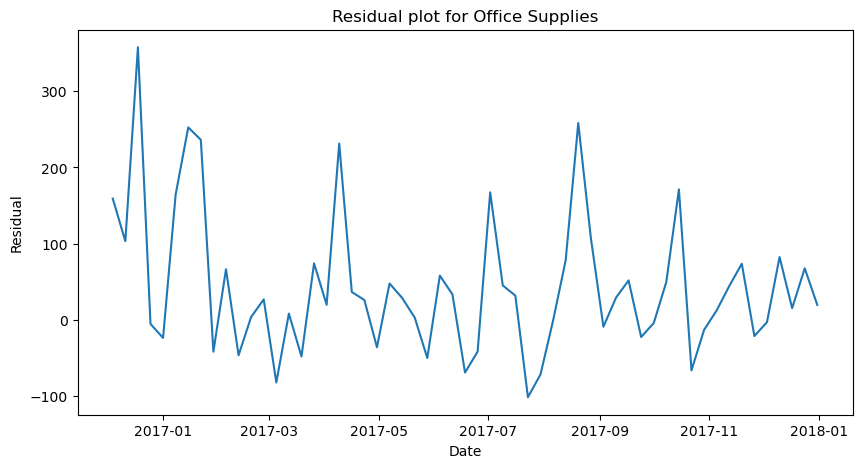

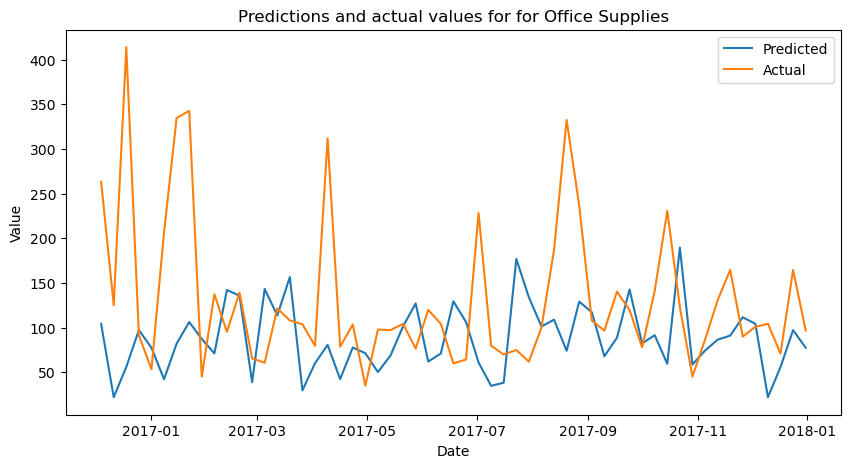

MAPE for Office Supplies Category: 49.97%

RMSE for Office Supplies Category: 102.62


                       ExponentialSmoothing Model Results                       
Dep. Variable:                    Sales   No. Observations:                  151
Model:             ExponentialSmoothing   SSE                       31297049.897
Optimized:                         True   AIC                           1956.505
Trend:                             None   BIC                           2119.438
Seasonal:                      Additive   AICC                          2024.420
Seasonal Periods:                    52   Date:                 Thu, 23 Feb 2023
Box-Cox:                          False   Time:                         12:16:48
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level     

C:\Users\JINCY\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


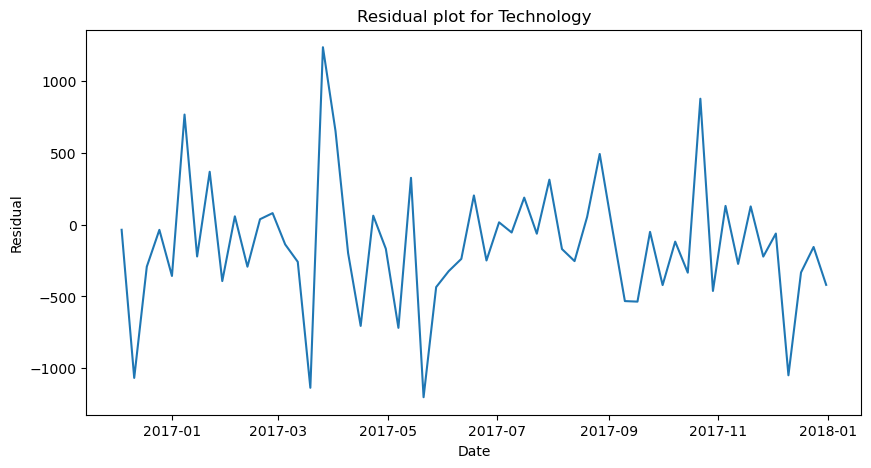

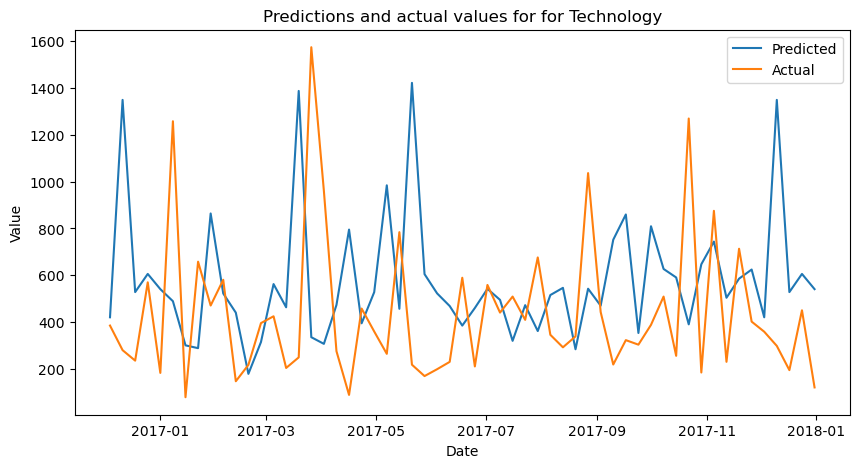

MAPE for Technology Category: 124.57%

RMSE for Technology Category: 472.51


                       ExponentialSmoothing Model Results                       
Dep. Variable:                    Sales   No. Observations:                  151
Model:             ExponentialSmoothing   SSE                        5082053.243
Optimized:                         True   AIC                           1682.016
Trend:                             None   BIC                           1844.949
Seasonal:                      Additive   AICC                          1749.931
Seasonal Periods:                    52   Date:                 Thu, 23 Feb 2023
Box-Cox:                          False   Time:                         12:16:48
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level              

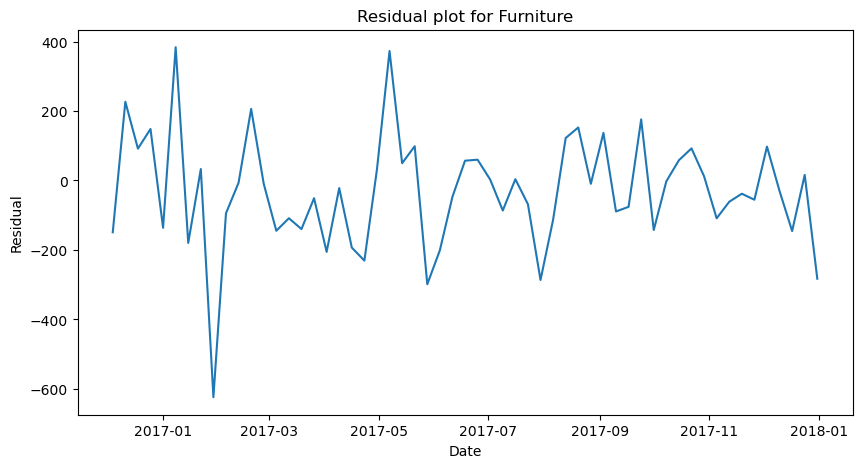

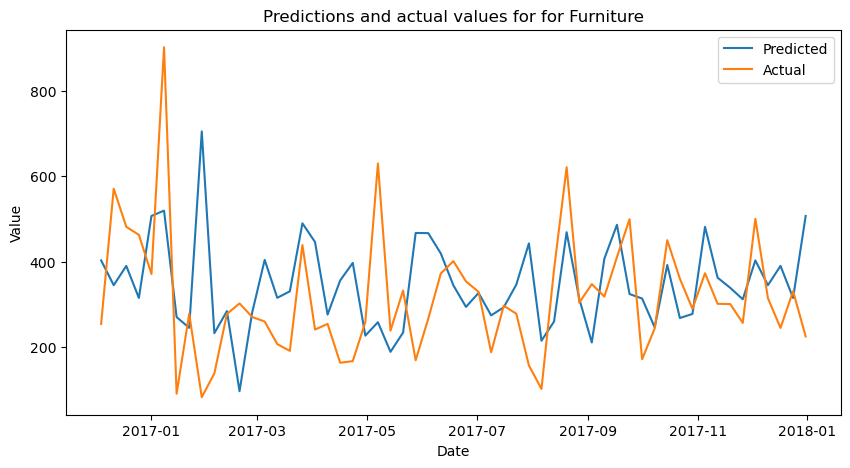

MAPE for Furniture Category: 57.77%

RMSE for Furniture Category: 167.34




In [119]:

train_data = [train_week_off, train_week_tech, train_week_furn]
test_data = [test_week_off, test_week_tech , test_week_furn]

for data1,data2, name in zip(train_data,test_data, categories):
    model = ExponentialSmoothing(data1 , seasonal='add',seasonal_periods=52)
    result = model.fit()
    print(result.summary())
    # make predictions on test data
    pred_start_date = data2.index[0]
    pred_end_date = data2.index[-1]
    predictions = result.predict(start=pred_start_date, end=pred_end_date)
    #find residuals
    residuals = data2['Sales'] - predictions
    
    # plot
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(residuals.index, residuals)
    ax.set_title(f'Residual plot for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Residual')
    plt.show()
    
     # Plot the predictions and actual values
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(predictions, label='Predicted')
    ax.plot(data2, label='Actual')
    ax.set_title(f'Predictions and actual values for for {name}' )
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')
    ax.legend()
    plt.show()
    
    # Evaluate the ExpSmoothing model
    # calculate MAPE and RMSE
    mape = mean_absolute_percentage_error(data2['Sales'], predictions) * 100
    rmse = np.sqrt(mean_squared_error(data2['Sales'], predictions))
    print(f"MAPE for {name} Category: {mape:.2f}%\n")
    print(f"RMSE for {name} Category: {rmse:.2f}\n\n")

#### LSTM model

1/1 [==============================] - 0s 40ms/step
MAPE : 18.63%
RMSE : 38.87
1/1 [==============================] - 0s 105ms/step
MAPE : 27.50%
RMSE : 122.24
1/1 [==============================] - 0s 62ms/step
MAPE : 29.83%
RMSE : 90.67


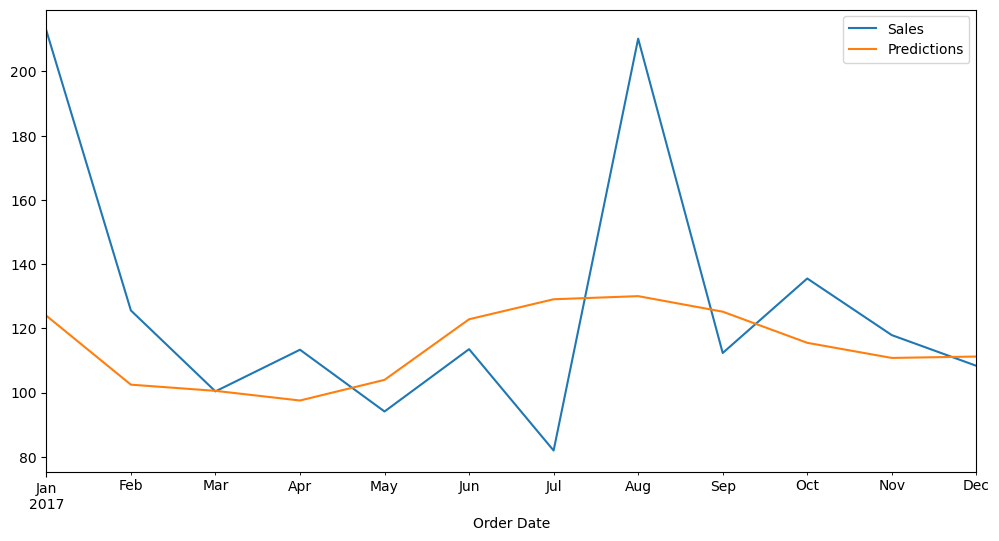

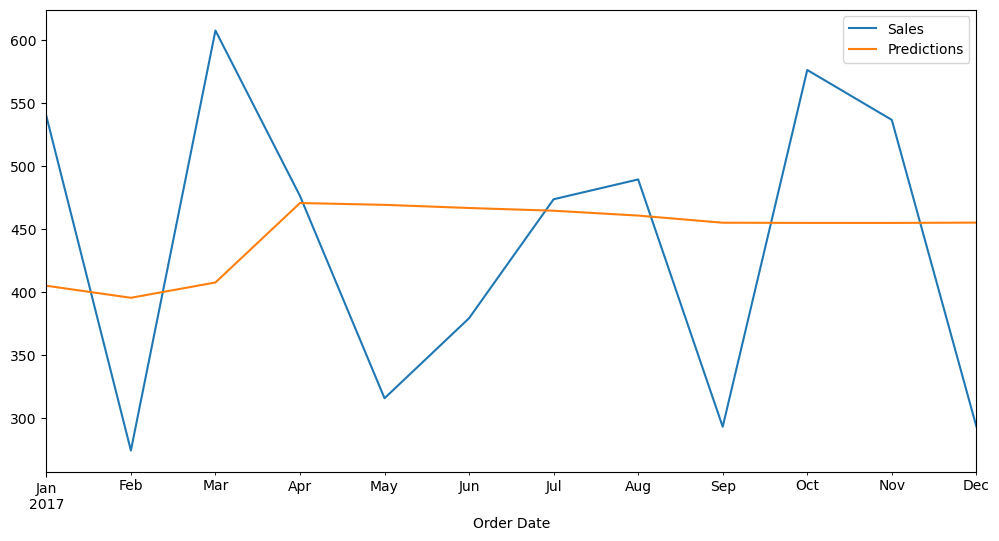

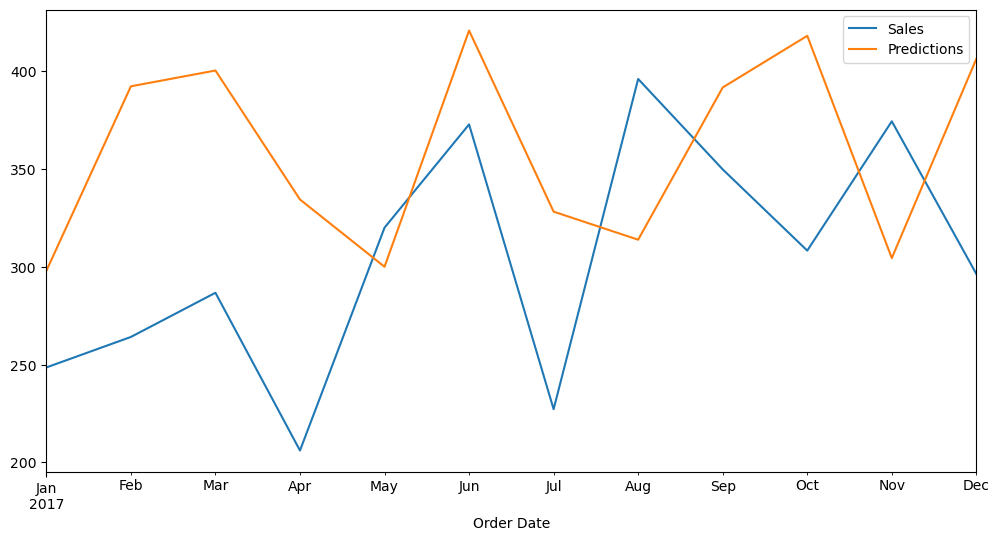

In [120]:
from sklearn.preprocessing import MinMaxScaler
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.layers import Dense, LSTM
import numpy as np

# Define the input parameters
n_input = 5
n_features = 1
epochs = 100

# Create lists for the train and test data
train_data = [train_data_off, train_data_tech, train_data_furn]
test_data = [test_data_off, test_data_tech, test_data_furn]

# Create a loop to iterate over the train and test data
for i in range(len(train_data)):
    # Scale the data
    scaler = MinMaxScaler()
    scaler.fit(train_data[i])
    scaled_train = scaler.transform(train_data[i])
    scaled_test = scaler.transform(test_data[i])
    
    # Define the generator
    generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)
    
    # Define the model
    model = Sequential()
    model.add(LSTM(100, activation='relu', input_shape=(n_input, n_features)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    
    # Fit the model
    model.fit(generator, epochs=epochs, verbose=0)
    
    # Predict the test data
    test_predictions = []
    first_batch = scaled_train[-n_input:]
    current_batch = first_batch.reshape((1, n_input, n_features))
    
    for j in range(len(test_data[i])):
        current_pred = model.predict(current_batch)[0]
        test_predictions.append(current_pred)
        current_batch = np.append(current_batch[:,1:,:],[[current_pred]], axis=1)
    
    true_predictions = scaler.inverse_transform(test_predictions)
    test_data[i]['Predictions'] = true_predictions
    
    # Plot the test data with the predictions
    test_data[i].plot(figsize=(12,6))
    
    # Calculate the RMSE & MAPE for the predictions
    mape = np.mean(np.abs((test_data[i]['Sales'] - test_data[i]['Predictions']) / test_data[i]['Sales'])) * 100
    rmse = np.sqrt(mean_squared_error(test_data[i]['Sales'], test_data[i]['Predictions']))
    print(f"MAPE : {mape:.2f}%")
    print(f"RMSE : {rmse:.2f}")

### Fb Prophet model

12:19:59 - cmdstanpy - INFO - Chain [1] start processing
12:20:02 - cmdstanpy - INFO - Chain [1] done processing


           ds        yhat  yhat_lower  yhat_upper
67 2019-08-01   98.738780   64.783006  132.937385
68 2019-09-01  109.677918   74.842653  141.967187
69 2019-10-01   61.819880   29.526616   97.139150
70 2019-11-01  104.770822   69.315866  140.112200
71 2019-12-01   59.989394   27.523919   94.110699


  0%|          | 0/2 [00:00<?, ?it/s]

12:20:15 - cmdstanpy - INFO - Chain [1] start processing
12:20:16 - cmdstanpy - INFO - Chain [1] done processing
12:20:17 - cmdstanpy - INFO - Chain [1] start processing
12:20:17 - cmdstanpy - INFO - Chain [1] done processing


  horizon           mse        rmse         mae      mape     mdape     smape  \
0 25 days  24637.945871  156.964792  156.964792  0.769128  0.769128  1.249728   
1 29 days   8716.369340   93.361498   93.361498  0.923031  0.923031  0.631557   
2 56 days  14311.293085  119.629817  119.629817  1.269616  1.269616  0.776615   
3 59 days  34855.080365  186.695154  186.695154  1.364513  1.364513  2.000000   
4 86 days    460.937320   21.469451   21.469451  0.230585  0.230585  0.206749   

   coverage  
0       0.0  
1       0.0  
2       0.0  
3       0.0  
4       1.0  


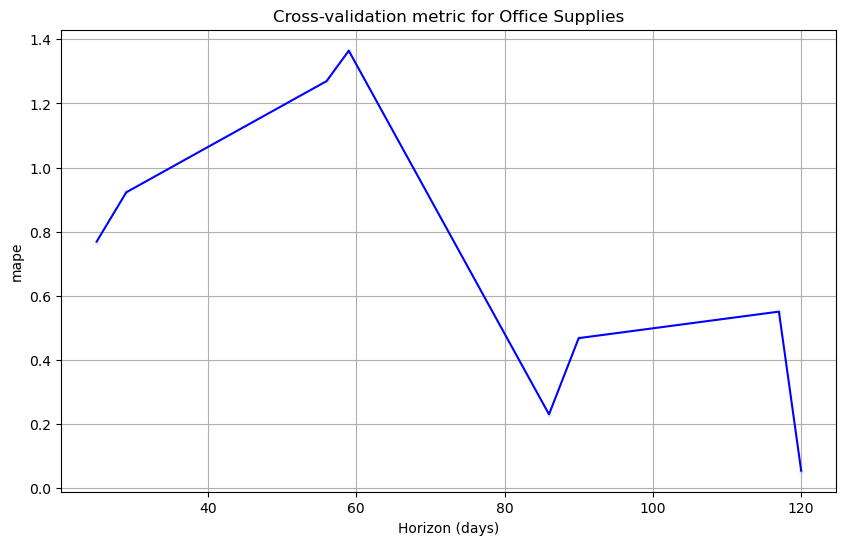

12:20:18 - cmdstanpy - INFO - Chain [1] start processing
12:20:18 - cmdstanpy - INFO - Chain [1] done processing


           ds        yhat  yhat_lower  yhat_upper
67 2019-08-01  575.550131  368.088830  797.212855
68 2019-09-01  602.681220  395.169957  815.205328
69 2019-10-01  283.075808   83.141717  492.186465
70 2019-11-01  494.438659  291.357367  703.867903
71 2019-12-01  532.944377  332.227990  753.101655


  0%|          | 0/2 [00:00<?, ?it/s]

12:20:19 - cmdstanpy - INFO - Chain [1] start processing
12:20:19 - cmdstanpy - INFO - Chain [1] done processing
12:20:20 - cmdstanpy - INFO - Chain [1] start processing
12:20:20 - cmdstanpy - INFO - Chain [1] done processing


  horizon           mse         rmse          mae      mape     mdape  \
0 25 days  5.195927e+06  2279.457667  2279.457667  3.910447  3.910447   
1 29 days  7.251773e+00     2.692912     2.692912  0.005884  0.005884   
2 56 days  6.910559e+05   831.297727   831.297727  1.228202  1.228202   
3 59 days  6.083027e+05   779.937643   779.937643  0.717278  0.717278   
4 86 days  1.318861e+06  1148.416873  1148.416873  1.672876  1.672876   

      smape  coverage  
0  1.323232       0.0  
1  0.005867       1.0  
2  2.000000       0.0  
3  1.118368       0.0  
4  2.000000       0.0  


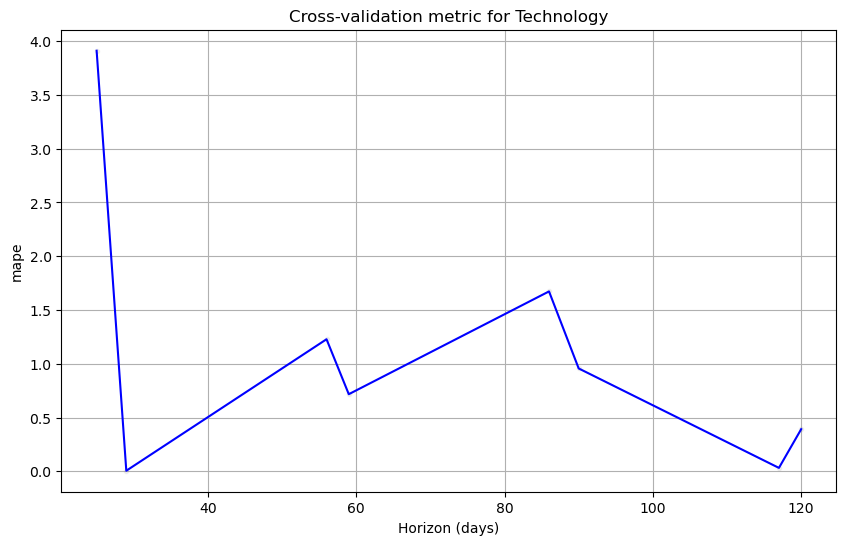

12:20:21 - cmdstanpy - INFO - Chain [1] start processing
12:20:22 - cmdstanpy - INFO - Chain [1] done processing


           ds        yhat  yhat_lower  yhat_upper
67 2019-08-01  270.116651  180.962078  351.899832
68 2019-09-01  428.613349  347.788436  510.777524
69 2019-10-01  343.017572  256.358431  427.904311
70 2019-11-01  351.851795  265.706299  430.327973
71 2019-12-01  346.482490  262.721727  430.588035


  0%|          | 0/2 [00:00<?, ?it/s]

12:20:22 - cmdstanpy - INFO - Chain [1] start processing
12:20:22 - cmdstanpy - INFO - Chain [1] done processing
12:20:23 - cmdstanpy - INFO - Chain [1] start processing
12:20:23 - cmdstanpy - INFO - Chain [1] done processing


  horizon           mse        rmse         mae      mape     mdape     smape  \
0 25 days   9946.265194   99.730964   99.730964  0.319423  0.319423  0.275434   
1 29 days    324.063506   18.001764   18.001764  0.054805  0.054805  0.056349   
2 56 days  20070.577899  141.670667  141.670667  0.375298  0.375298  0.461990   
3 59 days  36494.613508  191.035634  191.035634  0.772344  0.772344  0.557177   
4 86 days  34334.407581  185.295460  185.295460  0.526970  0.526970  0.715492   

   coverage  
0       0.0  
1       1.0  
2       0.0  
3       0.0  
4       0.0  


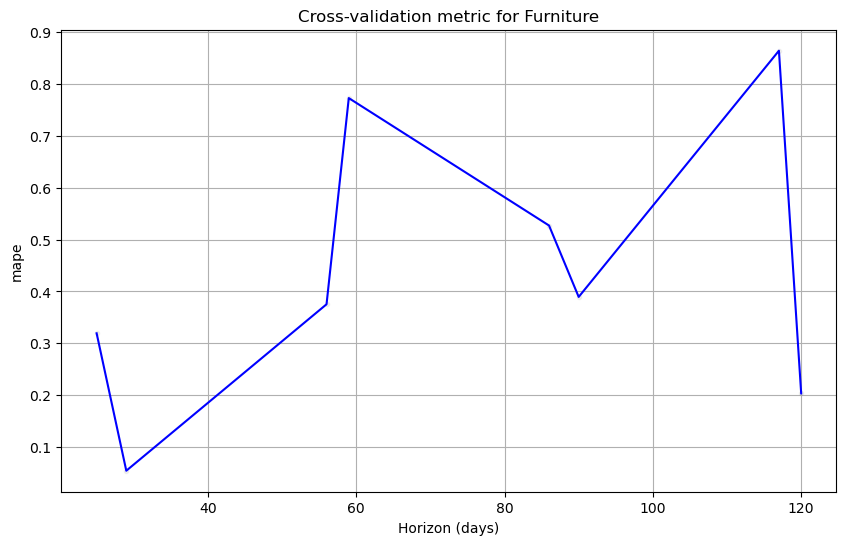

In [121]:
# # create model and run diagnostics

import prophet
from prophet.plot import plot_plotly , plot_components_plotly
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric
import plotly.io as pio

# create a list of dataframes to loop through
dataframes = [officesupp_monthly, tech_monthly, furniture_monthly]
category_names = ['Office Supplies', 'Technology', 'Furniture']

for i, df in enumerate(dataframes):
    # change column names to ds and y
    df.reset_index(inplace=True)
    df = df.rename(columns={'Order Date':'ds','Sales':'y'})

    # split into training and testing 
    split_date= pd.to_datetime('2016-12-31')
    train = df.loc[df['ds'] <= split_date]
    test = df.loc[df['ds'] > split_date]

    # create instance and fit the model
    model = Prophet()
    model.fit(train)
    
    # predict sales for next 1 year
    prediction = model.make_future_dataframe(periods=36, freq='MS')
    forecast = model.predict(prediction)

    print(forecast[['ds','yhat','yhat_lower','yhat_upper']].tail())

    # visualize the forecast 
    fig1 = plot_plotly(model, forecast)
    fig1.update_layout(title=f"Forecast for {category_names[i]}")
    pio.show(fig1)

    # visualize the components 
    fig2 = plot_components_plotly(model, forecast)
    fig2.update_layout(title=f"Components for {category_names[i]}")
    pio.show(fig2)
    
    # perform cross-validation and calculate performance metrics
    cv_results = cross_validation(model, initial='730 days', period='180 days', horizon='120 days')
    metrics = performance_metrics(cv_results)
    print(metrics.head())
    
    # plot the cross validation metric
    fig3 = plot_cross_validation_metric(cv_results, metric='mape')
    plt.title(f"Cross-validation metric for {category_names[i]}")
    plt.show()

The MAPE has decreased for prophet model.